# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

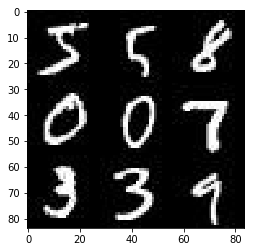

In [14]:
show_n_images = 9

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

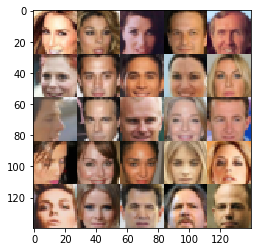

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [22]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32,(None,image_width,image_height,image_channels))
    input_z = tf.placeholder(tf.float32,(None,z_dim))
    learning_rate = tf.placeholder(tf.float32,shape=())

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [98]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope('discriminator',reuse=reuse):
        x1 = tf.layers.conv2d(images,64,4,strides=2,padding='same')
        relu1 = tf.maximum(alpha*images,images)
        
        x2 = tf.layers.conv2d(relu1,128,4,strides=2,padding='same')
        bn2 = tf.layers.batch_normalization(x2,training=True)
        relu2 = tf.maximum(alpha*bn2,bn2)
        
        x3 = tf.layers.conv2d(relu2,256,4,strides=2,padding='same')
        bn3 = tf.layers.batch_normalization(x3,training=True)
        relu3 = tf.maximum(alpha*bn3,bn3)
        
        flat = tf.reshape(relu3,(-1,4*4*256))
        logits = tf.layers.dense(flat,1)
        out=tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [101]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope('generator',reuse= not is_train):
        x1 = tf.layers.dense(z,4*4*512)

        x1 = tf.reshape(x1,(-1,4,4,512))
        x1 = tf.layers.batch_normalization(x1,training=is_train)
        x1 = tf.maximum(alpha*x1,x1)

        x2 = tf.layers.conv2d_transpose(x1,256,4,strides=1,padding='valid')
        x2 = tf.layers.batch_normalization(x2,training=is_train)
        x2 = tf.maximum(alpha*x2,x2)

        x3 = tf.layers.conv2d_transpose(x2,128,4,strides=2,padding='same')
        x3 = tf.layers.batch_normalization(x3,training=is_train)
        x3 = tf.maximum(alpha*x3,x3)
        
        #x4 = tf.layers.conv2d_transpose(x3,64,4,strides=1,padding='same')
        #x4 = tf.layers.batch_normalization(x4,training=is_train)
        #x4 = tf.maximum(alpha*x4,x4)

        logits = tf.layers.conv2d_transpose(x3,out_channel_dim,4,strides=2,padding='same')
        #logits = tf.maximum(alpha*logits,logits)

        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [102]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z,out_channel_dim,True)
    d_model_real,d_logits_real = discriminator(input_real,False)
    d_model_fake,d_logits_fake = discriminator(g_model,True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,labels=tf.ones_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [103]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss,var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss,var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [95]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [104]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    num_batches,image_width,image_height,image_channels = data_shape
    input_real,input_z,lr = model_inputs(image_width,image_height,image_channels,z_dim)
    d_loss,g_loss = model_loss(input_real,input_z,image_channels)
    d_opt,g_opt = model_opt(d_loss,g_loss,learning_rate,beta1)
    
    step = 0
    output_step = 100
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                step += 1
                
                batch_images = batch_images*2
                batch_z = np.random.uniform(-1,1,size=(batch_size,z_dim))
                
                _ = sess.run(d_opt,feed_dict={input_real:batch_images,input_z:batch_z,lr:learning_rate})
                _ = sess.run(g_opt,feed_dict={input_real:batch_images,input_z:batch_z,lr:learning_rate})
                
                d_train_loss = sess.run(d_loss,feed_dict={input_real:batch_images,input_z:batch_z,lr:learning_rate})
                g_train_loss = sess.run(g_loss,feed_dict={input_real:batch_images,input_z:batch_z,lr:learning_rate})
                print("{}Epcho {}/{}...".format(step,epoch_i+1,epoch_count),
                      "Discriminator Loss: {:.4f}...".format(d_train_loss),
                      "Generator Loss: {:.4f}".format(g_train_loss))
                
                if step % output_step ==0:
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)

                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

1Epcho 1/2... Discriminator Loss: 7.5107... Generator Loss: 5.9006
2Epcho 1/2... Discriminator Loss: 6.7003... Generator Loss: 0.0881
3Epcho 1/2... Discriminator Loss: 3.0750... Generator Loss: 1.8096
4Epcho 1/2... Discriminator Loss: 3.3679... Generator Loss: 0.6987
5Epcho 1/2... Discriminator Loss: 2.5885... Generator Loss: 2.3975
6Epcho 1/2... Discriminator Loss: 4.1343... Generator Loss: 0.0810
7Epcho 1/2... Discriminator Loss: 5.9344... Generator Loss: 6.7377
8Epcho 1/2... Discriminator Loss: 1.9395... Generator Loss: 0.3833
9Epcho 1/2... Discriminator Loss: 1.9497... Generator Loss: 1.9207
10Epcho 1/2... Discriminator Loss: 2.3176... Generator Loss: 0.1503
11Epcho 1/2... Discriminator Loss: 4.5406... Generator Loss: 5.7769
12Epcho 1/2... Discriminator Loss: 1.8686... Generator Loss: 0.2251
13Epcho 1/2... Discriminator Loss: 2.1425... Generator Loss: 3.5932
14Epcho 1/2... Discriminator Loss: 2.6574... Generator Loss: 0.1098
15Epcho 1/2... Discriminator Loss: 2.6012... Generator Lo

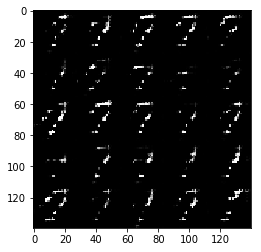

101Epcho 1/2... Discriminator Loss: 1.4236... Generator Loss: 1.7260
102Epcho 1/2... Discriminator Loss: 1.6175... Generator Loss: 0.5061
103Epcho 1/2... Discriminator Loss: 1.5760... Generator Loss: 1.6067
104Epcho 1/2... Discriminator Loss: 1.4245... Generator Loss: 0.5917
105Epcho 1/2... Discriminator Loss: 1.5361... Generator Loss: 1.0474
106Epcho 1/2... Discriminator Loss: 1.5656... Generator Loss: 0.9277
107Epcho 1/2... Discriminator Loss: 1.3855... Generator Loss: 1.1263
108Epcho 1/2... Discriminator Loss: 1.1161... Generator Loss: 0.9196
109Epcho 1/2... Discriminator Loss: 1.0740... Generator Loss: 0.8484
110Epcho 1/2... Discriminator Loss: 1.1006... Generator Loss: 1.0771
111Epcho 1/2... Discriminator Loss: 1.1850... Generator Loss: 0.6074
112Epcho 1/2... Discriminator Loss: 1.2598... Generator Loss: 1.6708
113Epcho 1/2... Discriminator Loss: 1.6163... Generator Loss: 0.3933
114Epcho 1/2... Discriminator Loss: 1.7451... Generator Loss: 1.8230
115Epcho 1/2... Discriminator Loss

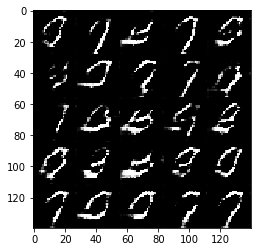

201Epcho 1/2... Discriminator Loss: 1.3527... Generator Loss: 1.0831
202Epcho 1/2... Discriminator Loss: 1.4194... Generator Loss: 0.7185
203Epcho 1/2... Discriminator Loss: 1.2783... Generator Loss: 1.0538
204Epcho 1/2... Discriminator Loss: 1.2121... Generator Loss: 0.6790
205Epcho 1/2... Discriminator Loss: 1.2280... Generator Loss: 0.7433
206Epcho 1/2... Discriminator Loss: 1.1577... Generator Loss: 0.9195
207Epcho 1/2... Discriminator Loss: 1.3247... Generator Loss: 0.6019
208Epcho 1/2... Discriminator Loss: 1.3950... Generator Loss: 1.3137
209Epcho 1/2... Discriminator Loss: 1.5381... Generator Loss: 0.4938
210Epcho 1/2... Discriminator Loss: 1.5988... Generator Loss: 1.3749
211Epcho 1/2... Discriminator Loss: 1.4272... Generator Loss: 0.6122
212Epcho 1/2... Discriminator Loss: 1.3139... Generator Loss: 0.7866
213Epcho 1/2... Discriminator Loss: 1.1923... Generator Loss: 0.8995
214Epcho 1/2... Discriminator Loss: 1.2210... Generator Loss: 0.6998
215Epcho 1/2... Discriminator Loss

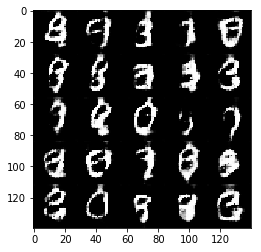

301Epcho 1/2... Discriminator Loss: 1.3287... Generator Loss: 0.8381
302Epcho 1/2... Discriminator Loss: 1.2357... Generator Loss: 0.6081
303Epcho 1/2... Discriminator Loss: 1.3126... Generator Loss: 0.7920
304Epcho 1/2... Discriminator Loss: 1.3532... Generator Loss: 0.5425
305Epcho 1/2... Discriminator Loss: 1.3558... Generator Loss: 0.9229
306Epcho 1/2... Discriminator Loss: 1.3290... Generator Loss: 0.6043
307Epcho 1/2... Discriminator Loss: 1.2638... Generator Loss: 0.7642
308Epcho 1/2... Discriminator Loss: 1.2387... Generator Loss: 0.6940
309Epcho 1/2... Discriminator Loss: 1.3045... Generator Loss: 0.7592
310Epcho 1/2... Discriminator Loss: 1.2410... Generator Loss: 0.7790
311Epcho 1/2... Discriminator Loss: 1.2500... Generator Loss: 0.7662
312Epcho 1/2... Discriminator Loss: 1.2226... Generator Loss: 0.8273
313Epcho 1/2... Discriminator Loss: 1.3696... Generator Loss: 0.5271
314Epcho 1/2... Discriminator Loss: 1.3915... Generator Loss: 1.1745
315Epcho 1/2... Discriminator Loss

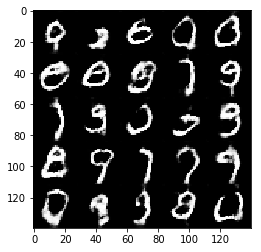

401Epcho 1/2... Discriminator Loss: 1.3229... Generator Loss: 0.9108
402Epcho 1/2... Discriminator Loss: 1.2916... Generator Loss: 0.5576
403Epcho 1/2... Discriminator Loss: 1.2905... Generator Loss: 1.0277
404Epcho 1/2... Discriminator Loss: 1.3774... Generator Loss: 0.4581
405Epcho 1/2... Discriminator Loss: 1.3445... Generator Loss: 1.0573
406Epcho 1/2... Discriminator Loss: 1.3369... Generator Loss: 0.5336
407Epcho 1/2... Discriminator Loss: 1.2650... Generator Loss: 0.8957
408Epcho 1/2... Discriminator Loss: 1.2625... Generator Loss: 0.7174
409Epcho 1/2... Discriminator Loss: 1.3116... Generator Loss: 0.6043
410Epcho 1/2... Discriminator Loss: 1.2789... Generator Loss: 0.7714
411Epcho 1/2... Discriminator Loss: 1.2654... Generator Loss: 0.6845
412Epcho 1/2... Discriminator Loss: 1.3322... Generator Loss: 0.7974
413Epcho 1/2... Discriminator Loss: 1.2856... Generator Loss: 0.5818
414Epcho 1/2... Discriminator Loss: 1.2764... Generator Loss: 0.8918
415Epcho 1/2... Discriminator Loss

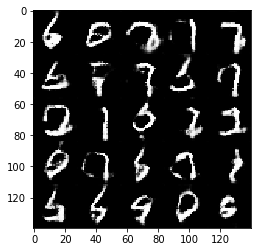

501Epcho 1/2... Discriminator Loss: 1.2972... Generator Loss: 0.6450
502Epcho 1/2... Discriminator Loss: 1.2526... Generator Loss: 0.8503
503Epcho 1/2... Discriminator Loss: 1.2972... Generator Loss: 0.7875
504Epcho 1/2... Discriminator Loss: 1.3431... Generator Loss: 0.6856
505Epcho 1/2... Discriminator Loss: 1.3396... Generator Loss: 0.7515
506Epcho 1/2... Discriminator Loss: 1.3264... Generator Loss: 0.6462
507Epcho 1/2... Discriminator Loss: 1.2932... Generator Loss: 0.7767
508Epcho 1/2... Discriminator Loss: 1.2464... Generator Loss: 0.7285
509Epcho 1/2... Discriminator Loss: 1.3891... Generator Loss: 0.6099
510Epcho 1/2... Discriminator Loss: 1.2926... Generator Loss: 0.7986
511Epcho 1/2... Discriminator Loss: 1.2584... Generator Loss: 0.6813
512Epcho 1/2... Discriminator Loss: 1.2473... Generator Loss: 0.7754
513Epcho 1/2... Discriminator Loss: 1.2768... Generator Loss: 0.7989
514Epcho 1/2... Discriminator Loss: 1.3255... Generator Loss: 0.5587
515Epcho 1/2... Discriminator Loss

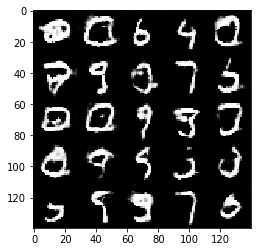

601Epcho 1/2... Discriminator Loss: 1.2658... Generator Loss: 0.8610
602Epcho 1/2... Discriminator Loss: 1.3221... Generator Loss: 0.5466
603Epcho 1/2... Discriminator Loss: 1.3292... Generator Loss: 1.0822
604Epcho 1/2... Discriminator Loss: 1.4368... Generator Loss: 0.4185
605Epcho 1/2... Discriminator Loss: 1.3919... Generator Loss: 0.9953
606Epcho 1/2... Discriminator Loss: 1.3811... Generator Loss: 0.5030
607Epcho 1/2... Discriminator Loss: 1.3124... Generator Loss: 0.7812
608Epcho 1/2... Discriminator Loss: 1.2776... Generator Loss: 0.8151
609Epcho 1/2... Discriminator Loss: 1.3504... Generator Loss: 0.5656
610Epcho 1/2... Discriminator Loss: 1.3297... Generator Loss: 0.9838
611Epcho 1/2... Discriminator Loss: 1.3310... Generator Loss: 0.5171
612Epcho 1/2... Discriminator Loss: 1.2932... Generator Loss: 0.9013
613Epcho 1/2... Discriminator Loss: 1.3493... Generator Loss: 0.5090
614Epcho 1/2... Discriminator Loss: 1.2882... Generator Loss: 1.0869
615Epcho 1/2... Discriminator Loss

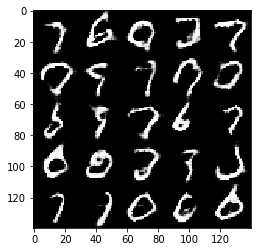

701Epcho 1/2... Discriminator Loss: 1.3316... Generator Loss: 0.5170
702Epcho 1/2... Discriminator Loss: 1.4745... Generator Loss: 0.8744
703Epcho 1/2... Discriminator Loss: 1.4561... Generator Loss: 0.5132
704Epcho 1/2... Discriminator Loss: 1.3835... Generator Loss: 0.9335
705Epcho 1/2... Discriminator Loss: 1.3957... Generator Loss: 0.4879
706Epcho 1/2... Discriminator Loss: 1.2635... Generator Loss: 1.0272
707Epcho 1/2... Discriminator Loss: 1.4348... Generator Loss: 0.4457
708Epcho 1/2... Discriminator Loss: 1.3245... Generator Loss: 1.0633
709Epcho 1/2... Discriminator Loss: 1.3765... Generator Loss: 0.4906
710Epcho 1/2... Discriminator Loss: 1.2863... Generator Loss: 0.9975
711Epcho 1/2... Discriminator Loss: 1.3993... Generator Loss: 0.5233
712Epcho 1/2... Discriminator Loss: 1.2797... Generator Loss: 0.9638
713Epcho 1/2... Discriminator Loss: 1.3004... Generator Loss: 0.5884
714Epcho 1/2... Discriminator Loss: 1.2384... Generator Loss: 0.9020
715Epcho 1/2... Discriminator Loss

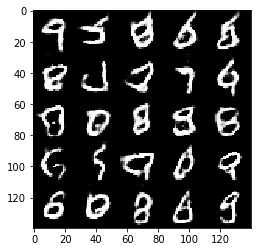

801Epcho 1/2... Discriminator Loss: 1.2403... Generator Loss: 0.6456
802Epcho 1/2... Discriminator Loss: 1.2709... Generator Loss: 0.9928
803Epcho 1/2... Discriminator Loss: 1.4499... Generator Loss: 0.4631
804Epcho 1/2... Discriminator Loss: 1.5231... Generator Loss: 1.2075
805Epcho 1/2... Discriminator Loss: 1.5281... Generator Loss: 0.5338
806Epcho 1/2... Discriminator Loss: 1.5054... Generator Loss: 0.9791
807Epcho 1/2... Discriminator Loss: 1.3298... Generator Loss: 0.6526
808Epcho 1/2... Discriminator Loss: 1.2474... Generator Loss: 0.9037
809Epcho 1/2... Discriminator Loss: 1.2500... Generator Loss: 0.6685
810Epcho 1/2... Discriminator Loss: 1.2177... Generator Loss: 0.8755
811Epcho 1/2... Discriminator Loss: 1.2607... Generator Loss: 0.6157
812Epcho 1/2... Discriminator Loss: 1.2635... Generator Loss: 0.9585
813Epcho 1/2... Discriminator Loss: 1.2814... Generator Loss: 0.5995
814Epcho 1/2... Discriminator Loss: 1.2754... Generator Loss: 0.8114
815Epcho 1/2... Discriminator Loss

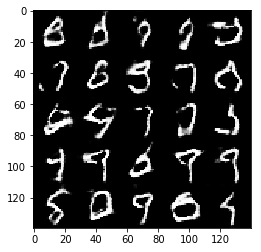

901Epcho 1/2... Discriminator Loss: 1.2843... Generator Loss: 1.1022
902Epcho 1/2... Discriminator Loss: 1.4576... Generator Loss: 0.4005
903Epcho 1/2... Discriminator Loss: 1.4273... Generator Loss: 1.2582
904Epcho 1/2... Discriminator Loss: 1.5037... Generator Loss: 0.3588
905Epcho 1/2... Discriminator Loss: 1.3761... Generator Loss: 1.2363
906Epcho 1/2... Discriminator Loss: 1.3749... Generator Loss: 0.4765
907Epcho 1/2... Discriminator Loss: 1.3093... Generator Loss: 0.9512
908Epcho 1/2... Discriminator Loss: 1.2856... Generator Loss: 0.5892
909Epcho 1/2... Discriminator Loss: 1.2578... Generator Loss: 0.7764
910Epcho 1/2... Discriminator Loss: 1.2848... Generator Loss: 0.7228
911Epcho 1/2... Discriminator Loss: 1.3239... Generator Loss: 0.8540
912Epcho 1/2... Discriminator Loss: 1.5228... Generator Loss: 0.9412
913Epcho 1/2... Discriminator Loss: 1.6907... Generator Loss: 1.0764
914Epcho 1/2... Discriminator Loss: 2.3015... Generator Loss: 1.0813
915Epcho 1/2... Discriminator Loss

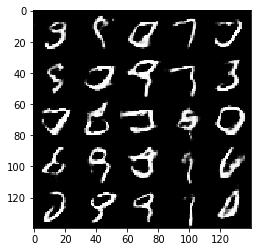

1001Epcho 1/2... Discriminator Loss: 1.3285... Generator Loss: 1.0299
1002Epcho 1/2... Discriminator Loss: 1.3279... Generator Loss: 0.5036
1003Epcho 1/2... Discriminator Loss: 1.3292... Generator Loss: 1.1314
1004Epcho 1/2... Discriminator Loss: 1.3642... Generator Loss: 0.4756
1005Epcho 1/2... Discriminator Loss: 1.2980... Generator Loss: 1.0760
1006Epcho 1/2... Discriminator Loss: 1.4327... Generator Loss: 0.4344
1007Epcho 1/2... Discriminator Loss: 1.3102... Generator Loss: 1.0966
1008Epcho 1/2... Discriminator Loss: 1.3198... Generator Loss: 0.5150
1009Epcho 1/2... Discriminator Loss: 1.2994... Generator Loss: 0.9687
1010Epcho 1/2... Discriminator Loss: 1.3071... Generator Loss: 0.5942
1011Epcho 1/2... Discriminator Loss: 1.2637... Generator Loss: 0.9174
1012Epcho 1/2... Discriminator Loss: 1.2597... Generator Loss: 0.6015
1013Epcho 1/2... Discriminator Loss: 1.2203... Generator Loss: 0.9927
1014Epcho 1/2... Discriminator Loss: 1.3068... Generator Loss: 0.5547
1015Epcho 1/2... Dis

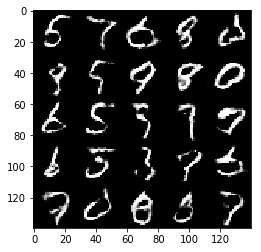

1101Epcho 1/2... Discriminator Loss: 1.4853... Generator Loss: 0.3771
1102Epcho 1/2... Discriminator Loss: 1.3877... Generator Loss: 1.1774
1103Epcho 1/2... Discriminator Loss: 1.3849... Generator Loss: 0.4719
1104Epcho 1/2... Discriminator Loss: 1.3052... Generator Loss: 0.9279
1105Epcho 1/2... Discriminator Loss: 1.2550... Generator Loss: 0.6381
1106Epcho 1/2... Discriminator Loss: 1.2706... Generator Loss: 0.7254
1107Epcho 1/2... Discriminator Loss: 1.2755... Generator Loss: 0.7091
1108Epcho 1/2... Discriminator Loss: 1.2912... Generator Loss: 0.7059
1109Epcho 1/2... Discriminator Loss: 1.2411... Generator Loss: 0.7603
1110Epcho 1/2... Discriminator Loss: 1.2535... Generator Loss: 0.7277
1111Epcho 1/2... Discriminator Loss: 1.2317... Generator Loss: 0.7991
1112Epcho 1/2... Discriminator Loss: 1.2699... Generator Loss: 0.6381
1113Epcho 1/2... Discriminator Loss: 1.2959... Generator Loss: 0.9623
1114Epcho 1/2... Discriminator Loss: 1.3260... Generator Loss: 0.5411
1115Epcho 1/2... Dis

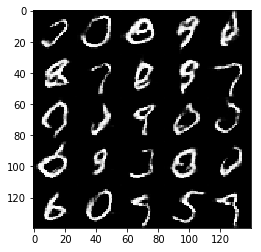

1201Epcho 1/2... Discriminator Loss: 1.2320... Generator Loss: 0.6877
1202Epcho 1/2... Discriminator Loss: 1.1956... Generator Loss: 0.7823
1203Epcho 1/2... Discriminator Loss: 1.2911... Generator Loss: 0.6580
1204Epcho 1/2... Discriminator Loss: 1.2972... Generator Loss: 0.9369
1205Epcho 1/2... Discriminator Loss: 1.3846... Generator Loss: 0.4630
1206Epcho 1/2... Discriminator Loss: 1.2898... Generator Loss: 1.2557
1207Epcho 1/2... Discriminator Loss: 1.4264... Generator Loss: 0.4009
1208Epcho 1/2... Discriminator Loss: 1.3358... Generator Loss: 1.2659
1209Epcho 1/2... Discriminator Loss: 1.4402... Generator Loss: 0.4011
1210Epcho 1/2... Discriminator Loss: 1.3712... Generator Loss: 1.1698
1211Epcho 1/2... Discriminator Loss: 1.3641... Generator Loss: 0.4869
1212Epcho 1/2... Discriminator Loss: 1.3189... Generator Loss: 0.9596
1213Epcho 1/2... Discriminator Loss: 1.3194... Generator Loss: 0.5715
1214Epcho 1/2... Discriminator Loss: 1.2999... Generator Loss: 0.8493
1215Epcho 1/2... Dis

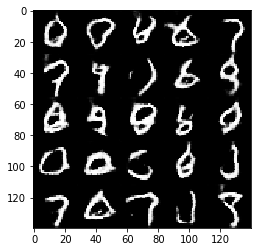

1301Epcho 1/2... Discriminator Loss: 1.2297... Generator Loss: 1.0367
1302Epcho 1/2... Discriminator Loss: 1.4057... Generator Loss: 0.4361
1303Epcho 1/2... Discriminator Loss: 1.3888... Generator Loss: 1.2625
1304Epcho 1/2... Discriminator Loss: 1.4311... Generator Loss: 0.3966
1305Epcho 1/2... Discriminator Loss: 1.3783... Generator Loss: 1.3154
1306Epcho 1/2... Discriminator Loss: 1.4492... Generator Loss: 0.4170
1307Epcho 1/2... Discriminator Loss: 1.3098... Generator Loss: 1.0675
1308Epcho 1/2... Discriminator Loss: 1.2498... Generator Loss: 0.5638
1309Epcho 1/2... Discriminator Loss: 1.3356... Generator Loss: 0.8070
1310Epcho 1/2... Discriminator Loss: 1.2308... Generator Loss: 0.8363
1311Epcho 1/2... Discriminator Loss: 1.2656... Generator Loss: 0.6372
1312Epcho 1/2... Discriminator Loss: 1.2311... Generator Loss: 0.8504
1313Epcho 1/2... Discriminator Loss: 1.2377... Generator Loss: 0.6208
1314Epcho 1/2... Discriminator Loss: 1.3080... Generator Loss: 0.8648
1315Epcho 1/2... Dis

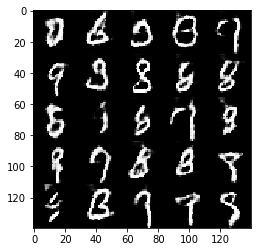

1401Epcho 1/2... Discriminator Loss: 1.2190... Generator Loss: 0.6476
1402Epcho 1/2... Discriminator Loss: 1.2919... Generator Loss: 0.6766
1403Epcho 1/2... Discriminator Loss: 1.2006... Generator Loss: 0.9367
1404Epcho 1/2... Discriminator Loss: 1.2353... Generator Loss: 0.6760
1405Epcho 1/2... Discriminator Loss: 1.2915... Generator Loss: 0.7595
1406Epcho 1/2... Discriminator Loss: 1.2475... Generator Loss: 0.6631
1407Epcho 1/2... Discriminator Loss: 1.1844... Generator Loss: 0.8500
1408Epcho 1/2... Discriminator Loss: 1.2614... Generator Loss: 0.6971
1409Epcho 1/2... Discriminator Loss: 1.3131... Generator Loss: 0.7223
1410Epcho 1/2... Discriminator Loss: 1.1616... Generator Loss: 0.9076
1411Epcho 1/2... Discriminator Loss: 1.3039... Generator Loss: 0.5773
1412Epcho 1/2... Discriminator Loss: 1.1596... Generator Loss: 0.9372
1413Epcho 1/2... Discriminator Loss: 1.2060... Generator Loss: 0.7339
1414Epcho 1/2... Discriminator Loss: 1.1735... Generator Loss: 0.7720
1415Epcho 1/2... Dis

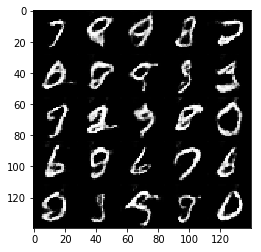

1501Epcho 1/2... Discriminator Loss: 1.2655... Generator Loss: 0.5716
1502Epcho 1/2... Discriminator Loss: 1.3127... Generator Loss: 1.0095
1503Epcho 1/2... Discriminator Loss: 1.2310... Generator Loss: 0.6087
1504Epcho 1/2... Discriminator Loss: 1.1725... Generator Loss: 0.9020
1505Epcho 1/2... Discriminator Loss: 1.2101... Generator Loss: 0.7496
1506Epcho 1/2... Discriminator Loss: 1.2243... Generator Loss: 0.7546
1507Epcho 1/2... Discriminator Loss: 1.1942... Generator Loss: 0.8412
1508Epcho 1/2... Discriminator Loss: 1.2577... Generator Loss: 0.6287
1509Epcho 1/2... Discriminator Loss: 1.2106... Generator Loss: 1.0234
1510Epcho 1/2... Discriminator Loss: 1.3175... Generator Loss: 0.5028
1511Epcho 1/2... Discriminator Loss: 1.2714... Generator Loss: 1.1614
1512Epcho 1/2... Discriminator Loss: 1.3546... Generator Loss: 0.4589
1513Epcho 1/2... Discriminator Loss: 1.3145... Generator Loss: 0.9544
1514Epcho 1/2... Discriminator Loss: 1.2297... Generator Loss: 0.6710
1515Epcho 1/2... Dis

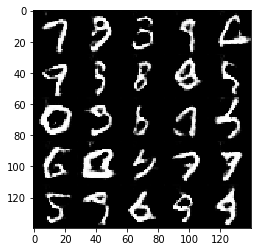

1601Epcho 1/2... Discriminator Loss: 1.2665... Generator Loss: 0.9937
1602Epcho 1/2... Discriminator Loss: 1.3827... Generator Loss: 0.4660
1603Epcho 1/2... Discriminator Loss: 1.4808... Generator Loss: 1.1302
1604Epcho 1/2... Discriminator Loss: 1.4285... Generator Loss: 0.4070
1605Epcho 1/2... Discriminator Loss: 1.4112... Generator Loss: 1.4058
1606Epcho 1/2... Discriminator Loss: 1.5521... Generator Loss: 0.3423
1607Epcho 1/2... Discriminator Loss: 1.3863... Generator Loss: 1.3411
1608Epcho 1/2... Discriminator Loss: 1.3332... Generator Loss: 0.4802
1609Epcho 1/2... Discriminator Loss: 1.3555... Generator Loss: 0.9606
1610Epcho 1/2... Discriminator Loss: 1.2908... Generator Loss: 0.5526
1611Epcho 1/2... Discriminator Loss: 1.2563... Generator Loss: 1.0031
1612Epcho 1/2... Discriminator Loss: 1.2546... Generator Loss: 0.6226
1613Epcho 1/2... Discriminator Loss: 1.2422... Generator Loss: 0.8470
1614Epcho 1/2... Discriminator Loss: 1.2654... Generator Loss: 0.6704
1615Epcho 1/2... Dis

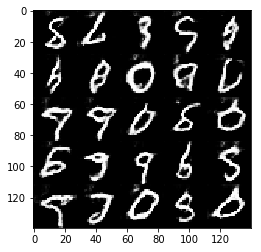

1701Epcho 1/2... Discriminator Loss: 1.2531... Generator Loss: 0.9135
1702Epcho 1/2... Discriminator Loss: 1.2831... Generator Loss: 0.5426
1703Epcho 1/2... Discriminator Loss: 1.1875... Generator Loss: 1.0577
1704Epcho 1/2... Discriminator Loss: 1.2667... Generator Loss: 0.5074
1705Epcho 1/2... Discriminator Loss: 1.2906... Generator Loss: 1.1619
1706Epcho 1/2... Discriminator Loss: 1.2649... Generator Loss: 0.4986
1707Epcho 1/2... Discriminator Loss: 1.2299... Generator Loss: 1.0662
1708Epcho 1/2... Discriminator Loss: 1.2738... Generator Loss: 0.5374
1709Epcho 1/2... Discriminator Loss: 1.1897... Generator Loss: 1.0045
1710Epcho 1/2... Discriminator Loss: 1.3092... Generator Loss: 0.5068
1711Epcho 1/2... Discriminator Loss: 1.3650... Generator Loss: 1.1539
1712Epcho 1/2... Discriminator Loss: 1.5521... Generator Loss: 0.4082
1713Epcho 1/2... Discriminator Loss: 1.3375... Generator Loss: 1.1815
1714Epcho 1/2... Discriminator Loss: 1.3807... Generator Loss: 0.4915
1715Epcho 1/2... Dis

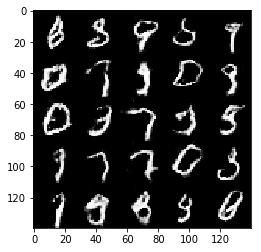

1801Epcho 1/2... Discriminator Loss: 1.2781... Generator Loss: 0.6338
1802Epcho 1/2... Discriminator Loss: 1.3346... Generator Loss: 0.8758
1803Epcho 1/2... Discriminator Loss: 1.2889... Generator Loss: 0.7821
1804Epcho 1/2... Discriminator Loss: 1.2137... Generator Loss: 0.8063
1805Epcho 1/2... Discriminator Loss: 1.3003... Generator Loss: 0.7118
1806Epcho 1/2... Discriminator Loss: 1.1955... Generator Loss: 0.7607
1807Epcho 1/2... Discriminator Loss: 1.2270... Generator Loss: 0.8466
1808Epcho 1/2... Discriminator Loss: 1.2497... Generator Loss: 0.6432
1809Epcho 1/2... Discriminator Loss: 1.2551... Generator Loss: 0.9145
1810Epcho 1/2... Discriminator Loss: 1.3167... Generator Loss: 0.5455
1811Epcho 1/2... Discriminator Loss: 1.2637... Generator Loss: 1.1125
1812Epcho 1/2... Discriminator Loss: 1.3660... Generator Loss: 0.4290
1813Epcho 1/2... Discriminator Loss: 1.3325... Generator Loss: 1.3001
1814Epcho 1/2... Discriminator Loss: 1.4682... Generator Loss: 0.3690
1815Epcho 1/2... Dis

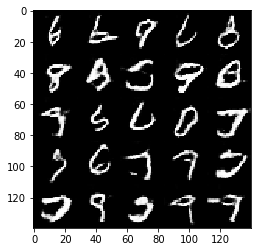

1901Epcho 2/2... Discriminator Loss: 1.1947... Generator Loss: 0.8484
1902Epcho 2/2... Discriminator Loss: 1.1893... Generator Loss: 0.7666
1903Epcho 2/2... Discriminator Loss: 1.2750... Generator Loss: 0.6984
1904Epcho 2/2... Discriminator Loss: 1.2772... Generator Loss: 0.8350
1905Epcho 2/2... Discriminator Loss: 1.3568... Generator Loss: 0.5245
1906Epcho 2/2... Discriminator Loss: 1.2946... Generator Loss: 1.0238
1907Epcho 2/2... Discriminator Loss: 1.2559... Generator Loss: 0.5931
1908Epcho 2/2... Discriminator Loss: 1.1775... Generator Loss: 0.9223
1909Epcho 2/2... Discriminator Loss: 1.2444... Generator Loss: 0.6508
1910Epcho 2/2... Discriminator Loss: 1.2386... Generator Loss: 0.9259
1911Epcho 2/2... Discriminator Loss: 1.2262... Generator Loss: 0.6302
1912Epcho 2/2... Discriminator Loss: 1.1896... Generator Loss: 0.7935
1913Epcho 2/2... Discriminator Loss: 1.2726... Generator Loss: 0.8184
1914Epcho 2/2... Discriminator Loss: 1.2001... Generator Loss: 0.6848
1915Epcho 2/2... Dis

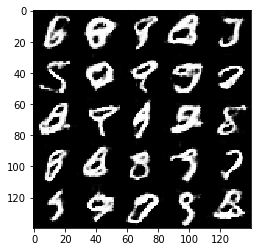

2001Epcho 2/2... Discriminator Loss: 1.2928... Generator Loss: 0.5051
2002Epcho 2/2... Discriminator Loss: 1.2546... Generator Loss: 1.0730
2003Epcho 2/2... Discriminator Loss: 1.2871... Generator Loss: 0.5358
2004Epcho 2/2... Discriminator Loss: 1.3033... Generator Loss: 0.9618
2005Epcho 2/2... Discriminator Loss: 1.2433... Generator Loss: 0.5559
2006Epcho 2/2... Discriminator Loss: 1.2745... Generator Loss: 1.1133
2007Epcho 2/2... Discriminator Loss: 1.3871... Generator Loss: 0.4593
2008Epcho 2/2... Discriminator Loss: 1.3296... Generator Loss: 1.2590
2009Epcho 2/2... Discriminator Loss: 1.4713... Generator Loss: 0.3714
2010Epcho 2/2... Discriminator Loss: 1.4449... Generator Loss: 1.3120
2011Epcho 2/2... Discriminator Loss: 1.4948... Generator Loss: 0.3799
2012Epcho 2/2... Discriminator Loss: 1.3068... Generator Loss: 1.1669
2013Epcho 2/2... Discriminator Loss: 1.3393... Generator Loss: 0.5151
2014Epcho 2/2... Discriminator Loss: 1.2132... Generator Loss: 1.0063
2015Epcho 2/2... Dis

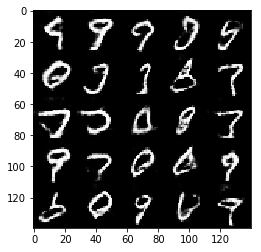

2101Epcho 2/2... Discriminator Loss: 1.2346... Generator Loss: 0.7233
2102Epcho 2/2... Discriminator Loss: 1.2023... Generator Loss: 0.8353
2103Epcho 2/2... Discriminator Loss: 1.1462... Generator Loss: 0.7660
2104Epcho 2/2... Discriminator Loss: 1.1906... Generator Loss: 0.7341
2105Epcho 2/2... Discriminator Loss: 1.1785... Generator Loss: 1.0130
2106Epcho 2/2... Discriminator Loss: 1.3781... Generator Loss: 0.4604
2107Epcho 2/2... Discriminator Loss: 1.3646... Generator Loss: 1.2073
2108Epcho 2/2... Discriminator Loss: 1.3596... Generator Loss: 0.4523
2109Epcho 2/2... Discriminator Loss: 1.2439... Generator Loss: 1.1606
2110Epcho 2/2... Discriminator Loss: 1.3442... Generator Loss: 0.4930
2111Epcho 2/2... Discriminator Loss: 1.3037... Generator Loss: 0.8847
2112Epcho 2/2... Discriminator Loss: 1.2664... Generator Loss: 0.6961
2113Epcho 2/2... Discriminator Loss: 1.2352... Generator Loss: 0.6836
2114Epcho 2/2... Discriminator Loss: 1.1459... Generator Loss: 0.9255
2115Epcho 2/2... Dis

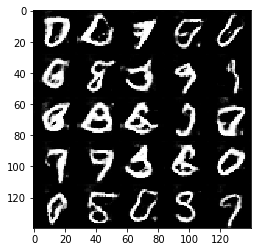

2201Epcho 2/2... Discriminator Loss: 1.2710... Generator Loss: 1.1662
2202Epcho 2/2... Discriminator Loss: 1.3543... Generator Loss: 0.4749
2203Epcho 2/2... Discriminator Loss: 1.2990... Generator Loss: 1.1895
2204Epcho 2/2... Discriminator Loss: 1.3556... Generator Loss: 0.5685
2205Epcho 2/2... Discriminator Loss: 1.2666... Generator Loss: 0.8660
2206Epcho 2/2... Discriminator Loss: 1.2380... Generator Loss: 0.7919
2207Epcho 2/2... Discriminator Loss: 1.3465... Generator Loss: 0.8256
2208Epcho 2/2... Discriminator Loss: 1.4516... Generator Loss: 0.8871
2209Epcho 2/2... Discriminator Loss: 1.3475... Generator Loss: 0.6872
2210Epcho 2/2... Discriminator Loss: 1.2433... Generator Loss: 0.8827
2211Epcho 2/2... Discriminator Loss: 1.2336... Generator Loss: 0.8153
2212Epcho 2/2... Discriminator Loss: 1.3333... Generator Loss: 0.6577
2213Epcho 2/2... Discriminator Loss: 1.2283... Generator Loss: 0.8637
2214Epcho 2/2... Discriminator Loss: 1.2100... Generator Loss: 0.6955
2215Epcho 2/2... Dis

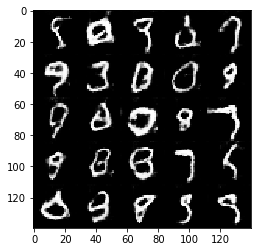

2301Epcho 2/2... Discriminator Loss: 1.3255... Generator Loss: 0.6455
2302Epcho 2/2... Discriminator Loss: 1.3548... Generator Loss: 0.8604
2303Epcho 2/2... Discriminator Loss: 1.3750... Generator Loss: 0.5042
2304Epcho 2/2... Discriminator Loss: 1.3242... Generator Loss: 1.0472
2305Epcho 2/2... Discriminator Loss: 1.3302... Generator Loss: 0.4964
2306Epcho 2/2... Discriminator Loss: 1.2617... Generator Loss: 1.1108
2307Epcho 2/2... Discriminator Loss: 1.3801... Generator Loss: 0.4564
2308Epcho 2/2... Discriminator Loss: 1.2420... Generator Loss: 1.1788
2309Epcho 2/2... Discriminator Loss: 1.4794... Generator Loss: 0.3817
2310Epcho 2/2... Discriminator Loss: 1.4021... Generator Loss: 1.2662
2311Epcho 2/2... Discriminator Loss: 1.3961... Generator Loss: 0.4219
2312Epcho 2/2... Discriminator Loss: 1.3672... Generator Loss: 1.0289
2313Epcho 2/2... Discriminator Loss: 1.3421... Generator Loss: 0.4957
2314Epcho 2/2... Discriminator Loss: 1.1941... Generator Loss: 0.9716
2315Epcho 2/2... Dis

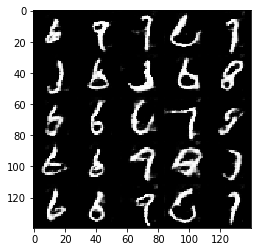

2401Epcho 2/2... Discriminator Loss: 1.2364... Generator Loss: 1.1884
2402Epcho 2/2... Discriminator Loss: 1.2663... Generator Loss: 0.6416
2403Epcho 2/2... Discriminator Loss: 1.0601... Generator Loss: 0.8449
2404Epcho 2/2... Discriminator Loss: 1.1192... Generator Loss: 0.8016
2405Epcho 2/2... Discriminator Loss: 1.1987... Generator Loss: 0.8199
2406Epcho 2/2... Discriminator Loss: 1.2032... Generator Loss: 0.6367
2407Epcho 2/2... Discriminator Loss: 1.2703... Generator Loss: 0.8465
2408Epcho 2/2... Discriminator Loss: 1.3070... Generator Loss: 0.7071
2409Epcho 2/2... Discriminator Loss: 1.3484... Generator Loss: 0.5797
2410Epcho 2/2... Discriminator Loss: 1.3525... Generator Loss: 1.1682
2411Epcho 2/2... Discriminator Loss: 1.4542... Generator Loss: 0.3921
2412Epcho 2/2... Discriminator Loss: 1.2807... Generator Loss: 1.2149
2413Epcho 2/2... Discriminator Loss: 1.2363... Generator Loss: 0.6012
2414Epcho 2/2... Discriminator Loss: 1.1831... Generator Loss: 0.8794
2415Epcho 2/2... Dis

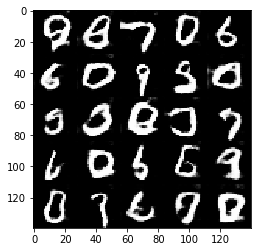

2501Epcho 2/2... Discriminator Loss: 1.1634... Generator Loss: 0.7724
2502Epcho 2/2... Discriminator Loss: 1.1225... Generator Loss: 0.8216
2503Epcho 2/2... Discriminator Loss: 1.2029... Generator Loss: 0.7317
2504Epcho 2/2... Discriminator Loss: 1.2079... Generator Loss: 0.9190
2505Epcho 2/2... Discriminator Loss: 1.2196... Generator Loss: 0.6208
2506Epcho 2/2... Discriminator Loss: 1.2248... Generator Loss: 1.1757
2507Epcho 2/2... Discriminator Loss: 1.4736... Generator Loss: 0.4543
2508Epcho 2/2... Discriminator Loss: 1.4220... Generator Loss: 1.4715
2509Epcho 2/2... Discriminator Loss: 1.4407... Generator Loss: 0.3883
2510Epcho 2/2... Discriminator Loss: 1.4095... Generator Loss: 1.2837
2511Epcho 2/2... Discriminator Loss: 1.5299... Generator Loss: 0.4117
2512Epcho 2/2... Discriminator Loss: 1.3127... Generator Loss: 1.3336
2513Epcho 2/2... Discriminator Loss: 1.3559... Generator Loss: 0.5067
2514Epcho 2/2... Discriminator Loss: 1.4476... Generator Loss: 1.1019
2515Epcho 2/2... Dis

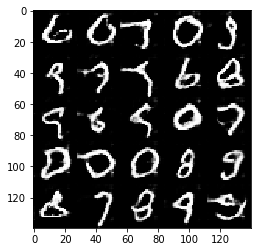

2601Epcho 2/2... Discriminator Loss: 1.2478... Generator Loss: 0.6438
2602Epcho 2/2... Discriminator Loss: 1.1432... Generator Loss: 1.0130
2603Epcho 2/2... Discriminator Loss: 1.2289... Generator Loss: 0.6041
2604Epcho 2/2... Discriminator Loss: 1.2725... Generator Loss: 1.2452
2605Epcho 2/2... Discriminator Loss: 1.3996... Generator Loss: 0.4087
2606Epcho 2/2... Discriminator Loss: 1.2915... Generator Loss: 1.4610
2607Epcho 2/2... Discriminator Loss: 1.3981... Generator Loss: 0.4482
2608Epcho 2/2... Discriminator Loss: 1.2228... Generator Loss: 1.2611
2609Epcho 2/2... Discriminator Loss: 1.2460... Generator Loss: 0.5386
2610Epcho 2/2... Discriminator Loss: 1.3003... Generator Loss: 1.0931
2611Epcho 2/2... Discriminator Loss: 1.1923... Generator Loss: 0.5881
2612Epcho 2/2... Discriminator Loss: 1.1510... Generator Loss: 1.0466
2613Epcho 2/2... Discriminator Loss: 1.2317... Generator Loss: 0.5851
2614Epcho 2/2... Discriminator Loss: 1.2011... Generator Loss: 0.7950
2615Epcho 2/2... Dis

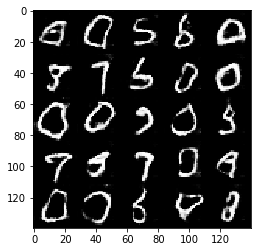

2701Epcho 2/2... Discriminator Loss: 1.3769... Generator Loss: 0.4288
2702Epcho 2/2... Discriminator Loss: 1.3198... Generator Loss: 1.3273
2703Epcho 2/2... Discriminator Loss: 1.3507... Generator Loss: 0.4620
2704Epcho 2/2... Discriminator Loss: 1.3148... Generator Loss: 1.2425
2705Epcho 2/2... Discriminator Loss: 1.2493... Generator Loss: 0.6109
2706Epcho 2/2... Discriminator Loss: 1.3134... Generator Loss: 0.9353
2707Epcho 2/2... Discriminator Loss: 1.2839... Generator Loss: 0.6314
2708Epcho 2/2... Discriminator Loss: 1.2621... Generator Loss: 0.7704
2709Epcho 2/2... Discriminator Loss: 1.1553... Generator Loss: 0.9842
2710Epcho 2/2... Discriminator Loss: 1.2917... Generator Loss: 0.5423
2711Epcho 2/2... Discriminator Loss: 1.1749... Generator Loss: 0.9668
2712Epcho 2/2... Discriminator Loss: 1.2455... Generator Loss: 0.6398
2713Epcho 2/2... Discriminator Loss: 1.1664... Generator Loss: 0.9235
2714Epcho 2/2... Discriminator Loss: 1.2039... Generator Loss: 0.5976
2715Epcho 2/2... Dis

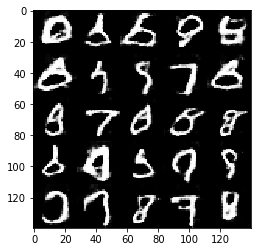

2801Epcho 2/2... Discriminator Loss: 1.3217... Generator Loss: 0.8837
2802Epcho 2/2... Discriminator Loss: 1.2240... Generator Loss: 0.7766
2803Epcho 2/2... Discriminator Loss: 1.1628... Generator Loss: 0.7491
2804Epcho 2/2... Discriminator Loss: 1.2287... Generator Loss: 0.8010
2805Epcho 2/2... Discriminator Loss: 1.2425... Generator Loss: 0.7405
2806Epcho 2/2... Discriminator Loss: 1.2731... Generator Loss: 0.7666
2807Epcho 2/2... Discriminator Loss: 1.2502... Generator Loss: 0.6798
2808Epcho 2/2... Discriminator Loss: 1.2686... Generator Loss: 0.7654
2809Epcho 2/2... Discriminator Loss: 1.3549... Generator Loss: 0.6259
2810Epcho 2/2... Discriminator Loss: 1.2880... Generator Loss: 0.9305
2811Epcho 2/2... Discriminator Loss: 1.3686... Generator Loss: 0.5339
2812Epcho 2/2... Discriminator Loss: 1.2181... Generator Loss: 1.0655
2813Epcho 2/2... Discriminator Loss: 1.3422... Generator Loss: 0.5148
2814Epcho 2/2... Discriminator Loss: 1.2253... Generator Loss: 0.9941
2815Epcho 2/2... Dis

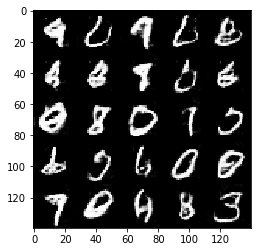

2901Epcho 2/2... Discriminator Loss: 1.2347... Generator Loss: 0.8579
2902Epcho 2/2... Discriminator Loss: 1.1797... Generator Loss: 0.7101
2903Epcho 2/2... Discriminator Loss: 1.2276... Generator Loss: 0.9644
2904Epcho 2/2... Discriminator Loss: 1.2840... Generator Loss: 0.5534
2905Epcho 2/2... Discriminator Loss: 1.2661... Generator Loss: 1.1916
2906Epcho 2/2... Discriminator Loss: 1.3587... Generator Loss: 0.4590
2907Epcho 2/2... Discriminator Loss: 1.3266... Generator Loss: 1.3724
2908Epcho 2/2... Discriminator Loss: 1.4403... Generator Loss: 0.3933
2909Epcho 2/2... Discriminator Loss: 1.2362... Generator Loss: 1.2618
2910Epcho 2/2... Discriminator Loss: 1.1828... Generator Loss: 0.5600
2911Epcho 2/2... Discriminator Loss: 1.2251... Generator Loss: 1.1590
2912Epcho 2/2... Discriminator Loss: 1.2403... Generator Loss: 0.5186
2913Epcho 2/2... Discriminator Loss: 1.1177... Generator Loss: 1.2548
2914Epcho 2/2... Discriminator Loss: 1.3486... Generator Loss: 0.4770
2915Epcho 2/2... Dis

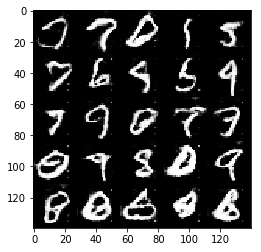

3001Epcho 2/2... Discriminator Loss: 1.2606... Generator Loss: 0.5501
3002Epcho 2/2... Discriminator Loss: 1.2629... Generator Loss: 0.8948
3003Epcho 2/2... Discriminator Loss: 1.1757... Generator Loss: 0.6841
3004Epcho 2/2... Discriminator Loss: 1.1516... Generator Loss: 0.9308
3005Epcho 2/2... Discriminator Loss: 1.2285... Generator Loss: 0.5595
3006Epcho 2/2... Discriminator Loss: 1.2443... Generator Loss: 0.9993
3007Epcho 2/2... Discriminator Loss: 1.2860... Generator Loss: 0.5266
3008Epcho 2/2... Discriminator Loss: 1.3065... Generator Loss: 1.1984
3009Epcho 2/2... Discriminator Loss: 1.4034... Generator Loss: 0.5310
3010Epcho 2/2... Discriminator Loss: 1.3086... Generator Loss: 1.1795
3011Epcho 2/2... Discriminator Loss: 1.3445... Generator Loss: 0.5655
3012Epcho 2/2... Discriminator Loss: 1.1926... Generator Loss: 0.9221
3013Epcho 2/2... Discriminator Loss: 1.1529... Generator Loss: 0.6792
3014Epcho 2/2... Discriminator Loss: 1.2038... Generator Loss: 0.9602
3015Epcho 2/2... Dis

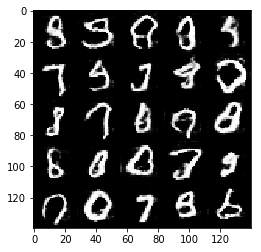

3101Epcho 2/2... Discriminator Loss: 1.1242... Generator Loss: 0.9459
3102Epcho 2/2... Discriminator Loss: 1.2481... Generator Loss: 0.6112
3103Epcho 2/2... Discriminator Loss: 1.1393... Generator Loss: 0.7952
3104Epcho 2/2... Discriminator Loss: 1.2396... Generator Loss: 0.7474
3105Epcho 2/2... Discriminator Loss: 1.2110... Generator Loss: 0.7927
3106Epcho 2/2... Discriminator Loss: 1.2276... Generator Loss: 0.6274
3107Epcho 2/2... Discriminator Loss: 1.1399... Generator Loss: 0.9206
3108Epcho 2/2... Discriminator Loss: 1.1771... Generator Loss: 0.6951
3109Epcho 2/2... Discriminator Loss: 1.2012... Generator Loss: 0.8103
3110Epcho 2/2... Discriminator Loss: 1.1668... Generator Loss: 0.7277
3111Epcho 2/2... Discriminator Loss: 1.2018... Generator Loss: 0.7206
3112Epcho 2/2... Discriminator Loss: 1.1345... Generator Loss: 0.8985
3113Epcho 2/2... Discriminator Loss: 1.2142... Generator Loss: 0.6002
3114Epcho 2/2... Discriminator Loss: 1.2661... Generator Loss: 0.9188
3115Epcho 2/2... Dis

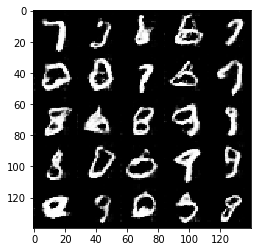

3201Epcho 2/2... Discriminator Loss: 1.4909... Generator Loss: 0.3771
3202Epcho 2/2... Discriminator Loss: 1.5949... Generator Loss: 1.5880
3203Epcho 2/2... Discriminator Loss: 1.6638... Generator Loss: 0.2782
3204Epcho 2/2... Discriminator Loss: 1.5066... Generator Loss: 1.7381
3205Epcho 2/2... Discriminator Loss: 1.5551... Generator Loss: 0.3255
3206Epcho 2/2... Discriminator Loss: 1.3269... Generator Loss: 1.3174
3207Epcho 2/2... Discriminator Loss: 1.2265... Generator Loss: 0.6333
3208Epcho 2/2... Discriminator Loss: 1.1637... Generator Loss: 0.9701
3209Epcho 2/2... Discriminator Loss: 1.1765... Generator Loss: 0.6306
3210Epcho 2/2... Discriminator Loss: 1.2445... Generator Loss: 0.8969
3211Epcho 2/2... Discriminator Loss: 1.2200... Generator Loss: 0.7031
3212Epcho 2/2... Discriminator Loss: 1.2256... Generator Loss: 0.7437
3213Epcho 2/2... Discriminator Loss: 1.2029... Generator Loss: 0.8121
3214Epcho 2/2... Discriminator Loss: 1.3162... Generator Loss: 0.5713
3215Epcho 2/2... Dis

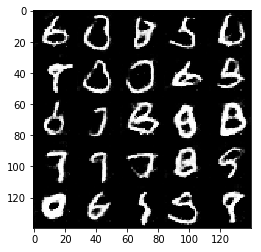

3301Epcho 2/2... Discriminator Loss: 1.3412... Generator Loss: 0.4765
3302Epcho 2/2... Discriminator Loss: 1.2125... Generator Loss: 1.3388
3303Epcho 2/2... Discriminator Loss: 1.3081... Generator Loss: 0.4894
3304Epcho 2/2... Discriminator Loss: 1.1935... Generator Loss: 1.0733
3305Epcho 2/2... Discriminator Loss: 1.2004... Generator Loss: 0.7054
3306Epcho 2/2... Discriminator Loss: 1.1122... Generator Loss: 0.9174
3307Epcho 2/2... Discriminator Loss: 1.1558... Generator Loss: 0.6557
3308Epcho 2/2... Discriminator Loss: 1.1777... Generator Loss: 1.1172
3309Epcho 2/2... Discriminator Loss: 1.2056... Generator Loss: 0.5682
3310Epcho 2/2... Discriminator Loss: 1.1898... Generator Loss: 1.1262
3311Epcho 2/2... Discriminator Loss: 1.3216... Generator Loss: 0.4799
3312Epcho 2/2... Discriminator Loss: 1.1735... Generator Loss: 1.1305
3313Epcho 2/2... Discriminator Loss: 1.3258... Generator Loss: 0.4974
3314Epcho 2/2... Discriminator Loss: 1.1474... Generator Loss: 1.0021
3315Epcho 2/2... Dis

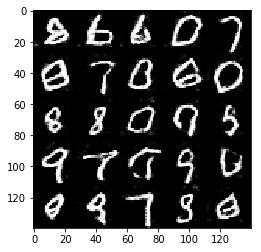

3401Epcho 2/2... Discriminator Loss: 1.2202... Generator Loss: 1.2624
3402Epcho 2/2... Discriminator Loss: 1.2484... Generator Loss: 0.5233
3403Epcho 2/2... Discriminator Loss: 1.3189... Generator Loss: 1.1398
3404Epcho 2/2... Discriminator Loss: 1.2650... Generator Loss: 0.5897
3405Epcho 2/2... Discriminator Loss: 1.2876... Generator Loss: 0.9790
3406Epcho 2/2... Discriminator Loss: 1.3059... Generator Loss: 0.5658
3407Epcho 2/2... Discriminator Loss: 1.2566... Generator Loss: 0.9328
3408Epcho 2/2... Discriminator Loss: 1.3222... Generator Loss: 0.5534
3409Epcho 2/2... Discriminator Loss: 1.1842... Generator Loss: 1.0656
3410Epcho 2/2... Discriminator Loss: 1.2124... Generator Loss: 0.6067
3411Epcho 2/2... Discriminator Loss: 1.2473... Generator Loss: 0.9361
3412Epcho 2/2... Discriminator Loss: 1.2326... Generator Loss: 0.5990
3413Epcho 2/2... Discriminator Loss: 1.1878... Generator Loss: 0.9906
3414Epcho 2/2... Discriminator Loss: 1.3632... Generator Loss: 0.4693
3415Epcho 2/2... Dis

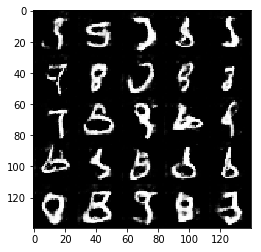

3501Epcho 2/2... Discriminator Loss: 1.2653... Generator Loss: 0.5054
3502Epcho 2/2... Discriminator Loss: 1.2208... Generator Loss: 1.1473
3503Epcho 2/2... Discriminator Loss: 1.2987... Generator Loss: 0.4816
3504Epcho 2/2... Discriminator Loss: 1.3001... Generator Loss: 1.1207
3505Epcho 2/2... Discriminator Loss: 1.1830... Generator Loss: 0.6089
3506Epcho 2/2... Discriminator Loss: 1.0699... Generator Loss: 1.0391
3507Epcho 2/2... Discriminator Loss: 1.4266... Generator Loss: 0.4070
3508Epcho 2/2... Discriminator Loss: 1.4639... Generator Loss: 1.4010
3509Epcho 2/2... Discriminator Loss: 1.5950... Generator Loss: 0.3469
3510Epcho 2/2... Discriminator Loss: 1.4507... Generator Loss: 1.5621
3511Epcho 2/2... Discriminator Loss: 1.6622... Generator Loss: 0.3177
3512Epcho 2/2... Discriminator Loss: 1.3523... Generator Loss: 1.3905
3513Epcho 2/2... Discriminator Loss: 1.4213... Generator Loss: 0.5529
3514Epcho 2/2... Discriminator Loss: 1.2108... Generator Loss: 1.0171
3515Epcho 2/2... Dis

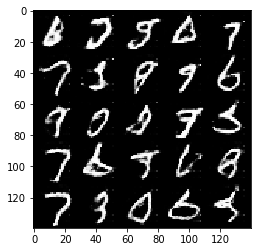

3601Epcho 2/2... Discriminator Loss: 1.2530... Generator Loss: 0.7420
3602Epcho 2/2... Discriminator Loss: 1.2226... Generator Loss: 0.9563
3603Epcho 2/2... Discriminator Loss: 1.1969... Generator Loss: 0.6514
3604Epcho 2/2... Discriminator Loss: 1.1912... Generator Loss: 0.9916
3605Epcho 2/2... Discriminator Loss: 1.3421... Generator Loss: 0.5252
3606Epcho 2/2... Discriminator Loss: 1.3120... Generator Loss: 0.9310
3607Epcho 2/2... Discriminator Loss: 1.1825... Generator Loss: 0.6916
3608Epcho 2/2... Discriminator Loss: 1.2286... Generator Loss: 0.9302
3609Epcho 2/2... Discriminator Loss: 1.2171... Generator Loss: 0.6657
3610Epcho 2/2... Discriminator Loss: 1.1052... Generator Loss: 0.9733
3611Epcho 2/2... Discriminator Loss: 1.2098... Generator Loss: 0.6361
3612Epcho 2/2... Discriminator Loss: 1.2753... Generator Loss: 0.6975
3613Epcho 2/2... Discriminator Loss: 1.2562... Generator Loss: 0.7949
3614Epcho 2/2... Discriminator Loss: 1.2047... Generator Loss: 0.9082
3615Epcho 2/2... Dis

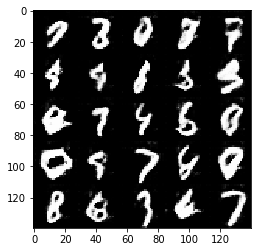

3701Epcho 2/2... Discriminator Loss: 1.3415... Generator Loss: 0.8087
3702Epcho 2/2... Discriminator Loss: 1.1172... Generator Loss: 0.8902
3703Epcho 2/2... Discriminator Loss: 1.1003... Generator Loss: 0.7912
3704Epcho 2/2... Discriminator Loss: 1.2300... Generator Loss: 0.7550
3705Epcho 2/2... Discriminator Loss: 1.2285... Generator Loss: 0.8381
3706Epcho 2/2... Discriminator Loss: 1.2826... Generator Loss: 0.6694
3707Epcho 2/2... Discriminator Loss: 1.1900... Generator Loss: 1.1633
3708Epcho 2/2... Discriminator Loss: 1.4573... Generator Loss: 0.3792
3709Epcho 2/2... Discriminator Loss: 1.4237... Generator Loss: 1.3574
3710Epcho 2/2... Discriminator Loss: 1.4841... Generator Loss: 0.3705
3711Epcho 2/2... Discriminator Loss: 1.3816... Generator Loss: 1.3806
3712Epcho 2/2... Discriminator Loss: 1.5395... Generator Loss: 0.3326
3713Epcho 2/2... Discriminator Loss: 1.3722... Generator Loss: 1.3602
3714Epcho 2/2... Discriminator Loss: 1.3948... Generator Loss: 0.4351
3715Epcho 2/2... Dis

In [106]:
batch_size = 32
z_dim = 100
learning_rate = 0.01
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

1Epcho 1/1... Discriminator Loss: 3.6301... Generator Loss: 4.3751
2Epcho 1/1... Discriminator Loss: 7.9423... Generator Loss: 0.0016
3Epcho 1/1... Discriminator Loss: 3.8248... Generator Loss: 1.7401
4Epcho 1/1... Discriminator Loss: 3.7614... Generator Loss: 0.8863
5Epcho 1/1... Discriminator Loss: 3.0746... Generator Loss: 1.6076
6Epcho 1/1... Discriminator Loss: 2.6755... Generator Loss: 0.6677
7Epcho 1/1... Discriminator Loss: 2.8602... Generator Loss: 2.2659
8Epcho 1/1... Discriminator Loss: 2.7284... Generator Loss: 0.8335
9Epcho 1/1... Discriminator Loss: 2.3270... Generator Loss: 1.1862
10Epcho 1/1... Discriminator Loss: 2.2733... Generator Loss: 1.1568
11Epcho 1/1... Discriminator Loss: 2.9280... Generator Loss: 0.4237
12Epcho 1/1... Discriminator Loss: 2.5199... Generator Loss: 2.4145
13Epcho 1/1... Discriminator Loss: 2.9979... Generator Loss: 0.1087
14Epcho 1/1... Discriminator Loss: 3.2781... Generator Loss: 3.7147
15Epcho 1/1... Discriminator Loss: 2.3693... Generator Lo

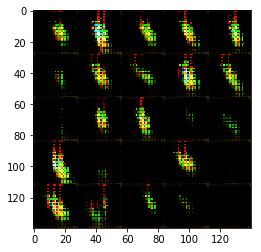

101Epcho 1/1... Discriminator Loss: 0.9020... Generator Loss: 0.9786
102Epcho 1/1... Discriminator Loss: 0.5998... Generator Loss: 1.6666
103Epcho 1/1... Discriminator Loss: 0.7072... Generator Loss: 1.1001
104Epcho 1/1... Discriminator Loss: 1.3374... Generator Loss: 1.8600
105Epcho 1/1... Discriminator Loss: 1.6636... Generator Loss: 0.7529
106Epcho 1/1... Discriminator Loss: 2.4465... Generator Loss: 1.4733
107Epcho 1/1... Discriminator Loss: 2.5290... Generator Loss: 0.5296
108Epcho 1/1... Discriminator Loss: 2.0117... Generator Loss: 1.3808
109Epcho 1/1... Discriminator Loss: 1.1499... Generator Loss: 1.3191
110Epcho 1/1... Discriminator Loss: 1.5336... Generator Loss: 0.4001
111Epcho 1/1... Discriminator Loss: 1.8019... Generator Loss: 1.7775
112Epcho 1/1... Discriminator Loss: 1.7692... Generator Loss: 0.7599
113Epcho 1/1... Discriminator Loss: 1.1446... Generator Loss: 1.2029
114Epcho 1/1... Discriminator Loss: 1.1416... Generator Loss: 1.2371
115Epcho 1/1... Discriminator Loss

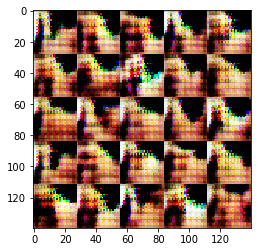

201Epcho 1/1... Discriminator Loss: 1.1715... Generator Loss: 0.9223
202Epcho 1/1... Discriminator Loss: 1.2565... Generator Loss: 0.6792
203Epcho 1/1... Discriminator Loss: 1.2317... Generator Loss: 1.0629
204Epcho 1/1... Discriminator Loss: 1.4168... Generator Loss: 0.4668
205Epcho 1/1... Discriminator Loss: 1.1987... Generator Loss: 0.9801
206Epcho 1/1... Discriminator Loss: 1.3858... Generator Loss: 0.6266
207Epcho 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.6695
208Epcho 1/1... Discriminator Loss: 1.3267... Generator Loss: 0.8505
209Epcho 1/1... Discriminator Loss: 1.5178... Generator Loss: 0.5006
210Epcho 1/1... Discriminator Loss: 1.1405... Generator Loss: 1.1258
211Epcho 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.5523
212Epcho 1/1... Discriminator Loss: 1.2896... Generator Loss: 0.9298
213Epcho 1/1... Discriminator Loss: 1.2714... Generator Loss: 0.7111
214Epcho 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.9721
215Epcho 1/1... Discriminator Loss

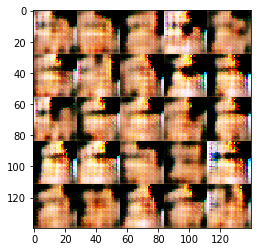

301Epcho 1/1... Discriminator Loss: 1.3438... Generator Loss: 0.6669
302Epcho 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.6132
303Epcho 1/1... Discriminator Loss: 1.2728... Generator Loss: 1.2741
304Epcho 1/1... Discriminator Loss: 1.6778... Generator Loss: 0.5604
305Epcho 1/1... Discriminator Loss: 1.3632... Generator Loss: 1.0160
306Epcho 1/1... Discriminator Loss: 1.2269... Generator Loss: 0.6830
307Epcho 1/1... Discriminator Loss: 1.5194... Generator Loss: 0.7575
308Epcho 1/1... Discriminator Loss: 1.4730... Generator Loss: 1.0842
309Epcho 1/1... Discriminator Loss: 1.7276... Generator Loss: 0.4414
310Epcho 1/1... Discriminator Loss: 1.3697... Generator Loss: 0.9786
311Epcho 1/1... Discriminator Loss: 1.3474... Generator Loss: 0.6017
312Epcho 1/1... Discriminator Loss: 1.2948... Generator Loss: 0.8960
313Epcho 1/1... Discriminator Loss: 1.2177... Generator Loss: 0.7171
314Epcho 1/1... Discriminator Loss: 1.4319... Generator Loss: 0.5933
315Epcho 1/1... Discriminator Loss

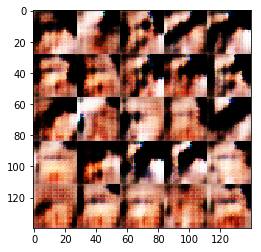

401Epcho 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.7160
402Epcho 1/1... Discriminator Loss: 1.4306... Generator Loss: 0.9523
403Epcho 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.4668
404Epcho 1/1... Discriminator Loss: 1.3225... Generator Loss: 1.0574
405Epcho 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.5070
406Epcho 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.9948
407Epcho 1/1... Discriminator Loss: 1.2873... Generator Loss: 0.5980
408Epcho 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.9391
409Epcho 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.6075
410Epcho 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.8417
411Epcho 1/1... Discriminator Loss: 1.2564... Generator Loss: 0.6860
412Epcho 1/1... Discriminator Loss: 1.2656... Generator Loss: 0.9078
413Epcho 1/1... Discriminator Loss: 1.3398... Generator Loss: 0.6165
414Epcho 1/1... Discriminator Loss: 1.3376... Generator Loss: 0.8797
415Epcho 1/1... Discriminator Loss

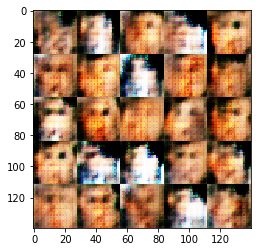

501Epcho 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.7625
502Epcho 1/1... Discriminator Loss: 1.3233... Generator Loss: 0.6589
503Epcho 1/1... Discriminator Loss: 1.3873... Generator Loss: 0.5875
504Epcho 1/1... Discriminator Loss: 1.5465... Generator Loss: 0.8839
505Epcho 1/1... Discriminator Loss: 1.6519... Generator Loss: 0.3723
506Epcho 1/1... Discriminator Loss: 1.5235... Generator Loss: 1.1754
507Epcho 1/1... Discriminator Loss: 1.5955... Generator Loss: 0.5316
508Epcho 1/1... Discriminator Loss: 1.6485... Generator Loss: 0.6945
509Epcho 1/1... Discriminator Loss: 1.4291... Generator Loss: 0.5920
510Epcho 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.7881
511Epcho 1/1... Discriminator Loss: 1.3699... Generator Loss: 0.5715
512Epcho 1/1... Discriminator Loss: 1.4574... Generator Loss: 0.8438
513Epcho 1/1... Discriminator Loss: 1.3925... Generator Loss: 0.6228
514Epcho 1/1... Discriminator Loss: 1.3427... Generator Loss: 0.8143
515Epcho 1/1... Discriminator Loss

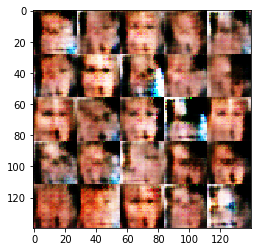

601Epcho 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.4485
602Epcho 1/1... Discriminator Loss: 1.2851... Generator Loss: 0.9574
603Epcho 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.6270
604Epcho 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.7937
605Epcho 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.6804
606Epcho 1/1... Discriminator Loss: 1.5548... Generator Loss: 0.5923
607Epcho 1/1... Discriminator Loss: 1.5404... Generator Loss: 0.9781
608Epcho 1/1... Discriminator Loss: 1.4679... Generator Loss: 0.4058
609Epcho 1/1... Discriminator Loss: 1.3566... Generator Loss: 0.7991
610Epcho 1/1... Discriminator Loss: 1.3844... Generator Loss: 0.6732
611Epcho 1/1... Discriminator Loss: 1.2657... Generator Loss: 0.9105
612Epcho 1/1... Discriminator Loss: 1.5677... Generator Loss: 0.4881
613Epcho 1/1... Discriminator Loss: 1.3508... Generator Loss: 0.9193
614Epcho 1/1... Discriminator Loss: 1.3141... Generator Loss: 0.5650
615Epcho 1/1... Discriminator Loss

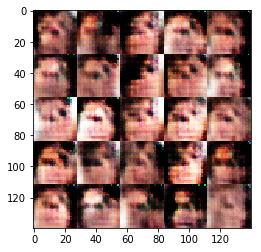

701Epcho 1/1... Discriminator Loss: 1.2701... Generator Loss: 0.7098
702Epcho 1/1... Discriminator Loss: 1.1941... Generator Loss: 0.7475
703Epcho 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.6477
704Epcho 1/1... Discriminator Loss: 1.2786... Generator Loss: 0.8797
705Epcho 1/1... Discriminator Loss: 1.5172... Generator Loss: 0.4297
706Epcho 1/1... Discriminator Loss: 1.4106... Generator Loss: 1.2464
707Epcho 1/1... Discriminator Loss: 1.3792... Generator Loss: 0.5121
708Epcho 1/1... Discriminator Loss: 1.4329... Generator Loss: 1.0265
709Epcho 1/1... Discriminator Loss: 1.3182... Generator Loss: 0.5804
710Epcho 1/1... Discriminator Loss: 1.4171... Generator Loss: 0.5966
711Epcho 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.9003
712Epcho 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.5250
713Epcho 1/1... Discriminator Loss: 1.3930... Generator Loss: 1.1007
714Epcho 1/1... Discriminator Loss: 1.3763... Generator Loss: 0.5101
715Epcho 1/1... Discriminator Loss

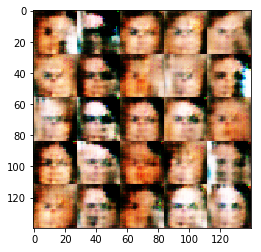

801Epcho 1/1... Discriminator Loss: 1.2498... Generator Loss: 0.7449
802Epcho 1/1... Discriminator Loss: 1.3170... Generator Loss: 0.5602
803Epcho 1/1... Discriminator Loss: 1.5535... Generator Loss: 0.8742
804Epcho 1/1... Discriminator Loss: 1.4584... Generator Loss: 0.4668
805Epcho 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.8994
806Epcho 1/1... Discriminator Loss: 1.3170... Generator Loss: 0.6422
807Epcho 1/1... Discriminator Loss: 1.2947... Generator Loss: 0.6204
808Epcho 1/1... Discriminator Loss: 1.2804... Generator Loss: 0.8490
809Epcho 1/1... Discriminator Loss: 1.3518... Generator Loss: 0.5698
810Epcho 1/1... Discriminator Loss: 1.3560... Generator Loss: 0.8256
811Epcho 1/1... Discriminator Loss: 1.2693... Generator Loss: 0.6092
812Epcho 1/1... Discriminator Loss: 1.3538... Generator Loss: 1.0644
813Epcho 1/1... Discriminator Loss: 1.4493... Generator Loss: 0.4809
814Epcho 1/1... Discriminator Loss: 1.5829... Generator Loss: 0.9020
815Epcho 1/1... Discriminator Loss

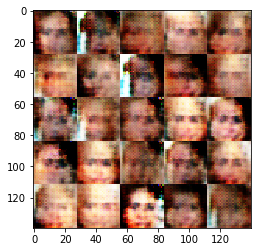

901Epcho 1/1... Discriminator Loss: 1.3163... Generator Loss: 0.6108
902Epcho 1/1... Discriminator Loss: 1.3186... Generator Loss: 0.7956
903Epcho 1/1... Discriminator Loss: 1.4185... Generator Loss: 0.5779
904Epcho 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.8177
905Epcho 1/1... Discriminator Loss: 1.2980... Generator Loss: 0.6124
906Epcho 1/1... Discriminator Loss: 1.4067... Generator Loss: 0.6899
907Epcho 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.7660
908Epcho 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.7316
909Epcho 1/1... Discriminator Loss: 1.3847... Generator Loss: 0.6193
910Epcho 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.7838
911Epcho 1/1... Discriminator Loss: 1.3624... Generator Loss: 0.5983
912Epcho 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.9277
913Epcho 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.6143
914Epcho 1/1... Discriminator Loss: 1.3467... Generator Loss: 0.7129
915Epcho 1/1... Discriminator Loss

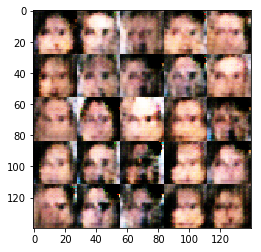

1001Epcho 1/1... Discriminator Loss: 1.2917... Generator Loss: 0.5742
1002Epcho 1/1... Discriminator Loss: 1.3995... Generator Loss: 0.7429
1003Epcho 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.6554
1004Epcho 1/1... Discriminator Loss: 1.3186... Generator Loss: 0.7376
1005Epcho 1/1... Discriminator Loss: 1.2773... Generator Loss: 0.7127
1006Epcho 1/1... Discriminator Loss: 1.3009... Generator Loss: 0.6496
1007Epcho 1/1... Discriminator Loss: 1.2843... Generator Loss: 0.8171
1008Epcho 1/1... Discriminator Loss: 1.2232... Generator Loss: 0.6226
1009Epcho 1/1... Discriminator Loss: 1.3283... Generator Loss: 0.7629
1010Epcho 1/1... Discriminator Loss: 1.3240... Generator Loss: 0.6268
1011Epcho 1/1... Discriminator Loss: 1.4530... Generator Loss: 0.6230
1012Epcho 1/1... Discriminator Loss: 1.2979... Generator Loss: 0.7433
1013Epcho 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.5632
1014Epcho 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.8475
1015Epcho 1/1... Dis

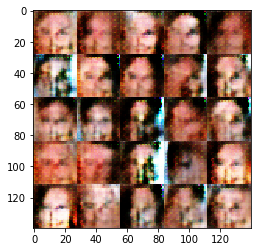

1101Epcho 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.9236
1102Epcho 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.5884
1103Epcho 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.6685
1104Epcho 1/1... Discriminator Loss: 1.3493... Generator Loss: 0.7297
1105Epcho 1/1... Discriminator Loss: 1.2740... Generator Loss: 0.7017
1106Epcho 1/1... Discriminator Loss: 1.2892... Generator Loss: 0.7323
1107Epcho 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.6030
1108Epcho 1/1... Discriminator Loss: 1.3000... Generator Loss: 0.8017
1109Epcho 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.5262
1110Epcho 1/1... Discriminator Loss: 1.3617... Generator Loss: 0.8671
1111Epcho 1/1... Discriminator Loss: 1.4098... Generator Loss: 0.5478
1112Epcho 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.7069
1113Epcho 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.6650
1114Epcho 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.6416
1115Epcho 1/1... Dis

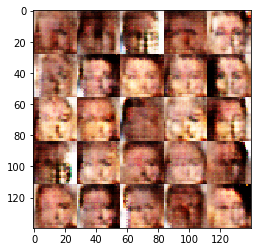

1201Epcho 1/1... Discriminator Loss: 1.4341... Generator Loss: 1.0171
1202Epcho 1/1... Discriminator Loss: 1.3584... Generator Loss: 0.4823
1203Epcho 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.9663
1204Epcho 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.5661
1205Epcho 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.8553
1206Epcho 1/1... Discriminator Loss: 1.3720... Generator Loss: 0.5288
1207Epcho 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.9869
1208Epcho 1/1... Discriminator Loss: 1.4920... Generator Loss: 0.4509
1209Epcho 1/1... Discriminator Loss: 1.4389... Generator Loss: 1.0769
1210Epcho 1/1... Discriminator Loss: 1.4772... Generator Loss: 0.4101
1211Epcho 1/1... Discriminator Loss: 1.4045... Generator Loss: 1.0541
1212Epcho 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.5062
1213Epcho 1/1... Discriminator Loss: 1.2288... Generator Loss: 0.9567
1214Epcho 1/1... Discriminator Loss: 1.2564... Generator Loss: 0.6661
1215Epcho 1/1... Dis

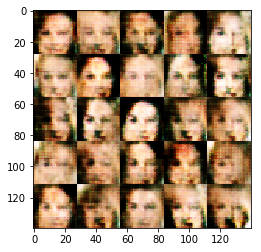

1301Epcho 1/1... Discriminator Loss: 1.4165... Generator Loss: 0.9581
1302Epcho 1/1... Discriminator Loss: 1.4661... Generator Loss: 0.4872
1303Epcho 1/1... Discriminator Loss: 1.4245... Generator Loss: 0.8973
1304Epcho 1/1... Discriminator Loss: 1.2886... Generator Loss: 0.5948
1305Epcho 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.8028
1306Epcho 1/1... Discriminator Loss: 1.3972... Generator Loss: 0.6049
1307Epcho 1/1... Discriminator Loss: 1.3381... Generator Loss: 0.6371
1308Epcho 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.7743
1309Epcho 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.6197
1310Epcho 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.7124
1311Epcho 1/1... Discriminator Loss: 1.3893... Generator Loss: 0.6533
1312Epcho 1/1... Discriminator Loss: 1.3298... Generator Loss: 0.7702
1313Epcho 1/1... Discriminator Loss: 1.3250... Generator Loss: 0.6740
1314Epcho 1/1... Discriminator Loss: 1.4002... Generator Loss: 0.6751
1315Epcho 1/1... Dis

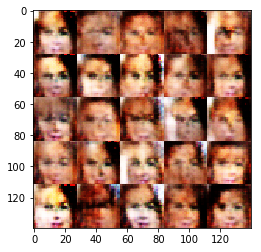

1401Epcho 1/1... Discriminator Loss: 1.3319... Generator Loss: 0.8449
1402Epcho 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.5474
1403Epcho 1/1... Discriminator Loss: 1.3455... Generator Loss: 0.9736
1404Epcho 1/1... Discriminator Loss: 1.3432... Generator Loss: 0.5255
1405Epcho 1/1... Discriminator Loss: 1.2695... Generator Loss: 0.9337
1406Epcho 1/1... Discriminator Loss: 1.4663... Generator Loss: 0.4967
1407Epcho 1/1... Discriminator Loss: 1.3240... Generator Loss: 0.8555
1408Epcho 1/1... Discriminator Loss: 1.3149... Generator Loss: 0.6298
1409Epcho 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.6634
1410Epcho 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.6774
1411Epcho 1/1... Discriminator Loss: 1.3992... Generator Loss: 0.6035
1412Epcho 1/1... Discriminator Loss: 1.3384... Generator Loss: 0.7701
1413Epcho 1/1... Discriminator Loss: 1.3579... Generator Loss: 0.6477
1414Epcho 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.6934
1415Epcho 1/1... Dis

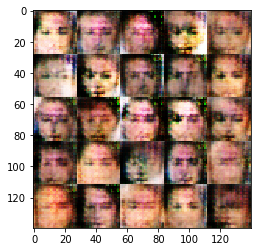

1501Epcho 1/1... Discriminator Loss: 1.3773... Generator Loss: 0.7909
1502Epcho 1/1... Discriminator Loss: 1.3946... Generator Loss: 0.5262
1503Epcho 1/1... Discriminator Loss: 1.3093... Generator Loss: 0.9097
1504Epcho 1/1... Discriminator Loss: 1.3898... Generator Loss: 0.5134
1505Epcho 1/1... Discriminator Loss: 1.4399... Generator Loss: 0.7293
1506Epcho 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6195
1507Epcho 1/1... Discriminator Loss: 1.4425... Generator Loss: 0.6066
1508Epcho 1/1... Discriminator Loss: 1.3405... Generator Loss: 0.6951
1509Epcho 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.6461
1510Epcho 1/1... Discriminator Loss: 1.2897... Generator Loss: 0.8289
1511Epcho 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.5408
1512Epcho 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.7288
1513Epcho 1/1... Discriminator Loss: 1.3202... Generator Loss: 0.7220
1514Epcho 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.6212
1515Epcho 1/1... Dis

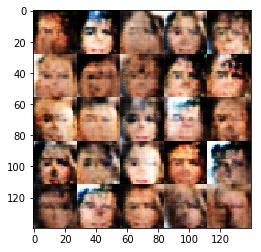

1601Epcho 1/1... Discriminator Loss: 1.3812... Generator Loss: 0.7858
1602Epcho 1/1... Discriminator Loss: 1.3915... Generator Loss: 0.6340
1603Epcho 1/1... Discriminator Loss: 1.3243... Generator Loss: 0.6828
1604Epcho 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.6981
1605Epcho 1/1... Discriminator Loss: 1.3125... Generator Loss: 0.5690
1606Epcho 1/1... Discriminator Loss: 1.3036... Generator Loss: 1.0648
1607Epcho 1/1... Discriminator Loss: 1.5629... Generator Loss: 0.3708
1608Epcho 1/1... Discriminator Loss: 1.4965... Generator Loss: 1.1992
1609Epcho 1/1... Discriminator Loss: 1.4356... Generator Loss: 0.4351
1610Epcho 1/1... Discriminator Loss: 1.4110... Generator Loss: 1.0487
1611Epcho 1/1... Discriminator Loss: 1.3791... Generator Loss: 0.5053
1612Epcho 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.9057
1613Epcho 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.5904
1614Epcho 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.9391
1615Epcho 1/1... Dis

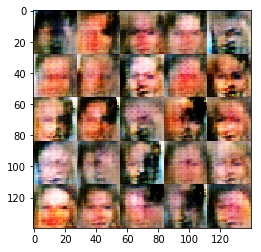

1701Epcho 1/1... Discriminator Loss: 1.2993... Generator Loss: 1.2646
1702Epcho 1/1... Discriminator Loss: 1.6674... Generator Loss: 0.3127
1703Epcho 1/1... Discriminator Loss: 1.5168... Generator Loss: 1.0589
1704Epcho 1/1... Discriminator Loss: 1.5878... Generator Loss: 0.6523
1705Epcho 1/1... Discriminator Loss: 1.3084... Generator Loss: 0.7798
1706Epcho 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.7422
1707Epcho 1/1... Discriminator Loss: 1.2263... Generator Loss: 0.6904
1708Epcho 1/1... Discriminator Loss: 1.0892... Generator Loss: 0.8440
1709Epcho 1/1... Discriminator Loss: 1.3464... Generator Loss: 0.6487
1710Epcho 1/1... Discriminator Loss: 1.2322... Generator Loss: 0.7541
1711Epcho 1/1... Discriminator Loss: 1.1600... Generator Loss: 0.8891
1712Epcho 1/1... Discriminator Loss: 1.4069... Generator Loss: 0.5299
1713Epcho 1/1... Discriminator Loss: 1.2217... Generator Loss: 1.3836
1714Epcho 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.4534
1715Epcho 1/1... Dis

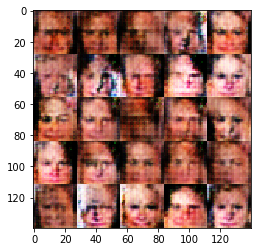

1801Epcho 1/1... Discriminator Loss: 1.3732... Generator Loss: 0.7813
1802Epcho 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.5769
1803Epcho 1/1... Discriminator Loss: 1.2427... Generator Loss: 0.7792
1804Epcho 1/1... Discriminator Loss: 1.3070... Generator Loss: 0.7652
1805Epcho 1/1... Discriminator Loss: 1.4627... Generator Loss: 0.4100
1806Epcho 1/1... Discriminator Loss: 1.4531... Generator Loss: 1.1878
1807Epcho 1/1... Discriminator Loss: 1.6965... Generator Loss: 0.2951
1808Epcho 1/1... Discriminator Loss: 1.4200... Generator Loss: 1.2481
1809Epcho 1/1... Discriminator Loss: 1.4882... Generator Loss: 0.4338
1810Epcho 1/1... Discriminator Loss: 1.3359... Generator Loss: 1.0027
1811Epcho 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.5394
1812Epcho 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.7140
1813Epcho 1/1... Discriminator Loss: 1.2942... Generator Loss: 0.7355
1814Epcho 1/1... Discriminator Loss: 1.2077... Generator Loss: 0.8004
1815Epcho 1/1... Dis

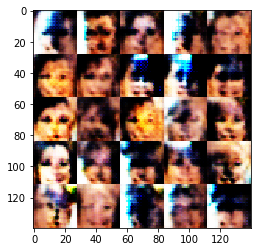

1901Epcho 1/1... Discriminator Loss: 1.1969... Generator Loss: 0.7579
1902Epcho 1/1... Discriminator Loss: 1.2049... Generator Loss: 0.8822
1903Epcho 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.6255
1904Epcho 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.7343
1905Epcho 1/1... Discriminator Loss: 1.2655... Generator Loss: 0.7914
1906Epcho 1/1... Discriminator Loss: 1.2022... Generator Loss: 0.8725
1907Epcho 1/1... Discriminator Loss: 1.2489... Generator Loss: 0.5501
1908Epcho 1/1... Discriminator Loss: 1.1904... Generator Loss: 1.1618
1909Epcho 1/1... Discriminator Loss: 1.1441... Generator Loss: 0.6775
1910Epcho 1/1... Discriminator Loss: 1.3038... Generator Loss: 0.8121
1911Epcho 1/1... Discriminator Loss: 1.3354... Generator Loss: 1.2039
1912Epcho 1/1... Discriminator Loss: 1.4181... Generator Loss: 0.6750
1913Epcho 1/1... Discriminator Loss: 1.2231... Generator Loss: 0.6965
1914Epcho 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.9533
1915Epcho 1/1... Dis

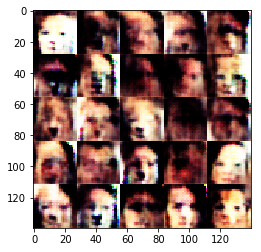

2001Epcho 1/1... Discriminator Loss: 1.2949... Generator Loss: 0.6301
2002Epcho 1/1... Discriminator Loss: 1.2262... Generator Loss: 0.8187
2003Epcho 1/1... Discriminator Loss: 0.9921... Generator Loss: 1.3153
2004Epcho 1/1... Discriminator Loss: 1.1614... Generator Loss: 0.5847
2005Epcho 1/1... Discriminator Loss: 1.0229... Generator Loss: 2.2195
2006Epcho 1/1... Discriminator Loss: 1.3897... Generator Loss: 0.3938
2007Epcho 1/1... Discriminator Loss: 1.5524... Generator Loss: 2.0870
2008Epcho 1/1... Discriminator Loss: 1.8867... Generator Loss: 0.2611
2009Epcho 1/1... Discriminator Loss: 1.3563... Generator Loss: 1.8316
2010Epcho 1/1... Discriminator Loss: 0.9507... Generator Loss: 0.9531
2011Epcho 1/1... Discriminator Loss: 1.0333... Generator Loss: 0.8956
2012Epcho 1/1... Discriminator Loss: 0.9950... Generator Loss: 0.9953
2013Epcho 1/1... Discriminator Loss: 0.9946... Generator Loss: 1.1288
2014Epcho 1/1... Discriminator Loss: 1.0679... Generator Loss: 0.7237
2015Epcho 1/1... Dis

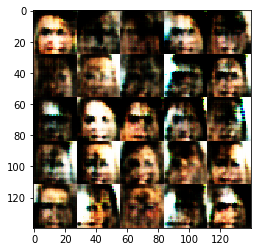

2101Epcho 1/1... Discriminator Loss: 0.8633... Generator Loss: 1.5051
2102Epcho 1/1... Discriminator Loss: 1.0051... Generator Loss: 0.9868
2103Epcho 1/1... Discriminator Loss: 0.9770... Generator Loss: 1.4233
2104Epcho 1/1... Discriminator Loss: 0.9996... Generator Loss: 1.0284
2105Epcho 1/1... Discriminator Loss: 2.2747... Generator Loss: 2.2178
2106Epcho 1/1... Discriminator Loss: 1.8415... Generator Loss: 1.0999
2107Epcho 1/1... Discriminator Loss: 1.0995... Generator Loss: 1.1429
2108Epcho 1/1... Discriminator Loss: 1.0781... Generator Loss: 0.8099
2109Epcho 1/1... Discriminator Loss: 1.0753... Generator Loss: 1.1449
2110Epcho 1/1... Discriminator Loss: 1.2616... Generator Loss: 0.5207
2111Epcho 1/1... Discriminator Loss: 1.6155... Generator Loss: 2.1077
2112Epcho 1/1... Discriminator Loss: 1.8335... Generator Loss: 0.2158
2113Epcho 1/1... Discriminator Loss: 1.9552... Generator Loss: 1.6968
2114Epcho 1/1... Discriminator Loss: 1.6024... Generator Loss: 0.3332
2115Epcho 1/1... Dis

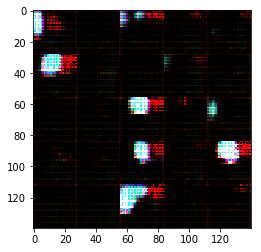

2201Epcho 1/1... Discriminator Loss: 0.0337... Generator Loss: 4.1692
2202Epcho 1/1... Discriminator Loss: 0.2117... Generator Loss: 3.7770
2203Epcho 1/1... Discriminator Loss: 0.0753... Generator Loss: 5.3892
2204Epcho 1/1... Discriminator Loss: 0.0466... Generator Loss: 5.5083
2205Epcho 1/1... Discriminator Loss: 0.0554... Generator Loss: 4.9619
2206Epcho 1/1... Discriminator Loss: 0.0454... Generator Loss: 4.7356
2207Epcho 1/1... Discriminator Loss: 0.0463... Generator Loss: 4.1791
2208Epcho 1/1... Discriminator Loss: 0.0345... Generator Loss: 4.1143
2209Epcho 1/1... Discriminator Loss: 0.0345... Generator Loss: 4.1652
2210Epcho 1/1... Discriminator Loss: 0.0427... Generator Loss: 3.9534
2211Epcho 1/1... Discriminator Loss: 0.0392... Generator Loss: 4.0311
2212Epcho 1/1... Discriminator Loss: 0.0502... Generator Loss: 4.0067
2213Epcho 1/1... Discriminator Loss: 0.0577... Generator Loss: 3.5343
2214Epcho 1/1... Discriminator Loss: 0.0864... Generator Loss: 3.1845
2215Epcho 1/1... Dis

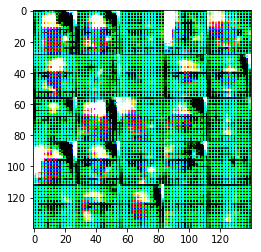

2301Epcho 1/1... Discriminator Loss: 0.2452... Generator Loss: 2.0390
2302Epcho 1/1... Discriminator Loss: 0.2801... Generator Loss: 2.5413
2303Epcho 1/1... Discriminator Loss: 0.2360... Generator Loss: 2.3443
2304Epcho 1/1... Discriminator Loss: 0.1251... Generator Loss: 3.7779
2305Epcho 1/1... Discriminator Loss: 0.1343... Generator Loss: 3.2075
2306Epcho 1/1... Discriminator Loss: 0.1079... Generator Loss: 3.1279
2307Epcho 1/1... Discriminator Loss: 0.1844... Generator Loss: 2.4942
2308Epcho 1/1... Discriminator Loss: 0.1379... Generator Loss: 3.0628
2309Epcho 1/1... Discriminator Loss: 0.0951... Generator Loss: 3.4465
2310Epcho 1/1... Discriminator Loss: 0.0803... Generator Loss: 3.5352
2311Epcho 1/1... Discriminator Loss: 0.0772... Generator Loss: 3.5410
2312Epcho 1/1... Discriminator Loss: 0.0644... Generator Loss: 3.5757
2313Epcho 1/1... Discriminator Loss: 0.0582... Generator Loss: 3.6249
2314Epcho 1/1... Discriminator Loss: 0.0662... Generator Loss: 3.2734
2315Epcho 1/1... Dis

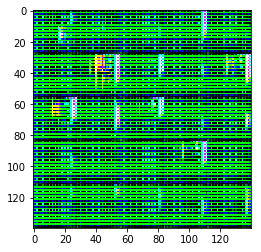

2401Epcho 1/1... Discriminator Loss: 0.0116... Generator Loss: 5.4439
2402Epcho 1/1... Discriminator Loss: 0.0102... Generator Loss: 5.8752
2403Epcho 1/1... Discriminator Loss: 0.0071... Generator Loss: 6.5109
2404Epcho 1/1... Discriminator Loss: 0.0114... Generator Loss: 5.7889
2405Epcho 1/1... Discriminator Loss: 0.0215... Generator Loss: 5.0574
2406Epcho 1/1... Discriminator Loss: 0.0267... Generator Loss: 5.3652
2407Epcho 1/1... Discriminator Loss: 0.0225... Generator Loss: 5.7230
2408Epcho 1/1... Discriminator Loss: 0.0253... Generator Loss: 6.1301
2409Epcho 1/1... Discriminator Loss: 0.0215... Generator Loss: 5.5315
2410Epcho 1/1... Discriminator Loss: 0.0227... Generator Loss: 5.2062
2411Epcho 1/1... Discriminator Loss: 0.0195... Generator Loss: 5.9056
2412Epcho 1/1... Discriminator Loss: 0.0276... Generator Loss: 4.4441
2413Epcho 1/1... Discriminator Loss: 0.0292... Generator Loss: 5.4780
2414Epcho 1/1... Discriminator Loss: 0.0141... Generator Loss: 6.4224
2415Epcho 1/1... Dis

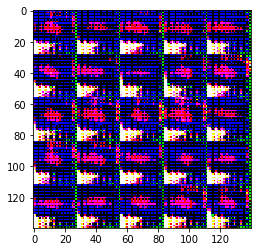

2501Epcho 1/1... Discriminator Loss: 1.1188... Generator Loss: 0.5820
2502Epcho 1/1... Discriminator Loss: 0.4641... Generator Loss: 4.1116
2503Epcho 1/1... Discriminator Loss: 0.1847... Generator Loss: 3.5788
2504Epcho 1/1... Discriminator Loss: 0.1808... Generator Loss: 2.6361
2505Epcho 1/1... Discriminator Loss: 0.1425... Generator Loss: 2.7591
2506Epcho 1/1... Discriminator Loss: 0.2161... Generator Loss: 2.5713
2507Epcho 1/1... Discriminator Loss: 0.2224... Generator Loss: 2.7978
2508Epcho 1/1... Discriminator Loss: 0.2177... Generator Loss: 2.8492
2509Epcho 1/1... Discriminator Loss: 0.2138... Generator Loss: 2.5890
2510Epcho 1/1... Discriminator Loss: 0.2137... Generator Loss: 3.2311
2511Epcho 1/1... Discriminator Loss: 0.1332... Generator Loss: 2.7863
2512Epcho 1/1... Discriminator Loss: 0.1032... Generator Loss: 3.0014
2513Epcho 1/1... Discriminator Loss: 0.1578... Generator Loss: 2.6159
2514Epcho 1/1... Discriminator Loss: 0.1397... Generator Loss: 3.1666
2515Epcho 1/1... Dis

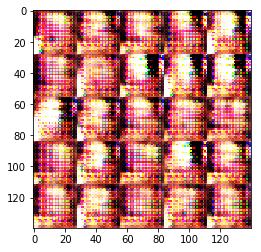

2601Epcho 1/1... Discriminator Loss: 0.2638... Generator Loss: 3.3756
2602Epcho 1/1... Discriminator Loss: 0.6558... Generator Loss: 1.5032
2603Epcho 1/1... Discriminator Loss: 0.2768... Generator Loss: 5.7299
2604Epcho 1/1... Discriminator Loss: 0.1934... Generator Loss: 3.8615
2605Epcho 1/1... Discriminator Loss: 0.6140... Generator Loss: 1.6981
2606Epcho 1/1... Discriminator Loss: 0.5271... Generator Loss: 3.4083
2607Epcho 1/1... Discriminator Loss: 0.2311... Generator Loss: 2.8632
2608Epcho 1/1... Discriminator Loss: 0.7209... Generator Loss: 1.0020
2609Epcho 1/1... Discriminator Loss: 0.6501... Generator Loss: 1.3971
2610Epcho 1/1... Discriminator Loss: 0.4148... Generator Loss: 2.7565
2611Epcho 1/1... Discriminator Loss: 1.0993... Generator Loss: 1.0944
2612Epcho 1/1... Discriminator Loss: 1.1485... Generator Loss: 3.4938
2613Epcho 1/1... Discriminator Loss: 0.2590... Generator Loss: 2.2343
2614Epcho 1/1... Discriminator Loss: 0.1911... Generator Loss: 2.1831
2615Epcho 1/1... Dis

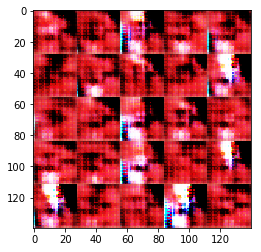

2701Epcho 1/1... Discriminator Loss: 0.2792... Generator Loss: 2.0592
2702Epcho 1/1... Discriminator Loss: 0.2060... Generator Loss: 3.6485
2703Epcho 1/1... Discriminator Loss: 0.0747... Generator Loss: 4.2867
2704Epcho 1/1... Discriminator Loss: 0.5405... Generator Loss: 1.1953
2705Epcho 1/1... Discriminator Loss: 0.5896... Generator Loss: 3.4149
2706Epcho 1/1... Discriminator Loss: 0.0950... Generator Loss: 4.9162
2707Epcho 1/1... Discriminator Loss: 0.4749... Generator Loss: 1.8809
2708Epcho 1/1... Discriminator Loss: 0.5559... Generator Loss: 8.6816
2709Epcho 1/1... Discriminator Loss: 0.0693... Generator Loss: 5.6872
2710Epcho 1/1... Discriminator Loss: 0.9724... Generator Loss: 2.4452
2711Epcho 1/1... Discriminator Loss: 0.3013... Generator Loss: 3.8745
2712Epcho 1/1... Discriminator Loss: 0.3273... Generator Loss: 4.0414
2713Epcho 1/1... Discriminator Loss: 0.3036... Generator Loss: 2.0575
2714Epcho 1/1... Discriminator Loss: 0.2113... Generator Loss: 3.5967
2715Epcho 1/1... Dis

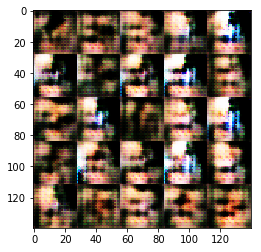

2801Epcho 1/1... Discriminator Loss: 0.1755... Generator Loss: 6.4580
2802Epcho 1/1... Discriminator Loss: 1.0106... Generator Loss: 0.9280
2803Epcho 1/1... Discriminator Loss: 1.0139... Generator Loss: 5.8738
2804Epcho 1/1... Discriminator Loss: 0.7854... Generator Loss: 1.3468
2805Epcho 1/1... Discriminator Loss: 0.3905... Generator Loss: 1.9686
2806Epcho 1/1... Discriminator Loss: 1.1487... Generator Loss: 0.9505
2807Epcho 1/1... Discriminator Loss: 0.4633... Generator Loss: 3.9547
2808Epcho 1/1... Discriminator Loss: 0.2846... Generator Loss: 2.5395
2809Epcho 1/1... Discriminator Loss: 0.2970... Generator Loss: 3.0911
2810Epcho 1/1... Discriminator Loss: 0.3896... Generator Loss: 2.7138
2811Epcho 1/1... Discriminator Loss: 0.2492... Generator Loss: 3.9911
2812Epcho 1/1... Discriminator Loss: 0.2860... Generator Loss: 2.6418
2813Epcho 1/1... Discriminator Loss: 0.6021... Generator Loss: 1.9945
2814Epcho 1/1... Discriminator Loss: 0.5161... Generator Loss: 3.4437
2815Epcho 1/1... Dis

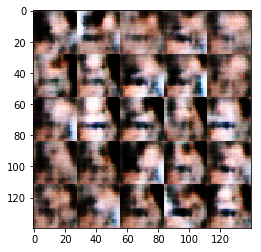

2901Epcho 1/1... Discriminator Loss: 1.1505... Generator Loss: 1.3710
2902Epcho 1/1... Discriminator Loss: 1.1719... Generator Loss: 0.7175
2903Epcho 1/1... Discriminator Loss: 1.0476... Generator Loss: 1.5443
2904Epcho 1/1... Discriminator Loss: 1.1286... Generator Loss: 0.6468
2905Epcho 1/1... Discriminator Loss: 1.1748... Generator Loss: 1.0585
2906Epcho 1/1... Discriminator Loss: 1.2577... Generator Loss: 0.7395
2907Epcho 1/1... Discriminator Loss: 1.1329... Generator Loss: 0.9242
2908Epcho 1/1... Discriminator Loss: 1.0272... Generator Loss: 1.4531
2909Epcho 1/1... Discriminator Loss: 1.1855... Generator Loss: 0.6657
2910Epcho 1/1... Discriminator Loss: 1.2947... Generator Loss: 1.8481
2911Epcho 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.4124
2912Epcho 1/1... Discriminator Loss: 1.1504... Generator Loss: 1.0580
2913Epcho 1/1... Discriminator Loss: 1.0109... Generator Loss: 0.9298
2914Epcho 1/1... Discriminator Loss: 1.3158... Generator Loss: 0.9515
2915Epcho 1/1... Dis

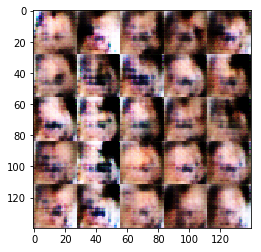

3001Epcho 1/1... Discriminator Loss: 0.9712... Generator Loss: 1.1828
3002Epcho 1/1... Discriminator Loss: 1.1985... Generator Loss: 0.6476
3003Epcho 1/1... Discriminator Loss: 1.2056... Generator Loss: 1.4215
3004Epcho 1/1... Discriminator Loss: 1.4423... Generator Loss: 0.3612
3005Epcho 1/1... Discriminator Loss: 1.5545... Generator Loss: 1.7178
3006Epcho 1/1... Discriminator Loss: 1.5589... Generator Loss: 0.3656
3007Epcho 1/1... Discriminator Loss: 1.2735... Generator Loss: 1.3573
3008Epcho 1/1... Discriminator Loss: 1.2060... Generator Loss: 0.6909
3009Epcho 1/1... Discriminator Loss: 1.1580... Generator Loss: 1.1233
3010Epcho 1/1... Discriminator Loss: 0.7714... Generator Loss: 1.2386
3011Epcho 1/1... Discriminator Loss: 1.0692... Generator Loss: 0.7650
3012Epcho 1/1... Discriminator Loss: 0.7505... Generator Loss: 1.9109
3013Epcho 1/1... Discriminator Loss: 0.9719... Generator Loss: 0.7354
3014Epcho 1/1... Discriminator Loss: 0.9943... Generator Loss: 1.8036
3015Epcho 1/1... Dis

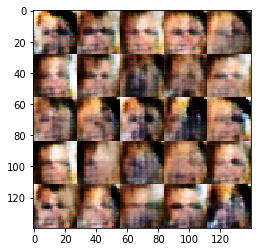

3101Epcho 1/1... Discriminator Loss: 1.0927... Generator Loss: 1.7819
3102Epcho 1/1... Discriminator Loss: 1.6299... Generator Loss: 0.3294
3103Epcho 1/1... Discriminator Loss: 1.2906... Generator Loss: 1.8777
3104Epcho 1/1... Discriminator Loss: 1.3397... Generator Loss: 0.4456
3105Epcho 1/1... Discriminator Loss: 1.1622... Generator Loss: 1.1623
3106Epcho 1/1... Discriminator Loss: 1.0967... Generator Loss: 0.8547
3107Epcho 1/1... Discriminator Loss: 1.4229... Generator Loss: 0.6296
3108Epcho 1/1... Discriminator Loss: 1.1784... Generator Loss: 0.9148
3109Epcho 1/1... Discriminator Loss: 1.1696... Generator Loss: 0.6340
3110Epcho 1/1... Discriminator Loss: 1.1631... Generator Loss: 0.9735
3111Epcho 1/1... Discriminator Loss: 1.0612... Generator Loss: 0.9280
3112Epcho 1/1... Discriminator Loss: 1.3368... Generator Loss: 0.5386
3113Epcho 1/1... Discriminator Loss: 1.2667... Generator Loss: 0.8040
3114Epcho 1/1... Discriminator Loss: 1.3631... Generator Loss: 1.1621
3115Epcho 1/1... Dis

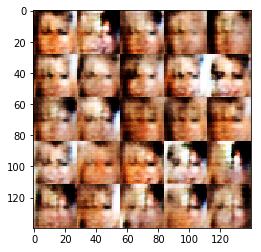

3201Epcho 1/1... Discriminator Loss: 1.2027... Generator Loss: 2.5233
3202Epcho 1/1... Discriminator Loss: 1.4063... Generator Loss: 0.4102
3203Epcho 1/1... Discriminator Loss: 1.1028... Generator Loss: 1.4550
3204Epcho 1/1... Discriminator Loss: 1.3625... Generator Loss: 0.4871
3205Epcho 1/1... Discriminator Loss: 1.3184... Generator Loss: 2.1832
3206Epcho 1/1... Discriminator Loss: 1.2386... Generator Loss: 0.5877
3207Epcho 1/1... Discriminator Loss: 1.2604... Generator Loss: 0.6915
3208Epcho 1/1... Discriminator Loss: 0.8795... Generator Loss: 1.1441
3209Epcho 1/1... Discriminator Loss: 0.8987... Generator Loss: 1.1683
3210Epcho 1/1... Discriminator Loss: 1.0692... Generator Loss: 0.6746
3211Epcho 1/1... Discriminator Loss: 1.2678... Generator Loss: 0.8908
3212Epcho 1/1... Discriminator Loss: 1.5175... Generator Loss: 0.8458
3213Epcho 1/1... Discriminator Loss: 1.1274... Generator Loss: 1.4083
3214Epcho 1/1... Discriminator Loss: 1.5587... Generator Loss: 0.4498
3215Epcho 1/1... Dis

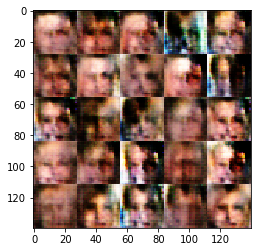

3301Epcho 1/1... Discriminator Loss: 1.2671... Generator Loss: 0.9845
3302Epcho 1/1... Discriminator Loss: 1.1788... Generator Loss: 0.7008
3303Epcho 1/1... Discriminator Loss: 1.1963... Generator Loss: 0.8001
3304Epcho 1/1... Discriminator Loss: 1.1233... Generator Loss: 1.0743
3305Epcho 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.4723
3306Epcho 1/1... Discriminator Loss: 1.3996... Generator Loss: 1.3435
3307Epcho 1/1... Discriminator Loss: 1.2687... Generator Loss: 0.5496
3308Epcho 1/1... Discriminator Loss: 1.2164... Generator Loss: 1.1314
3309Epcho 1/1... Discriminator Loss: 1.1870... Generator Loss: 0.6510
3310Epcho 1/1... Discriminator Loss: 1.2073... Generator Loss: 0.8282
3311Epcho 1/1... Discriminator Loss: 1.2159... Generator Loss: 0.7696
3312Epcho 1/1... Discriminator Loss: 1.0124... Generator Loss: 0.9226
3313Epcho 1/1... Discriminator Loss: 1.1399... Generator Loss: 0.7134
3314Epcho 1/1... Discriminator Loss: 1.3556... Generator Loss: 1.4332
3315Epcho 1/1... Dis

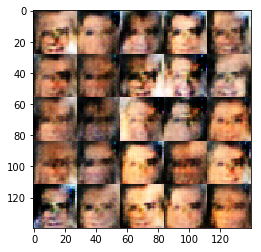

3401Epcho 1/1... Discriminator Loss: 1.2365... Generator Loss: 0.7541
3402Epcho 1/1... Discriminator Loss: 1.1634... Generator Loss: 1.0072
3403Epcho 1/1... Discriminator Loss: 1.4326... Generator Loss: 0.4645
3404Epcho 1/1... Discriminator Loss: 1.2461... Generator Loss: 1.2608
3405Epcho 1/1... Discriminator Loss: 1.4822... Generator Loss: 0.4066
3406Epcho 1/1... Discriminator Loss: 1.4229... Generator Loss: 1.4822
3407Epcho 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.4799
3408Epcho 1/1... Discriminator Loss: 1.3694... Generator Loss: 1.0855
3409Epcho 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.5288
3410Epcho 1/1... Discriminator Loss: 1.1823... Generator Loss: 1.0978
3411Epcho 1/1... Discriminator Loss: 1.3751... Generator Loss: 0.5459
3412Epcho 1/1... Discriminator Loss: 1.2135... Generator Loss: 0.9651
3413Epcho 1/1... Discriminator Loss: 1.2388... Generator Loss: 0.6452
3414Epcho 1/1... Discriminator Loss: 1.2490... Generator Loss: 1.0743
3415Epcho 1/1... Dis

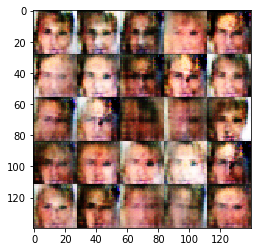

3501Epcho 1/1... Discriminator Loss: 1.3779... Generator Loss: 0.7984
3502Epcho 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.7952
3503Epcho 1/1... Discriminator Loss: 1.3784... Generator Loss: 0.7680
3504Epcho 1/1... Discriminator Loss: 1.2284... Generator Loss: 0.6283
3505Epcho 1/1... Discriminator Loss: 1.2901... Generator Loss: 0.9236
3506Epcho 1/1... Discriminator Loss: 1.2013... Generator Loss: 0.6412
3507Epcho 1/1... Discriminator Loss: 1.2779... Generator Loss: 1.0274
3508Epcho 1/1... Discriminator Loss: 1.3668... Generator Loss: 0.5887
3509Epcho 1/1... Discriminator Loss: 1.3239... Generator Loss: 0.7882
3510Epcho 1/1... Discriminator Loss: 1.3878... Generator Loss: 0.6040
3511Epcho 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.7056
3512Epcho 1/1... Discriminator Loss: 1.1152... Generator Loss: 1.1493
3513Epcho 1/1... Discriminator Loss: 1.2819... Generator Loss: 0.6665
3514Epcho 1/1... Discriminator Loss: 1.1925... Generator Loss: 0.7622
3515Epcho 1/1... Dis

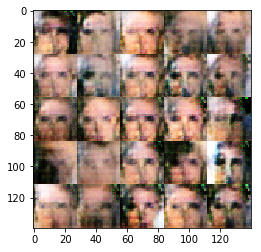

3601Epcho 1/1... Discriminator Loss: 1.1865... Generator Loss: 0.8913
3602Epcho 1/1... Discriminator Loss: 1.1953... Generator Loss: 0.6870
3603Epcho 1/1... Discriminator Loss: 1.4595... Generator Loss: 0.7434
3604Epcho 1/1... Discriminator Loss: 1.3007... Generator Loss: 0.5335
3605Epcho 1/1... Discriminator Loss: 1.1825... Generator Loss: 1.2073
3606Epcho 1/1... Discriminator Loss: 1.5324... Generator Loss: 0.4110
3607Epcho 1/1... Discriminator Loss: 1.3049... Generator Loss: 1.1963
3608Epcho 1/1... Discriminator Loss: 1.2738... Generator Loss: 0.5313
3609Epcho 1/1... Discriminator Loss: 1.2167... Generator Loss: 1.0814
3610Epcho 1/1... Discriminator Loss: 1.2916... Generator Loss: 0.5373
3611Epcho 1/1... Discriminator Loss: 1.2671... Generator Loss: 1.1032
3612Epcho 1/1... Discriminator Loss: 1.3787... Generator Loss: 0.4752
3613Epcho 1/1... Discriminator Loss: 1.2962... Generator Loss: 1.1180
3614Epcho 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.4961
3615Epcho 1/1... Dis

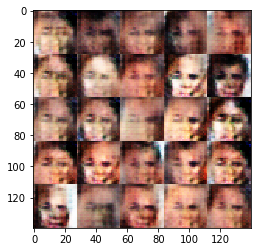

3701Epcho 1/1... Discriminator Loss: 1.3469... Generator Loss: 1.2413
3702Epcho 1/1... Discriminator Loss: 1.4323... Generator Loss: 0.3983
3703Epcho 1/1... Discriminator Loss: 1.4647... Generator Loss: 1.2657
3704Epcho 1/1... Discriminator Loss: 1.4606... Generator Loss: 0.4572
3705Epcho 1/1... Discriminator Loss: 1.4410... Generator Loss: 1.0167
3706Epcho 1/1... Discriminator Loss: 1.2886... Generator Loss: 0.5892
3707Epcho 1/1... Discriminator Loss: 1.1653... Generator Loss: 1.0909
3708Epcho 1/1... Discriminator Loss: 1.4110... Generator Loss: 0.4684
3709Epcho 1/1... Discriminator Loss: 1.3551... Generator Loss: 1.4083
3710Epcho 1/1... Discriminator Loss: 1.4584... Generator Loss: 0.3895
3711Epcho 1/1... Discriminator Loss: 1.3177... Generator Loss: 1.5402
3712Epcho 1/1... Discriminator Loss: 1.4393... Generator Loss: 0.4397
3713Epcho 1/1... Discriminator Loss: 1.2651... Generator Loss: 1.0093
3714Epcho 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.7717
3715Epcho 1/1... Dis

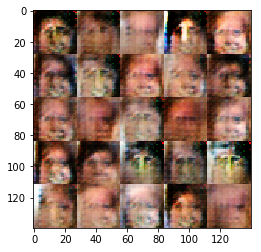

3801Epcho 1/1... Discriminator Loss: 1.3256... Generator Loss: 0.5017
3802Epcho 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.7504
3803Epcho 1/1... Discriminator Loss: 1.2470... Generator Loss: 0.7581
3804Epcho 1/1... Discriminator Loss: 1.1298... Generator Loss: 0.8287
3805Epcho 1/1... Discriminator Loss: 1.2469... Generator Loss: 0.6054
3806Epcho 1/1... Discriminator Loss: 1.4752... Generator Loss: 0.7245
3807Epcho 1/1... Discriminator Loss: 1.2297... Generator Loss: 0.8794
3808Epcho 1/1... Discriminator Loss: 1.2412... Generator Loss: 0.5582
3809Epcho 1/1... Discriminator Loss: 1.4005... Generator Loss: 0.9799
3810Epcho 1/1... Discriminator Loss: 1.1503... Generator Loss: 0.6966
3811Epcho 1/1... Discriminator Loss: 0.9956... Generator Loss: 1.3806
3812Epcho 1/1... Discriminator Loss: 1.1897... Generator Loss: 0.5511
3813Epcho 1/1... Discriminator Loss: 1.1679... Generator Loss: 1.6186
3814Epcho 1/1... Discriminator Loss: 1.4648... Generator Loss: 0.4012
3815Epcho 1/1... Dis

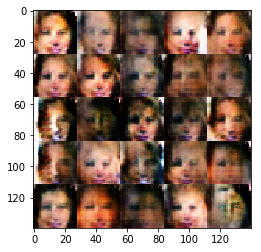

3901Epcho 1/1... Discriminator Loss: 1.1331... Generator Loss: 0.9018
3902Epcho 1/1... Discriminator Loss: 1.5058... Generator Loss: 0.4227
3903Epcho 1/1... Discriminator Loss: 1.3553... Generator Loss: 1.3718
3904Epcho 1/1... Discriminator Loss: 1.5234... Generator Loss: 0.3450
3905Epcho 1/1... Discriminator Loss: 1.2764... Generator Loss: 1.1842
3906Epcho 1/1... Discriminator Loss: 1.1807... Generator Loss: 0.7331
3907Epcho 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.6978
3908Epcho 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.9791
3909Epcho 1/1... Discriminator Loss: 1.2620... Generator Loss: 0.5367
3910Epcho 1/1... Discriminator Loss: 1.2669... Generator Loss: 1.1699
3911Epcho 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.4633
3912Epcho 1/1... Discriminator Loss: 1.3241... Generator Loss: 1.1634
3913Epcho 1/1... Discriminator Loss: 1.5418... Generator Loss: 0.3973
3914Epcho 1/1... Discriminator Loss: 1.3153... Generator Loss: 1.1590
3915Epcho 1/1... Dis

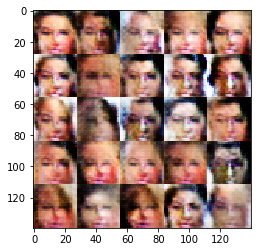

4001Epcho 1/1... Discriminator Loss: 1.2313... Generator Loss: 0.8735
4002Epcho 1/1... Discriminator Loss: 1.0686... Generator Loss: 0.9580
4003Epcho 1/1... Discriminator Loss: 1.3667... Generator Loss: 0.5363
4004Epcho 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.7694
4005Epcho 1/1... Discriminator Loss: 1.2014... Generator Loss: 0.6385
4006Epcho 1/1... Discriminator Loss: 1.2734... Generator Loss: 0.8943
4007Epcho 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.6517
4008Epcho 1/1... Discriminator Loss: 1.2382... Generator Loss: 0.6923
4009Epcho 1/1... Discriminator Loss: 1.2052... Generator Loss: 0.8728
4010Epcho 1/1... Discriminator Loss: 1.2874... Generator Loss: 0.5646
4011Epcho 1/1... Discriminator Loss: 1.1357... Generator Loss: 1.1464
4012Epcho 1/1... Discriminator Loss: 1.3135... Generator Loss: 0.5692
4013Epcho 1/1... Discriminator Loss: 1.3145... Generator Loss: 1.3891
4014Epcho 1/1... Discriminator Loss: 1.5795... Generator Loss: 0.3483
4015Epcho 1/1... Dis

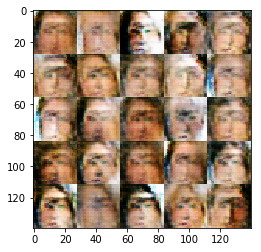

4101Epcho 1/1... Discriminator Loss: 1.5470... Generator Loss: 0.3463
4102Epcho 1/1... Discriminator Loss: 1.5702... Generator Loss: 1.4915
4103Epcho 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.4587
4104Epcho 1/1... Discriminator Loss: 1.1094... Generator Loss: 1.0248
4105Epcho 1/1... Discriminator Loss: 1.2417... Generator Loss: 0.6882
4106Epcho 1/1... Discriminator Loss: 1.2470... Generator Loss: 0.8117
4107Epcho 1/1... Discriminator Loss: 1.0353... Generator Loss: 0.8270
4108Epcho 1/1... Discriminator Loss: 1.2559... Generator Loss: 0.6509
4109Epcho 1/1... Discriminator Loss: 1.1524... Generator Loss: 0.8711
4110Epcho 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.7055
4111Epcho 1/1... Discriminator Loss: 1.0617... Generator Loss: 0.9964
4112Epcho 1/1... Discriminator Loss: 1.1058... Generator Loss: 0.7498
4113Epcho 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.9558
4114Epcho 1/1... Discriminator Loss: 1.4312... Generator Loss: 0.5169
4115Epcho 1/1... Dis

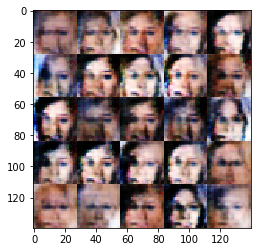

4201Epcho 1/1... Discriminator Loss: 1.2368... Generator Loss: 1.1783
4202Epcho 1/1... Discriminator Loss: 1.6730... Generator Loss: 0.3486
4203Epcho 1/1... Discriminator Loss: 1.3405... Generator Loss: 1.3102
4204Epcho 1/1... Discriminator Loss: 1.3234... Generator Loss: 0.4964
4205Epcho 1/1... Discriminator Loss: 1.2822... Generator Loss: 0.9440
4206Epcho 1/1... Discriminator Loss: 1.3510... Generator Loss: 0.7111
4207Epcho 1/1... Discriminator Loss: 1.1762... Generator Loss: 0.7201
4208Epcho 1/1... Discriminator Loss: 1.3206... Generator Loss: 0.7692
4209Epcho 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.7677
4210Epcho 1/1... Discriminator Loss: 1.2262... Generator Loss: 0.9996
4211Epcho 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.5148
4212Epcho 1/1... Discriminator Loss: 1.2294... Generator Loss: 1.1929
4213Epcho 1/1... Discriminator Loss: 1.3393... Generator Loss: 0.5197
4214Epcho 1/1... Discriminator Loss: 1.1366... Generator Loss: 1.0602
4215Epcho 1/1... Dis

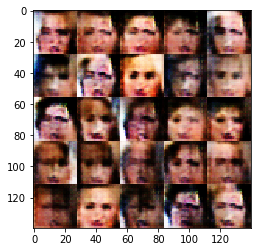

4301Epcho 1/1... Discriminator Loss: 1.6790... Generator Loss: 1.8723
4302Epcho 1/1... Discriminator Loss: 1.3434... Generator Loss: 0.3994
4303Epcho 1/1... Discriminator Loss: 1.1402... Generator Loss: 1.3652
4304Epcho 1/1... Discriminator Loss: 1.1170... Generator Loss: 0.6207
4305Epcho 1/1... Discriminator Loss: 1.2874... Generator Loss: 0.8869
4306Epcho 1/1... Discriminator Loss: 1.2981... Generator Loss: 0.5747
4307Epcho 1/1... Discriminator Loss: 1.2954... Generator Loss: 1.1135
4308Epcho 1/1... Discriminator Loss: 1.1986... Generator Loss: 0.5786
4309Epcho 1/1... Discriminator Loss: 1.0332... Generator Loss: 1.5904
4310Epcho 1/1... Discriminator Loss: 1.3693... Generator Loss: 0.4803
4311Epcho 1/1... Discriminator Loss: 1.4253... Generator Loss: 1.7890
4312Epcho 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.3939
4313Epcho 1/1... Discriminator Loss: 1.1516... Generator Loss: 1.3368
4314Epcho 1/1... Discriminator Loss: 1.0922... Generator Loss: 0.7398
4315Epcho 1/1... Dis

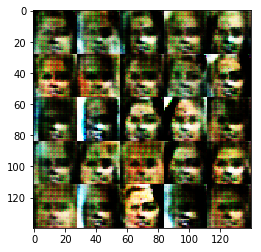

4401Epcho 1/1... Discriminator Loss: 0.5867... Generator Loss: 1.4876
4402Epcho 1/1... Discriminator Loss: 0.8353... Generator Loss: 0.9405
4403Epcho 1/1... Discriminator Loss: 0.6955... Generator Loss: 2.7802
4404Epcho 1/1... Discriminator Loss: 0.7764... Generator Loss: 0.9220
4405Epcho 1/1... Discriminator Loss: 1.5144... Generator Loss: 1.6228
4406Epcho 1/1... Discriminator Loss: 1.2565... Generator Loss: 0.4873
4407Epcho 1/1... Discriminator Loss: 1.5809... Generator Loss: 1.8445
4408Epcho 1/1... Discriminator Loss: 1.5397... Generator Loss: 0.3096
4409Epcho 1/1... Discriminator Loss: 1.3715... Generator Loss: 1.6779
4410Epcho 1/1... Discriminator Loss: 1.0788... Generator Loss: 0.6287
4411Epcho 1/1... Discriminator Loss: 0.9624... Generator Loss: 1.7620
4412Epcho 1/1... Discriminator Loss: 1.2799... Generator Loss: 0.5422
4413Epcho 1/1... Discriminator Loss: 1.1570... Generator Loss: 2.5649
4414Epcho 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.4433
4415Epcho 1/1... Dis

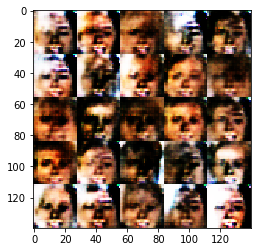

4501Epcho 1/1... Discriminator Loss: 0.5920... Generator Loss: 2.0340
4502Epcho 1/1... Discriminator Loss: 0.9891... Generator Loss: 1.6598
4503Epcho 1/1... Discriminator Loss: 1.9667... Generator Loss: 1.1662
4504Epcho 1/1... Discriminator Loss: 2.1151... Generator Loss: 1.3887
4505Epcho 1/1... Discriminator Loss: 1.7861... Generator Loss: 2.3588
4506Epcho 1/1... Discriminator Loss: 1.8943... Generator Loss: 0.2272
4507Epcho 1/1... Discriminator Loss: 3.5058... Generator Loss: 3.2708
4508Epcho 1/1... Discriminator Loss: 1.9314... Generator Loss: 0.2086
4509Epcho 1/1... Discriminator Loss: 1.2269... Generator Loss: 1.5934
4510Epcho 1/1... Discriminator Loss: 1.2130... Generator Loss: 0.6159
4511Epcho 1/1... Discriminator Loss: 1.2506... Generator Loss: 0.6267
4512Epcho 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.7656
4513Epcho 1/1... Discriminator Loss: 0.9328... Generator Loss: 1.7679
4514Epcho 1/1... Discriminator Loss: 1.0282... Generator Loss: 0.6977
4515Epcho 1/1... Dis

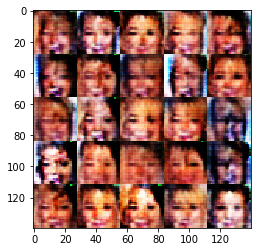

4601Epcho 1/1... Discriminator Loss: 0.8301... Generator Loss: 1.0669
4602Epcho 1/1... Discriminator Loss: 0.9634... Generator Loss: 1.3716
4603Epcho 1/1... Discriminator Loss: 0.4456... Generator Loss: 3.1189
4604Epcho 1/1... Discriminator Loss: 1.8721... Generator Loss: 0.3274
4605Epcho 1/1... Discriminator Loss: 1.8505... Generator Loss: 4.5231
4606Epcho 1/1... Discriminator Loss: 0.9650... Generator Loss: 1.0006
4607Epcho 1/1... Discriminator Loss: 0.5160... Generator Loss: 1.8012
4608Epcho 1/1... Discriminator Loss: 0.4051... Generator Loss: 2.5279
4609Epcho 1/1... Discriminator Loss: 0.4008... Generator Loss: 1.9129
4610Epcho 1/1... Discriminator Loss: 0.5171... Generator Loss: 1.4089
4611Epcho 1/1... Discriminator Loss: 0.4577... Generator Loss: 3.2397
4612Epcho 1/1... Discriminator Loss: 1.1573... Generator Loss: 0.6040
4613Epcho 1/1... Discriminator Loss: 0.6251... Generator Loss: 3.9090
4614Epcho 1/1... Discriminator Loss: 1.1431... Generator Loss: 0.5851
4615Epcho 1/1... Dis

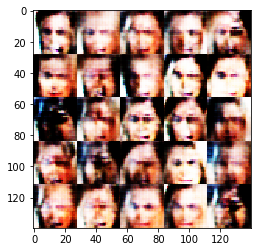

4701Epcho 1/1... Discriminator Loss: 0.8898... Generator Loss: 0.9836
4702Epcho 1/1... Discriminator Loss: 1.3046... Generator Loss: 3.4260
4703Epcho 1/1... Discriminator Loss: 1.3473... Generator Loss: 0.4228
4704Epcho 1/1... Discriminator Loss: 1.2371... Generator Loss: 2.8586
4705Epcho 1/1... Discriminator Loss: 1.9928... Generator Loss: 0.2685
4706Epcho 1/1... Discriminator Loss: 1.0646... Generator Loss: 1.9166
4707Epcho 1/1... Discriminator Loss: 0.9732... Generator Loss: 0.7259
4708Epcho 1/1... Discriminator Loss: 0.7518... Generator Loss: 2.5072
4709Epcho 1/1... Discriminator Loss: 1.3375... Generator Loss: 0.4642
4710Epcho 1/1... Discriminator Loss: 1.0511... Generator Loss: 3.1201
4711Epcho 1/1... Discriminator Loss: 0.9617... Generator Loss: 0.7728
4712Epcho 1/1... Discriminator Loss: 0.7061... Generator Loss: 1.3149
4713Epcho 1/1... Discriminator Loss: 0.6976... Generator Loss: 1.8571
4714Epcho 1/1... Discriminator Loss: 0.4038... Generator Loss: 2.2607
4715Epcho 1/1... Dis

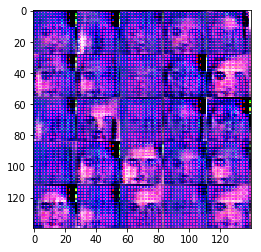

4801Epcho 1/1... Discriminator Loss: 0.1317... Generator Loss: 3.5864
4802Epcho 1/1... Discriminator Loss: 0.1967... Generator Loss: 2.5615
4803Epcho 1/1... Discriminator Loss: 0.2106... Generator Loss: 2.4695
4804Epcho 1/1... Discriminator Loss: 0.2362... Generator Loss: 2.6906
4805Epcho 1/1... Discriminator Loss: 0.2484... Generator Loss: 2.2064
4806Epcho 1/1... Discriminator Loss: 0.2336... Generator Loss: 2.1488
4807Epcho 1/1... Discriminator Loss: 0.2318... Generator Loss: 3.0541
4808Epcho 1/1... Discriminator Loss: 0.1751... Generator Loss: 2.6861
4809Epcho 1/1... Discriminator Loss: 0.1992... Generator Loss: 2.4435
4810Epcho 1/1... Discriminator Loss: 0.2090... Generator Loss: 3.0484
4811Epcho 1/1... Discriminator Loss: 0.1072... Generator Loss: 4.1701
4812Epcho 1/1... Discriminator Loss: 0.1740... Generator Loss: 2.7822
4813Epcho 1/1... Discriminator Loss: 0.3370... Generator Loss: 2.4163
4814Epcho 1/1... Discriminator Loss: 0.2738... Generator Loss: 4.6473
4815Epcho 1/1... Dis

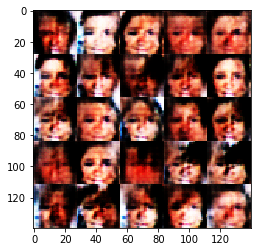

4901Epcho 1/1... Discriminator Loss: 0.4858... Generator Loss: 4.8322
4902Epcho 1/1... Discriminator Loss: 0.3870... Generator Loss: 2.0397
4903Epcho 1/1... Discriminator Loss: 0.5568... Generator Loss: 1.4157
4904Epcho 1/1... Discriminator Loss: 0.5080... Generator Loss: 5.3741
4905Epcho 1/1... Discriminator Loss: 0.4204... Generator Loss: 1.8489
4906Epcho 1/1... Discriminator Loss: 0.7408... Generator Loss: 1.2690
4907Epcho 1/1... Discriminator Loss: 0.6611... Generator Loss: 1.6799
4908Epcho 1/1... Discriminator Loss: 0.5692... Generator Loss: 3.6145
4909Epcho 1/1... Discriminator Loss: 1.6795... Generator Loss: 0.4384
4910Epcho 1/1... Discriminator Loss: 1.4699... Generator Loss: 3.5735
4911Epcho 1/1... Discriminator Loss: 0.7417... Generator Loss: 1.1871
4912Epcho 1/1... Discriminator Loss: 0.5635... Generator Loss: 5.4524
4913Epcho 1/1... Discriminator Loss: 1.2569... Generator Loss: 0.6604
4914Epcho 1/1... Discriminator Loss: 0.7839... Generator Loss: 2.7503
4915Epcho 1/1... Dis

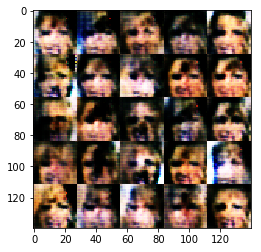

5001Epcho 1/1... Discriminator Loss: 1.9994... Generator Loss: 0.8203
5002Epcho 1/1... Discriminator Loss: 1.8803... Generator Loss: 4.2025
5003Epcho 1/1... Discriminator Loss: 2.2172... Generator Loss: 0.1914
5004Epcho 1/1... Discriminator Loss: 1.3847... Generator Loss: 2.4635
5005Epcho 1/1... Discriminator Loss: 1.0963... Generator Loss: 0.7069
5006Epcho 1/1... Discriminator Loss: 1.0889... Generator Loss: 1.2859
5007Epcho 1/1... Discriminator Loss: 1.0819... Generator Loss: 0.6234
5008Epcho 1/1... Discriminator Loss: 1.0633... Generator Loss: 1.9384
5009Epcho 1/1... Discriminator Loss: 1.4896... Generator Loss: 0.4923
5010Epcho 1/1... Discriminator Loss: 1.1976... Generator Loss: 2.8052
5011Epcho 1/1... Discriminator Loss: 1.4091... Generator Loss: 0.4171
5012Epcho 1/1... Discriminator Loss: 1.2309... Generator Loss: 1.7737
5013Epcho 1/1... Discriminator Loss: 1.2887... Generator Loss: 0.5292
5014Epcho 1/1... Discriminator Loss: 1.0562... Generator Loss: 1.1599
5015Epcho 1/1... Dis

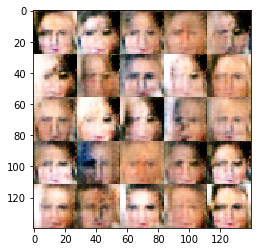

5101Epcho 1/1... Discriminator Loss: 1.4514... Generator Loss: 1.3713
5102Epcho 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.4518
5103Epcho 1/1... Discriminator Loss: 1.2314... Generator Loss: 1.1309
5104Epcho 1/1... Discriminator Loss: 1.3166... Generator Loss: 0.5302
5105Epcho 1/1... Discriminator Loss: 1.1670... Generator Loss: 1.0913
5106Epcho 1/1... Discriminator Loss: 0.9473... Generator Loss: 0.7676
5107Epcho 1/1... Discriminator Loss: 1.0378... Generator Loss: 1.1198
5108Epcho 1/1... Discriminator Loss: 0.9138... Generator Loss: 0.8739
5109Epcho 1/1... Discriminator Loss: 1.2729... Generator Loss: 1.0238
5110Epcho 1/1... Discriminator Loss: 1.1264... Generator Loss: 0.7160
5111Epcho 1/1... Discriminator Loss: 1.1863... Generator Loss: 1.0237
5112Epcho 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.6119
5113Epcho 1/1... Discriminator Loss: 1.1393... Generator Loss: 1.1574
5114Epcho 1/1... Discriminator Loss: 1.3690... Generator Loss: 0.4475
5115Epcho 1/1... Dis

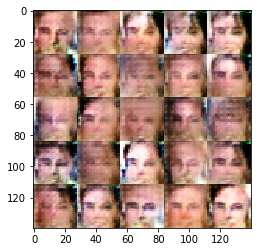

5201Epcho 1/1... Discriminator Loss: 1.2670... Generator Loss: 0.5377
5202Epcho 1/1... Discriminator Loss: 1.2545... Generator Loss: 1.1593
5203Epcho 1/1... Discriminator Loss: 1.4718... Generator Loss: 0.4437
5204Epcho 1/1... Discriminator Loss: 1.1612... Generator Loss: 1.5097
5205Epcho 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.4578
5206Epcho 1/1... Discriminator Loss: 1.2480... Generator Loss: 1.3627
5207Epcho 1/1... Discriminator Loss: 1.2426... Generator Loss: 0.5437
5208Epcho 1/1... Discriminator Loss: 1.2327... Generator Loss: 1.2915
5209Epcho 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.5067
5210Epcho 1/1... Discriminator Loss: 1.1104... Generator Loss: 1.5002
5211Epcho 1/1... Discriminator Loss: 1.1173... Generator Loss: 0.6338
5212Epcho 1/1... Discriminator Loss: 1.1154... Generator Loss: 1.2235
5213Epcho 1/1... Discriminator Loss: 1.1948... Generator Loss: 0.6055
5214Epcho 1/1... Discriminator Loss: 1.1461... Generator Loss: 1.1214
5215Epcho 1/1... Dis

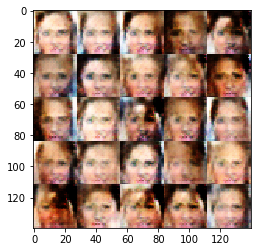

5301Epcho 1/1... Discriminator Loss: 1.2048... Generator Loss: 0.6006
5302Epcho 1/1... Discriminator Loss: 1.3419... Generator Loss: 1.2163
5303Epcho 1/1... Discriminator Loss: 1.6044... Generator Loss: 0.3871
5304Epcho 1/1... Discriminator Loss: 1.2352... Generator Loss: 1.4022
5305Epcho 1/1... Discriminator Loss: 1.4788... Generator Loss: 0.4202
5306Epcho 1/1... Discriminator Loss: 1.3316... Generator Loss: 1.1868
5307Epcho 1/1... Discriminator Loss: 1.3963... Generator Loss: 0.4169
5308Epcho 1/1... Discriminator Loss: 1.4470... Generator Loss: 1.0746
5309Epcho 1/1... Discriminator Loss: 1.3218... Generator Loss: 0.5768
5310Epcho 1/1... Discriminator Loss: 1.2706... Generator Loss: 0.7968
5311Epcho 1/1... Discriminator Loss: 1.2204... Generator Loss: 0.8915
5312Epcho 1/1... Discriminator Loss: 1.3451... Generator Loss: 0.5598
5313Epcho 1/1... Discriminator Loss: 1.3035... Generator Loss: 1.0047
5314Epcho 1/1... Discriminator Loss: 1.3653... Generator Loss: 0.5594
5315Epcho 1/1... Dis

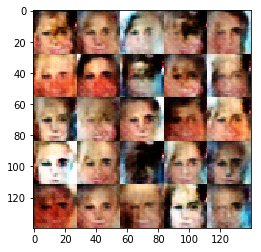

5401Epcho 1/1... Discriminator Loss: 1.2396... Generator Loss: 0.5533
5402Epcho 1/1... Discriminator Loss: 1.2086... Generator Loss: 0.8858
5403Epcho 1/1... Discriminator Loss: 1.0828... Generator Loss: 0.8317
5404Epcho 1/1... Discriminator Loss: 1.1791... Generator Loss: 0.7764
5405Epcho 1/1... Discriminator Loss: 1.2832... Generator Loss: 1.1338
5406Epcho 1/1... Discriminator Loss: 1.3148... Generator Loss: 0.4978
5407Epcho 1/1... Discriminator Loss: 1.2005... Generator Loss: 1.0636
5408Epcho 1/1... Discriminator Loss: 1.3004... Generator Loss: 0.5570
5409Epcho 1/1... Discriminator Loss: 1.2342... Generator Loss: 1.1658
5410Epcho 1/1... Discriminator Loss: 1.2945... Generator Loss: 0.5583
5411Epcho 1/1... Discriminator Loss: 1.0917... Generator Loss: 1.2270
5412Epcho 1/1... Discriminator Loss: 1.1721... Generator Loss: 0.5946
5413Epcho 1/1... Discriminator Loss: 1.2150... Generator Loss: 1.2175
5414Epcho 1/1... Discriminator Loss: 1.2042... Generator Loss: 0.5197
5415Epcho 1/1... Dis

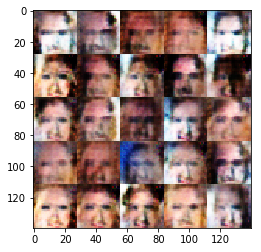

5501Epcho 1/1... Discriminator Loss: 1.3024... Generator Loss: 0.6573
5502Epcho 1/1... Discriminator Loss: 1.1628... Generator Loss: 0.6768
5503Epcho 1/1... Discriminator Loss: 1.2341... Generator Loss: 0.9544
5504Epcho 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.6720
5505Epcho 1/1... Discriminator Loss: 1.2188... Generator Loss: 0.8539
5506Epcho 1/1... Discriminator Loss: 1.2536... Generator Loss: 0.7031
5507Epcho 1/1... Discriminator Loss: 1.1253... Generator Loss: 0.8868
5508Epcho 1/1... Discriminator Loss: 1.2293... Generator Loss: 0.6001
5509Epcho 1/1... Discriminator Loss: 1.1950... Generator Loss: 1.1288
5510Epcho 1/1... Discriminator Loss: 1.4904... Generator Loss: 0.4219
5511Epcho 1/1... Discriminator Loss: 1.3501... Generator Loss: 1.3118
5512Epcho 1/1... Discriminator Loss: 1.3298... Generator Loss: 0.4790
5513Epcho 1/1... Discriminator Loss: 1.3951... Generator Loss: 1.0059
5514Epcho 1/1... Discriminator Loss: 1.3381... Generator Loss: 0.6244
5515Epcho 1/1... Dis

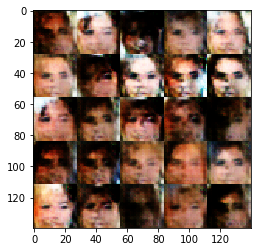

5601Epcho 1/1... Discriminator Loss: 1.2028... Generator Loss: 1.3642
5602Epcho 1/1... Discriminator Loss: 1.5048... Generator Loss: 0.4564
5603Epcho 1/1... Discriminator Loss: 1.3549... Generator Loss: 1.3436
5604Epcho 1/1... Discriminator Loss: 1.5344... Generator Loss: 0.3710
5605Epcho 1/1... Discriminator Loss: 1.2739... Generator Loss: 1.2864
5606Epcho 1/1... Discriminator Loss: 1.1446... Generator Loss: 0.6775
5607Epcho 1/1... Discriminator Loss: 1.2427... Generator Loss: 0.6833
5608Epcho 1/1... Discriminator Loss: 1.3858... Generator Loss: 0.9723
5609Epcho 1/1... Discriminator Loss: 1.2801... Generator Loss: 0.5672
5610Epcho 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.9925
5611Epcho 1/1... Discriminator Loss: 1.2654... Generator Loss: 0.6632
5612Epcho 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.7712
5613Epcho 1/1... Discriminator Loss: 1.2745... Generator Loss: 0.6424
5614Epcho 1/1... Discriminator Loss: 1.3398... Generator Loss: 1.1680
5615Epcho 1/1... Dis

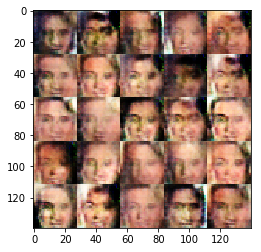

5701Epcho 1/1... Discriminator Loss: 1.4610... Generator Loss: 0.4234
5702Epcho 1/1... Discriminator Loss: 1.3617... Generator Loss: 1.2457
5703Epcho 1/1... Discriminator Loss: 1.4057... Generator Loss: 0.4431
5704Epcho 1/1... Discriminator Loss: 1.2124... Generator Loss: 1.1689
5705Epcho 1/1... Discriminator Loss: 1.1503... Generator Loss: 0.6138
5706Epcho 1/1... Discriminator Loss: 1.2081... Generator Loss: 0.7377
5707Epcho 1/1... Discriminator Loss: 1.1728... Generator Loss: 0.9253
5708Epcho 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.4897
5709Epcho 1/1... Discriminator Loss: 1.4343... Generator Loss: 1.1700
5710Epcho 1/1... Discriminator Loss: 1.4921... Generator Loss: 0.4127
5711Epcho 1/1... Discriminator Loss: 1.6387... Generator Loss: 1.2971
5712Epcho 1/1... Discriminator Loss: 1.5221... Generator Loss: 0.3669
5713Epcho 1/1... Discriminator Loss: 1.4926... Generator Loss: 1.2900
5714Epcho 1/1... Discriminator Loss: 1.5698... Generator Loss: 0.3812
5715Epcho 1/1... Dis

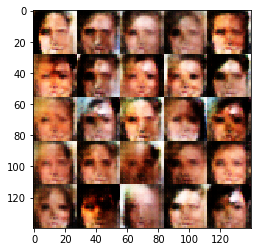

5801Epcho 1/1... Discriminator Loss: 1.3002... Generator Loss: 1.1292
5802Epcho 1/1... Discriminator Loss: 1.2515... Generator Loss: 0.5558
5803Epcho 1/1... Discriminator Loss: 1.2994... Generator Loss: 1.0075
5804Epcho 1/1... Discriminator Loss: 1.3116... Generator Loss: 0.5124
5805Epcho 1/1... Discriminator Loss: 1.1538... Generator Loss: 1.4302
5806Epcho 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.4597
5807Epcho 1/1... Discriminator Loss: 1.2041... Generator Loss: 1.3997
5808Epcho 1/1... Discriminator Loss: 1.4878... Generator Loss: 0.4127
5809Epcho 1/1... Discriminator Loss: 1.3483... Generator Loss: 0.9903
5810Epcho 1/1... Discriminator Loss: 1.1566... Generator Loss: 0.9450
5811Epcho 1/1... Discriminator Loss: 1.5474... Generator Loss: 0.4053
5812Epcho 1/1... Discriminator Loss: 1.6917... Generator Loss: 1.5957
5813Epcho 1/1... Discriminator Loss: 1.4669... Generator Loss: 0.4034
5814Epcho 1/1... Discriminator Loss: 1.4000... Generator Loss: 1.2462
5815Epcho 1/1... Dis

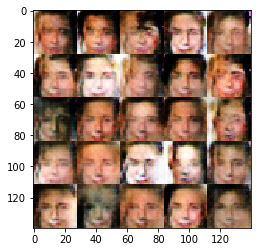

5901Epcho 1/1... Discriminator Loss: 1.2829... Generator Loss: 1.1605
5902Epcho 1/1... Discriminator Loss: 1.3763... Generator Loss: 0.4730
5903Epcho 1/1... Discriminator Loss: 1.3194... Generator Loss: 1.0549
5904Epcho 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.5008
5905Epcho 1/1... Discriminator Loss: 1.2940... Generator Loss: 0.9650
5906Epcho 1/1... Discriminator Loss: 1.1789... Generator Loss: 0.6602
5907Epcho 1/1... Discriminator Loss: 1.1190... Generator Loss: 0.8360
5908Epcho 1/1... Discriminator Loss: 1.2771... Generator Loss: 0.7629
5909Epcho 1/1... Discriminator Loss: 1.2818... Generator Loss: 0.7722
5910Epcho 1/1... Discriminator Loss: 1.2949... Generator Loss: 0.6779
5911Epcho 1/1... Discriminator Loss: 1.2393... Generator Loss: 1.0427
5912Epcho 1/1... Discriminator Loss: 1.2102... Generator Loss: 0.6697
5913Epcho 1/1... Discriminator Loss: 1.1415... Generator Loss: 1.0201
5914Epcho 1/1... Discriminator Loss: 1.1672... Generator Loss: 0.7462
5915Epcho 1/1... Dis

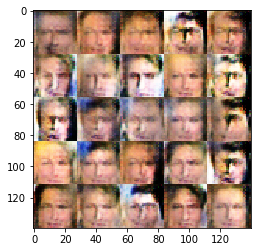

6001Epcho 1/1... Discriminator Loss: 1.1975... Generator Loss: 0.7271
6002Epcho 1/1... Discriminator Loss: 1.2849... Generator Loss: 0.8201
6003Epcho 1/1... Discriminator Loss: 1.1708... Generator Loss: 0.7251
6004Epcho 1/1... Discriminator Loss: 1.1531... Generator Loss: 0.9203
6005Epcho 1/1... Discriminator Loss: 1.2589... Generator Loss: 0.6111
6006Epcho 1/1... Discriminator Loss: 1.3366... Generator Loss: 0.7602
6007Epcho 1/1... Discriminator Loss: 1.2311... Generator Loss: 0.7541
6008Epcho 1/1... Discriminator Loss: 1.2967... Generator Loss: 0.6629
6009Epcho 1/1... Discriminator Loss: 1.1427... Generator Loss: 1.1478
6010Epcho 1/1... Discriminator Loss: 1.7121... Generator Loss: 0.3046
6011Epcho 1/1... Discriminator Loss: 1.5642... Generator Loss: 1.5910
6012Epcho 1/1... Discriminator Loss: 1.4585... Generator Loss: 0.3985
6013Epcho 1/1... Discriminator Loss: 1.3598... Generator Loss: 0.8727
6014Epcho 1/1... Discriminator Loss: 1.5145... Generator Loss: 0.7080
6015Epcho 1/1... Dis

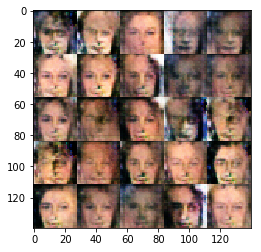

6101Epcho 1/1... Discriminator Loss: 1.3516... Generator Loss: 0.5348
6102Epcho 1/1... Discriminator Loss: 1.2282... Generator Loss: 0.8420
6103Epcho 1/1... Discriminator Loss: 1.2560... Generator Loss: 0.7497
6104Epcho 1/1... Discriminator Loss: 1.2580... Generator Loss: 0.6744
6105Epcho 1/1... Discriminator Loss: 1.2288... Generator Loss: 0.8675
6106Epcho 1/1... Discriminator Loss: 1.3091... Generator Loss: 0.5526
6107Epcho 1/1... Discriminator Loss: 1.3070... Generator Loss: 1.0770
6108Epcho 1/1... Discriminator Loss: 1.4602... Generator Loss: 0.4586
6109Epcho 1/1... Discriminator Loss: 1.3108... Generator Loss: 1.0874
6110Epcho 1/1... Discriminator Loss: 1.3550... Generator Loss: 0.4983
6111Epcho 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.8855
6112Epcho 1/1... Discriminator Loss: 1.2926... Generator Loss: 0.6369
6113Epcho 1/1... Discriminator Loss: 1.1043... Generator Loss: 1.0327
6114Epcho 1/1... Discriminator Loss: 1.3355... Generator Loss: 0.5392
6115Epcho 1/1... Dis

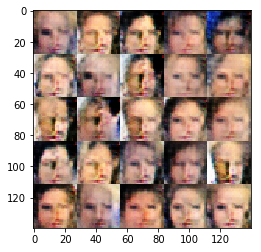

6201Epcho 1/1... Discriminator Loss: 1.2166... Generator Loss: 1.0082
6202Epcho 1/1... Discriminator Loss: 1.2577... Generator Loss: 0.5978
6203Epcho 1/1... Discriminator Loss: 1.2464... Generator Loss: 1.0974
6204Epcho 1/1... Discriminator Loss: 1.3593... Generator Loss: 0.4468
6205Epcho 1/1... Discriminator Loss: 1.3018... Generator Loss: 1.3156
6206Epcho 1/1... Discriminator Loss: 1.3973... Generator Loss: 0.4392
6207Epcho 1/1... Discriminator Loss: 1.3675... Generator Loss: 1.2037
6208Epcho 1/1... Discriminator Loss: 1.2844... Generator Loss: 0.5750
6209Epcho 1/1... Discriminator Loss: 1.1769... Generator Loss: 1.0552
6210Epcho 1/1... Discriminator Loss: 1.2514... Generator Loss: 0.6656
6211Epcho 1/1... Discriminator Loss: 1.1607... Generator Loss: 0.7365
6212Epcho 1/1... Discriminator Loss: 1.1022... Generator Loss: 0.7680
6213Epcho 1/1... Discriminator Loss: 1.2254... Generator Loss: 0.7285
6214Epcho 1/1... Discriminator Loss: 1.0549... Generator Loss: 1.1327
6215Epcho 1/1... Dis

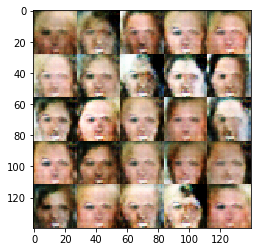

6301Epcho 1/1... Discriminator Loss: 1.1990... Generator Loss: 0.9113
6302Epcho 1/1... Discriminator Loss: 1.1631... Generator Loss: 0.8355
6303Epcho 1/1... Discriminator Loss: 1.2003... Generator Loss: 0.6387
6304Epcho 1/1... Discriminator Loss: 1.2295... Generator Loss: 0.9638
6305Epcho 1/1... Discriminator Loss: 1.1812... Generator Loss: 0.7367
6306Epcho 1/1... Discriminator Loss: 1.2404... Generator Loss: 0.7123
6307Epcho 1/1... Discriminator Loss: 1.1335... Generator Loss: 1.0242
6308Epcho 1/1... Discriminator Loss: 1.3581... Generator Loss: 0.4769
6309Epcho 1/1... Discriminator Loss: 1.4717... Generator Loss: 1.2874
6310Epcho 1/1... Discriminator Loss: 1.4054... Generator Loss: 0.4170
6311Epcho 1/1... Discriminator Loss: 1.2341... Generator Loss: 1.3304
6312Epcho 1/1... Discriminator Loss: 1.5783... Generator Loss: 0.3646
6313Epcho 1/1... Discriminator Loss: 1.4160... Generator Loss: 1.2883
6314Epcho 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.5334
6315Epcho 1/1... Dis

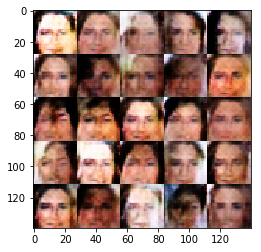

6401Epcho 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.9026
6402Epcho 1/1... Discriminator Loss: 1.2947... Generator Loss: 0.6648
6403Epcho 1/1... Discriminator Loss: 1.2731... Generator Loss: 0.7383
6404Epcho 1/1... Discriminator Loss: 1.3512... Generator Loss: 0.6028
6405Epcho 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.9508
6406Epcho 1/1... Discriminator Loss: 1.3637... Generator Loss: 0.4782
6407Epcho 1/1... Discriminator Loss: 1.3943... Generator Loss: 0.9360
6408Epcho 1/1... Discriminator Loss: 1.3158... Generator Loss: 0.5357
6409Epcho 1/1... Discriminator Loss: 1.4064... Generator Loss: 1.1434
6410Epcho 1/1... Discriminator Loss: 1.3490... Generator Loss: 0.4503
6411Epcho 1/1... Discriminator Loss: 1.2381... Generator Loss: 0.9956
6412Epcho 1/1... Discriminator Loss: 1.2521... Generator Loss: 0.6999
6413Epcho 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.6695
6414Epcho 1/1... Discriminator Loss: 1.2197... Generator Loss: 0.8538
6415Epcho 1/1... Dis

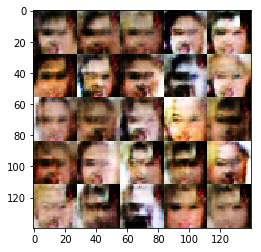

6501Epcho 1/1... Discriminator Loss: 1.2103... Generator Loss: 1.0946
6502Epcho 1/1... Discriminator Loss: 1.4002... Generator Loss: 0.4314
6503Epcho 1/1... Discriminator Loss: 1.3055... Generator Loss: 1.4384
6504Epcho 1/1... Discriminator Loss: 1.1732... Generator Loss: 0.5285
6505Epcho 1/1... Discriminator Loss: 1.1929... Generator Loss: 1.0505
6506Epcho 1/1... Discriminator Loss: 1.2530... Generator Loss: 0.7257
6507Epcho 1/1... Discriminator Loss: 1.2137... Generator Loss: 0.8260
6508Epcho 1/1... Discriminator Loss: 1.1958... Generator Loss: 0.6626
6509Epcho 1/1... Discriminator Loss: 1.1253... Generator Loss: 1.0364
6510Epcho 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.5441
6511Epcho 1/1... Discriminator Loss: 1.2129... Generator Loss: 1.0310
6512Epcho 1/1... Discriminator Loss: 1.1752... Generator Loss: 0.6971
6513Epcho 1/1... Discriminator Loss: 1.0216... Generator Loss: 1.0372
6514Epcho 1/1... Discriminator Loss: 1.1710... Generator Loss: 0.6236
6515Epcho 1/1... Dis

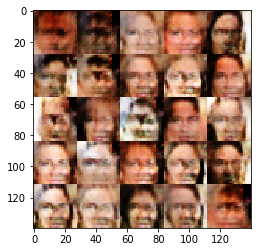

6601Epcho 1/1... Discriminator Loss: 1.1418... Generator Loss: 0.9412
6602Epcho 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.5985
6603Epcho 1/1... Discriminator Loss: 1.2642... Generator Loss: 0.7518
6604Epcho 1/1... Discriminator Loss: 1.2171... Generator Loss: 0.7541
6605Epcho 1/1... Discriminator Loss: 1.1742... Generator Loss: 0.8481
6606Epcho 1/1... Discriminator Loss: 1.4211... Generator Loss: 0.4673
6607Epcho 1/1... Discriminator Loss: 1.3342... Generator Loss: 1.4821
6608Epcho 1/1... Discriminator Loss: 1.6874... Generator Loss: 0.3126
6609Epcho 1/1... Discriminator Loss: 1.5543... Generator Loss: 1.4519
6610Epcho 1/1... Discriminator Loss: 1.3355... Generator Loss: 0.4428
6611Epcho 1/1... Discriminator Loss: 1.2070... Generator Loss: 1.2986
6612Epcho 1/1... Discriminator Loss: 1.4205... Generator Loss: 0.4077
6613Epcho 1/1... Discriminator Loss: 1.3672... Generator Loss: 1.2504
6614Epcho 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.5037
6615Epcho 1/1... Dis

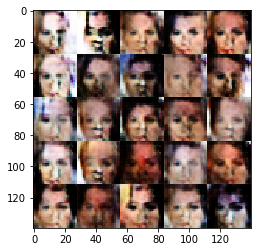

6701Epcho 1/1... Discriminator Loss: 1.2553... Generator Loss: 0.8118
6702Epcho 1/1... Discriminator Loss: 1.2342... Generator Loss: 0.7389
6703Epcho 1/1... Discriminator Loss: 1.2754... Generator Loss: 0.7623
6704Epcho 1/1... Discriminator Loss: 1.2591... Generator Loss: 0.6900
6705Epcho 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.8560
6706Epcho 1/1... Discriminator Loss: 1.1792... Generator Loss: 0.6836
6707Epcho 1/1... Discriminator Loss: 1.1530... Generator Loss: 1.0176
6708Epcho 1/1... Discriminator Loss: 1.2999... Generator Loss: 0.5289
6709Epcho 1/1... Discriminator Loss: 1.2349... Generator Loss: 1.0562
6710Epcho 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.5579
6711Epcho 1/1... Discriminator Loss: 1.1809... Generator Loss: 1.0602
6712Epcho 1/1... Discriminator Loss: 1.2486... Generator Loss: 0.5379
6713Epcho 1/1... Discriminator Loss: 1.2221... Generator Loss: 1.0461
6714Epcho 1/1... Discriminator Loss: 1.1729... Generator Loss: 0.5679
6715Epcho 1/1... Dis

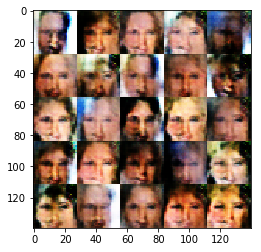

6801Epcho 1/1... Discriminator Loss: 1.5082... Generator Loss: 0.3678
6802Epcho 1/1... Discriminator Loss: 1.4138... Generator Loss: 1.0077
6803Epcho 1/1... Discriminator Loss: 1.2771... Generator Loss: 0.6878
6804Epcho 1/1... Discriminator Loss: 1.2269... Generator Loss: 0.8216
6805Epcho 1/1... Discriminator Loss: 1.2433... Generator Loss: 0.7308
6806Epcho 1/1... Discriminator Loss: 1.2432... Generator Loss: 0.7971
6807Epcho 1/1... Discriminator Loss: 1.1943... Generator Loss: 0.7469
6808Epcho 1/1... Discriminator Loss: 1.1663... Generator Loss: 1.0110
6809Epcho 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.4854
6810Epcho 1/1... Discriminator Loss: 1.3900... Generator Loss: 1.3568
6811Epcho 1/1... Discriminator Loss: 1.5024... Generator Loss: 0.3730
6812Epcho 1/1... Discriminator Loss: 1.2851... Generator Loss: 1.5036
6813Epcho 1/1... Discriminator Loss: 1.2503... Generator Loss: 0.5149
6814Epcho 1/1... Discriminator Loss: 1.2137... Generator Loss: 1.1910
6815Epcho 1/1... Dis

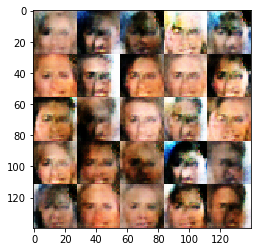

6901Epcho 1/1... Discriminator Loss: 1.1256... Generator Loss: 0.9291
6902Epcho 1/1... Discriminator Loss: 1.1781... Generator Loss: 0.6621
6903Epcho 1/1... Discriminator Loss: 1.1629... Generator Loss: 1.0325
6904Epcho 1/1... Discriminator Loss: 1.5099... Generator Loss: 0.4084
6905Epcho 1/1... Discriminator Loss: 1.2453... Generator Loss: 1.0821
6906Epcho 1/1... Discriminator Loss: 1.5325... Generator Loss: 0.3813
6907Epcho 1/1... Discriminator Loss: 1.5002... Generator Loss: 1.5000
6908Epcho 1/1... Discriminator Loss: 1.5196... Generator Loss: 0.3777
6909Epcho 1/1... Discriminator Loss: 1.3518... Generator Loss: 1.5018
6910Epcho 1/1... Discriminator Loss: 1.3551... Generator Loss: 0.4263
6911Epcho 1/1... Discriminator Loss: 1.2631... Generator Loss: 1.1981
6912Epcho 1/1... Discriminator Loss: 1.3297... Generator Loss: 0.4831
6913Epcho 1/1... Discriminator Loss: 1.4156... Generator Loss: 1.1367
6914Epcho 1/1... Discriminator Loss: 1.4616... Generator Loss: 0.4168
6915Epcho 1/1... Dis

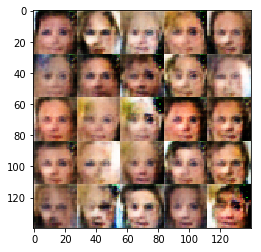

7001Epcho 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.6064
7002Epcho 1/1... Discriminator Loss: 1.2522... Generator Loss: 0.7729
7003Epcho 1/1... Discriminator Loss: 1.2471... Generator Loss: 0.8151
7004Epcho 1/1... Discriminator Loss: 1.0744... Generator Loss: 0.7927
7005Epcho 1/1... Discriminator Loss: 1.1063... Generator Loss: 0.9037
7006Epcho 1/1... Discriminator Loss: 1.2215... Generator Loss: 0.6314
7007Epcho 1/1... Discriminator Loss: 1.1746... Generator Loss: 0.9444
7008Epcho 1/1... Discriminator Loss: 1.4556... Generator Loss: 0.4635
7009Epcho 1/1... Discriminator Loss: 1.2816... Generator Loss: 0.8116
7010Epcho 1/1... Discriminator Loss: 1.4550... Generator Loss: 0.6331
7011Epcho 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.6719
7012Epcho 1/1... Discriminator Loss: 1.5040... Generator Loss: 0.5558
7013Epcho 1/1... Discriminator Loss: 1.1456... Generator Loss: 1.1313
7014Epcho 1/1... Discriminator Loss: 1.5003... Generator Loss: 0.3775
7015Epcho 1/1... Dis

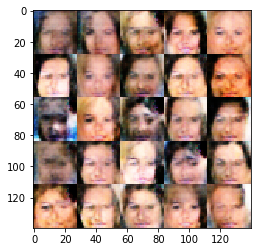

7101Epcho 1/1... Discriminator Loss: 1.0725... Generator Loss: 0.9118
7102Epcho 1/1... Discriminator Loss: 1.2199... Generator Loss: 0.7638
7103Epcho 1/1... Discriminator Loss: 1.2765... Generator Loss: 0.6378
7104Epcho 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.7907
7105Epcho 1/1... Discriminator Loss: 1.4747... Generator Loss: 0.5100
7106Epcho 1/1... Discriminator Loss: 1.2731... Generator Loss: 0.9722
7107Epcho 1/1... Discriminator Loss: 1.2045... Generator Loss: 0.7333
7108Epcho 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.9844
7109Epcho 1/1... Discriminator Loss: 1.0484... Generator Loss: 0.8161
7110Epcho 1/1... Discriminator Loss: 1.1728... Generator Loss: 0.7567
7111Epcho 1/1... Discriminator Loss: 1.2998... Generator Loss: 1.0484
7112Epcho 1/1... Discriminator Loss: 1.4979... Generator Loss: 0.3811
7113Epcho 1/1... Discriminator Loss: 1.4241... Generator Loss: 1.4999
7114Epcho 1/1... Discriminator Loss: 1.5030... Generator Loss: 0.3710
7115Epcho 1/1... Dis

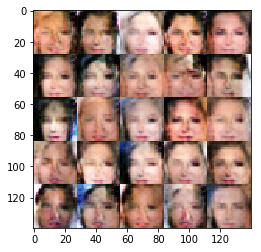

7201Epcho 1/1... Discriminator Loss: 1.1893... Generator Loss: 1.2048
7202Epcho 1/1... Discriminator Loss: 1.2915... Generator Loss: 0.5001
7203Epcho 1/1... Discriminator Loss: 1.3365... Generator Loss: 1.0311
7204Epcho 1/1... Discriminator Loss: 1.3764... Generator Loss: 0.5171
7205Epcho 1/1... Discriminator Loss: 1.3214... Generator Loss: 0.9029
7206Epcho 1/1... Discriminator Loss: 1.2931... Generator Loss: 0.5275
7207Epcho 1/1... Discriminator Loss: 1.3175... Generator Loss: 1.4028
7208Epcho 1/1... Discriminator Loss: 1.2855... Generator Loss: 0.5193
7209Epcho 1/1... Discriminator Loss: 1.2019... Generator Loss: 1.1919
7210Epcho 1/1... Discriminator Loss: 1.1967... Generator Loss: 0.6564
7211Epcho 1/1... Discriminator Loss: 1.2016... Generator Loss: 0.8183
7212Epcho 1/1... Discriminator Loss: 1.2179... Generator Loss: 0.6525
7213Epcho 1/1... Discriminator Loss: 1.0660... Generator Loss: 1.2237
7214Epcho 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.4329
7215Epcho 1/1... Dis

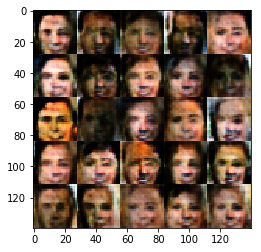

7301Epcho 1/1... Discriminator Loss: 1.0203... Generator Loss: 0.7419
7302Epcho 1/1... Discriminator Loss: 0.9697... Generator Loss: 1.0305
7303Epcho 1/1... Discriminator Loss: 0.9781... Generator Loss: 0.8853
7304Epcho 1/1... Discriminator Loss: 1.3016... Generator Loss: 0.9587
7305Epcho 1/1... Discriminator Loss: 1.3973... Generator Loss: 0.4675
7306Epcho 1/1... Discriminator Loss: 1.3368... Generator Loss: 1.6970
7307Epcho 1/1... Discriminator Loss: 1.7960... Generator Loss: 0.2350
7308Epcho 1/1... Discriminator Loss: 1.4592... Generator Loss: 1.3795
7309Epcho 1/1... Discriminator Loss: 1.2048... Generator Loss: 0.6475
7310Epcho 1/1... Discriminator Loss: 0.9822... Generator Loss: 1.2377
7311Epcho 1/1... Discriminator Loss: 1.1418... Generator Loss: 0.7840
7312Epcho 1/1... Discriminator Loss: 1.1973... Generator Loss: 0.7962
7313Epcho 1/1... Discriminator Loss: 1.3620... Generator Loss: 0.7335
7314Epcho 1/1... Discriminator Loss: 1.2609... Generator Loss: 0.5649
7315Epcho 1/1... Dis

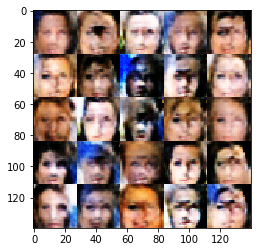

7401Epcho 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.4702
7402Epcho 1/1... Discriminator Loss: 1.2921... Generator Loss: 1.2428
7403Epcho 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.4763
7404Epcho 1/1... Discriminator Loss: 1.4494... Generator Loss: 1.0462
7405Epcho 1/1... Discriminator Loss: 1.3390... Generator Loss: 0.5645
7406Epcho 1/1... Discriminator Loss: 1.1661... Generator Loss: 0.7450
7407Epcho 1/1... Discriminator Loss: 1.2170... Generator Loss: 1.1261
7408Epcho 1/1... Discriminator Loss: 0.9588... Generator Loss: 0.9701
7409Epcho 1/1... Discriminator Loss: 0.9186... Generator Loss: 1.0551
7410Epcho 1/1... Discriminator Loss: 1.0749... Generator Loss: 0.8232
7411Epcho 1/1... Discriminator Loss: 0.8885... Generator Loss: 1.1049
7412Epcho 1/1... Discriminator Loss: 0.9803... Generator Loss: 0.8947
7413Epcho 1/1... Discriminator Loss: 1.0483... Generator Loss: 1.4554
7414Epcho 1/1... Discriminator Loss: 1.0465... Generator Loss: 0.6301
7415Epcho 1/1... Dis

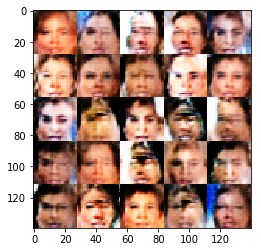

7501Epcho 1/1... Discriminator Loss: 1.1451... Generator Loss: 0.7333
7502Epcho 1/1... Discriminator Loss: 0.7842... Generator Loss: 2.2389
7503Epcho 1/1... Discriminator Loss: 1.5338... Generator Loss: 0.3966
7504Epcho 1/1... Discriminator Loss: 1.2444... Generator Loss: 1.7672
7505Epcho 1/1... Discriminator Loss: 1.3732... Generator Loss: 0.4781
7506Epcho 1/1... Discriminator Loss: 1.0378... Generator Loss: 2.6550
7507Epcho 1/1... Discriminator Loss: 0.6865... Generator Loss: 0.9871
7508Epcho 1/1... Discriminator Loss: 0.8571... Generator Loss: 0.9420
7509Epcho 1/1... Discriminator Loss: 0.9215... Generator Loss: 1.7809
7510Epcho 1/1... Discriminator Loss: 0.9049... Generator Loss: 0.7557
7511Epcho 1/1... Discriminator Loss: 0.6421... Generator Loss: 2.3232
7512Epcho 1/1... Discriminator Loss: 0.8686... Generator Loss: 0.9228
7513Epcho 1/1... Discriminator Loss: 0.8047... Generator Loss: 2.7093
7514Epcho 1/1... Discriminator Loss: 1.3062... Generator Loss: 0.4635
7515Epcho 1/1... Dis

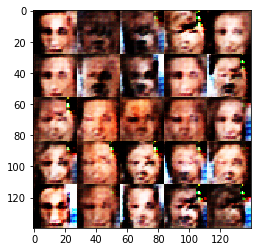

7601Epcho 1/1... Discriminator Loss: 1.9904... Generator Loss: 3.0943
7602Epcho 1/1... Discriminator Loss: 1.5966... Generator Loss: 0.3103
7603Epcho 1/1... Discriminator Loss: 1.3745... Generator Loss: 2.3237
7604Epcho 1/1... Discriminator Loss: 1.4874... Generator Loss: 0.4070
7605Epcho 1/1... Discriminator Loss: 1.1836... Generator Loss: 5.8388
7606Epcho 1/1... Discriminator Loss: 1.2345... Generator Loss: 0.6323
7607Epcho 1/1... Discriminator Loss: 1.4883... Generator Loss: 5.5460
7608Epcho 1/1... Discriminator Loss: 0.5061... Generator Loss: 1.2969
7609Epcho 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.6137
7610Epcho 1/1... Discriminator Loss: 1.1987... Generator Loss: 4.0716
7611Epcho 1/1... Discriminator Loss: 2.0578... Generator Loss: 0.2120
7612Epcho 1/1... Discriminator Loss: 1.6272... Generator Loss: 3.5219
7613Epcho 1/1... Discriminator Loss: 1.1243... Generator Loss: 0.5778
7614Epcho 1/1... Discriminator Loss: 1.0850... Generator Loss: 1.9581
7615Epcho 1/1... Dis

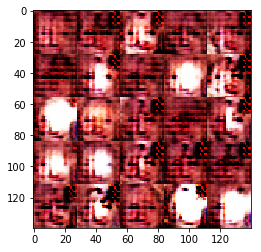

7701Epcho 1/1... Discriminator Loss: 0.1120... Generator Loss: 3.3402
7702Epcho 1/1... Discriminator Loss: 0.0853... Generator Loss: 5.2175
7703Epcho 1/1... Discriminator Loss: 0.1065... Generator Loss: 3.3709
7704Epcho 1/1... Discriminator Loss: 0.0682... Generator Loss: 3.6667
7705Epcho 1/1... Discriminator Loss: 0.2356... Generator Loss: 2.5932
7706Epcho 1/1... Discriminator Loss: 0.1512... Generator Loss: 3.0404
7707Epcho 1/1... Discriminator Loss: 0.6236... Generator Loss: 2.9338
7708Epcho 1/1... Discriminator Loss: 0.1576... Generator Loss: 2.5634
7709Epcho 1/1... Discriminator Loss: 0.5653... Generator Loss: 2.2132
7710Epcho 1/1... Discriminator Loss: 0.3024... Generator Loss: 2.3113
7711Epcho 1/1... Discriminator Loss: 1.0013... Generator Loss: 1.1466
7712Epcho 1/1... Discriminator Loss: 1.4705... Generator Loss: 3.7823
7713Epcho 1/1... Discriminator Loss: 0.3020... Generator Loss: 2.3643
7714Epcho 1/1... Discriminator Loss: 0.2337... Generator Loss: 2.7619
7715Epcho 1/1... Dis

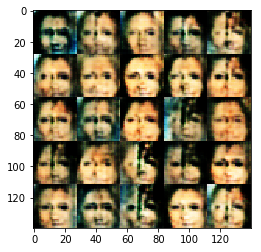

7801Epcho 1/1... Discriminator Loss: 0.2133... Generator Loss: 3.2495
7802Epcho 1/1... Discriminator Loss: 1.1981... Generator Loss: 0.6115
7803Epcho 1/1... Discriminator Loss: 1.3731... Generator Loss: 2.2047
7804Epcho 1/1... Discriminator Loss: 0.2871... Generator Loss: 3.5421
7805Epcho 1/1... Discriminator Loss: 0.3192... Generator Loss: 2.5354
7806Epcho 1/1... Discriminator Loss: 0.8233... Generator Loss: 0.9089
7807Epcho 1/1... Discriminator Loss: 2.1492... Generator Loss: 3.9208
7808Epcho 1/1... Discriminator Loss: 2.1278... Generator Loss: 0.2595
7809Epcho 1/1... Discriminator Loss: 3.3530... Generator Loss: 2.4725
7810Epcho 1/1... Discriminator Loss: 1.6169... Generator Loss: 0.3197
7811Epcho 1/1... Discriminator Loss: 1.5789... Generator Loss: 0.9439
7812Epcho 1/1... Discriminator Loss: 2.1515... Generator Loss: 0.9563
7813Epcho 1/1... Discriminator Loss: 1.3997... Generator Loss: 0.7785
7814Epcho 1/1... Discriminator Loss: 1.7352... Generator Loss: 0.3667
7815Epcho 1/1... Dis

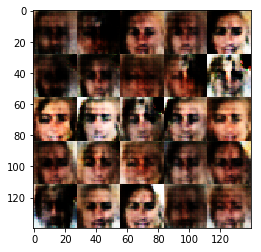

7901Epcho 1/1... Discriminator Loss: 1.3671... Generator Loss: 0.4283
7902Epcho 1/1... Discriminator Loss: 1.2826... Generator Loss: 1.6793
7903Epcho 1/1... Discriminator Loss: 1.3446... Generator Loss: 0.4786
7904Epcho 1/1... Discriminator Loss: 1.3091... Generator Loss: 1.4560
7905Epcho 1/1... Discriminator Loss: 1.2079... Generator Loss: 0.5433
7906Epcho 1/1... Discriminator Loss: 1.0821... Generator Loss: 1.1439
7907Epcho 1/1... Discriminator Loss: 1.2924... Generator Loss: 0.7087
7908Epcho 1/1... Discriminator Loss: 1.1562... Generator Loss: 0.9146
7909Epcho 1/1... Discriminator Loss: 1.1345... Generator Loss: 0.9183
7910Epcho 1/1... Discriminator Loss: 1.1504... Generator Loss: 0.7769
7911Epcho 1/1... Discriminator Loss: 1.4555... Generator Loss: 1.4158
7912Epcho 1/1... Discriminator Loss: 1.5071... Generator Loss: 0.7985
7913Epcho 1/1... Discriminator Loss: 1.1504... Generator Loss: 0.9380
7914Epcho 1/1... Discriminator Loss: 1.1799... Generator Loss: 0.8914
7915Epcho 1/1... Dis

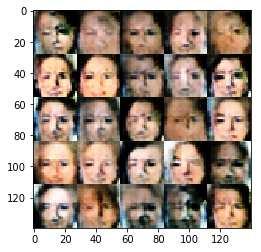

8001Epcho 1/1... Discriminator Loss: 0.5716... Generator Loss: 1.9556
8002Epcho 1/1... Discriminator Loss: 0.8436... Generator Loss: 1.1315
8003Epcho 1/1... Discriminator Loss: 1.1449... Generator Loss: 1.2189
8004Epcho 1/1... Discriminator Loss: 0.8124... Generator Loss: 0.9104
8005Epcho 1/1... Discriminator Loss: 0.7750... Generator Loss: 1.8682
8006Epcho 1/1... Discriminator Loss: 1.0330... Generator Loss: 0.6701
8007Epcho 1/1... Discriminator Loss: 0.8158... Generator Loss: 2.9323
8008Epcho 1/1... Discriminator Loss: 1.0665... Generator Loss: 0.6855
8009Epcho 1/1... Discriminator Loss: 0.8219... Generator Loss: 2.1270
8010Epcho 1/1... Discriminator Loss: 1.1733... Generator Loss: 0.5517
8011Epcho 1/1... Discriminator Loss: 0.8179... Generator Loss: 2.0246
8012Epcho 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.3868
8013Epcho 1/1... Discriminator Loss: 1.3523... Generator Loss: 1.8467
8014Epcho 1/1... Discriminator Loss: 0.8335... Generator Loss: 0.8900
8015Epcho 1/1... Dis

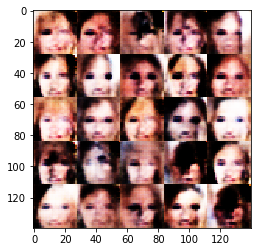

8101Epcho 1/1... Discriminator Loss: 0.6175... Generator Loss: 3.9278
8102Epcho 1/1... Discriminator Loss: 0.4199... Generator Loss: 1.5073
8103Epcho 1/1... Discriminator Loss: 0.6394... Generator Loss: 2.8562
8104Epcho 1/1... Discriminator Loss: 1.0272... Generator Loss: 0.9552
8105Epcho 1/1... Discriminator Loss: 0.5946... Generator Loss: 3.2359
8106Epcho 1/1... Discriminator Loss: 1.1135... Generator Loss: 0.6172
8107Epcho 1/1... Discriminator Loss: 0.5540... Generator Loss: 6.3797
8108Epcho 1/1... Discriminator Loss: 0.3672... Generator Loss: 1.7093
8109Epcho 1/1... Discriminator Loss: 0.3018... Generator Loss: 2.0898
8110Epcho 1/1... Discriminator Loss: 0.4978... Generator Loss: 2.0594
8111Epcho 1/1... Discriminator Loss: 0.2710... Generator Loss: 3.5028
8112Epcho 1/1... Discriminator Loss: 0.2777... Generator Loss: 2.3405
8113Epcho 1/1... Discriminator Loss: 0.3502... Generator Loss: 2.1272
8114Epcho 1/1... Discriminator Loss: 0.3517... Generator Loss: 2.7867
8115Epcho 1/1... Dis

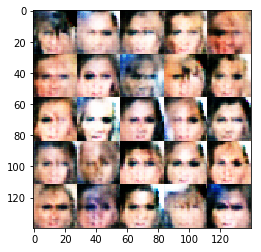

8201Epcho 1/1... Discriminator Loss: 1.3405... Generator Loss: 1.2461
8202Epcho 1/1... Discriminator Loss: 1.8557... Generator Loss: 2.9168
8203Epcho 1/1... Discriminator Loss: 1.8666... Generator Loss: 0.3511
8204Epcho 1/1... Discriminator Loss: 2.7602... Generator Loss: 3.0427
8205Epcho 1/1... Discriminator Loss: 2.3013... Generator Loss: 0.1865
8206Epcho 1/1... Discriminator Loss: 1.0268... Generator Loss: 2.9341
8207Epcho 1/1... Discriminator Loss: 0.9485... Generator Loss: 1.0118
8208Epcho 1/1... Discriminator Loss: 1.1205... Generator Loss: 0.9199
8209Epcho 1/1... Discriminator Loss: 1.2461... Generator Loss: 0.7501
8210Epcho 1/1... Discriminator Loss: 1.2278... Generator Loss: 0.9632
8211Epcho 1/1... Discriminator Loss: 0.7167... Generator Loss: 1.7468
8212Epcho 1/1... Discriminator Loss: 0.7812... Generator Loss: 1.0434
8213Epcho 1/1... Discriminator Loss: 0.5045... Generator Loss: 3.6895
8214Epcho 1/1... Discriminator Loss: 0.4969... Generator Loss: 1.3531
8215Epcho 1/1... Dis

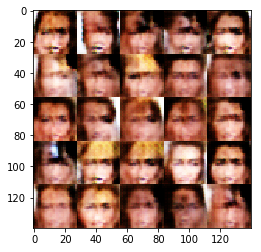

8301Epcho 1/1... Discriminator Loss: 1.0441... Generator Loss: 1.2945
8302Epcho 1/1... Discriminator Loss: 0.5760... Generator Loss: 1.8282
8303Epcho 1/1... Discriminator Loss: 0.6083... Generator Loss: 1.2796
8304Epcho 1/1... Discriminator Loss: 0.4598... Generator Loss: 3.1937
8305Epcho 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.4928
8306Epcho 1/1... Discriminator Loss: 1.6296... Generator Loss: 5.3239
8307Epcho 1/1... Discriminator Loss: 1.5917... Generator Loss: 0.3631
8308Epcho 1/1... Discriminator Loss: 0.9820... Generator Loss: 2.3069
8309Epcho 1/1... Discriminator Loss: 0.5633... Generator Loss: 1.3424
8310Epcho 1/1... Discriminator Loss: 0.4188... Generator Loss: 2.2893
8311Epcho 1/1... Discriminator Loss: 0.3603... Generator Loss: 2.1632
8312Epcho 1/1... Discriminator Loss: 0.4567... Generator Loss: 1.5823
8313Epcho 1/1... Discriminator Loss: 0.6340... Generator Loss: 1.9008
8314Epcho 1/1... Discriminator Loss: 2.1797... Generator Loss: 0.1902
8315Epcho 1/1... Dis

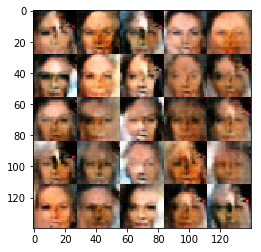

8401Epcho 1/1... Discriminator Loss: 1.0705... Generator Loss: 0.8689
8402Epcho 1/1... Discriminator Loss: 0.9630... Generator Loss: 1.1466
8403Epcho 1/1... Discriminator Loss: 1.2183... Generator Loss: 0.6801
8404Epcho 1/1... Discriminator Loss: 1.3128... Generator Loss: 0.9154
8405Epcho 1/1... Discriminator Loss: 1.1922... Generator Loss: 0.6920
8406Epcho 1/1... Discriminator Loss: 1.2646... Generator Loss: 1.3980
8407Epcho 1/1... Discriminator Loss: 1.6691... Generator Loss: 0.3910
8408Epcho 1/1... Discriminator Loss: 1.3018... Generator Loss: 1.0903
8409Epcho 1/1... Discriminator Loss: 1.0402... Generator Loss: 1.0245
8410Epcho 1/1... Discriminator Loss: 1.1570... Generator Loss: 0.6040
8411Epcho 1/1... Discriminator Loss: 1.4278... Generator Loss: 1.0745
8412Epcho 1/1... Discriminator Loss: 1.3757... Generator Loss: 0.4997
8413Epcho 1/1... Discriminator Loss: 1.2770... Generator Loss: 1.0638
8414Epcho 1/1... Discriminator Loss: 1.1255... Generator Loss: 0.7670
8415Epcho 1/1... Dis

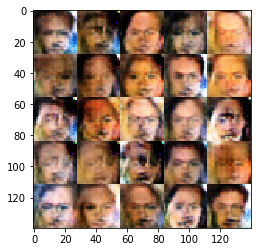

8501Epcho 1/1... Discriminator Loss: 1.1890... Generator Loss: 1.0984
8502Epcho 1/1... Discriminator Loss: 1.2346... Generator Loss: 0.5406
8503Epcho 1/1... Discriminator Loss: 1.1929... Generator Loss: 1.1325
8504Epcho 1/1... Discriminator Loss: 1.1782... Generator Loss: 0.6741
8505Epcho 1/1... Discriminator Loss: 1.2013... Generator Loss: 1.2022
8506Epcho 1/1... Discriminator Loss: 1.2925... Generator Loss: 0.6029
8507Epcho 1/1... Discriminator Loss: 1.1573... Generator Loss: 0.7536
8508Epcho 1/1... Discriminator Loss: 1.2094... Generator Loss: 0.8031
8509Epcho 1/1... Discriminator Loss: 1.3441... Generator Loss: 0.7475
8510Epcho 1/1... Discriminator Loss: 1.2512... Generator Loss: 0.8466
8511Epcho 1/1... Discriminator Loss: 1.3176... Generator Loss: 0.5141
8512Epcho 1/1... Discriminator Loss: 1.4133... Generator Loss: 1.2713
8513Epcho 1/1... Discriminator Loss: 1.5184... Generator Loss: 0.3913
8514Epcho 1/1... Discriminator Loss: 1.2278... Generator Loss: 1.3127
8515Epcho 1/1... Dis

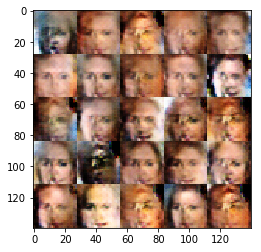

8601Epcho 1/1... Discriminator Loss: 1.1400... Generator Loss: 0.8814
8602Epcho 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.6573
8603Epcho 1/1... Discriminator Loss: 1.2762... Generator Loss: 0.6859
8604Epcho 1/1... Discriminator Loss: 1.1881... Generator Loss: 0.9784
8605Epcho 1/1... Discriminator Loss: 1.1861... Generator Loss: 0.7087
8606Epcho 1/1... Discriminator Loss: 1.2613... Generator Loss: 0.8159
8607Epcho 1/1... Discriminator Loss: 1.2918... Generator Loss: 0.6102
8608Epcho 1/1... Discriminator Loss: 1.1720... Generator Loss: 0.8945
8609Epcho 1/1... Discriminator Loss: 1.1373... Generator Loss: 0.8040
8610Epcho 1/1... Discriminator Loss: 1.1589... Generator Loss: 0.7581
8611Epcho 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.6739
8612Epcho 1/1... Discriminator Loss: 1.1879... Generator Loss: 0.8371
8613Epcho 1/1... Discriminator Loss: 1.1399... Generator Loss: 0.8256
8614Epcho 1/1... Discriminator Loss: 1.2740... Generator Loss: 0.8897
8615Epcho 1/1... Dis

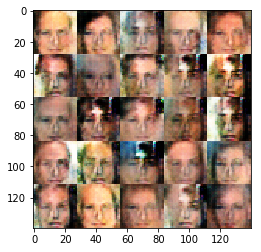

8701Epcho 1/1... Discriminator Loss: 1.3964... Generator Loss: 0.8614
8702Epcho 1/1... Discriminator Loss: 1.3676... Generator Loss: 0.6126
8703Epcho 1/1... Discriminator Loss: 1.3392... Generator Loss: 0.6715
8704Epcho 1/1... Discriminator Loss: 1.3139... Generator Loss: 1.1091
8705Epcho 1/1... Discriminator Loss: 1.4152... Generator Loss: 0.4173
8706Epcho 1/1... Discriminator Loss: 1.3319... Generator Loss: 1.1880
8707Epcho 1/1... Discriminator Loss: 1.1739... Generator Loss: 0.6571
8708Epcho 1/1... Discriminator Loss: 1.2133... Generator Loss: 0.8633
8709Epcho 1/1... Discriminator Loss: 1.1169... Generator Loss: 0.8665
8710Epcho 1/1... Discriminator Loss: 1.2042... Generator Loss: 0.7338
8711Epcho 1/1... Discriminator Loss: 1.2726... Generator Loss: 0.9645
8712Epcho 1/1... Discriminator Loss: 1.3526... Generator Loss: 0.4178
8713Epcho 1/1... Discriminator Loss: 1.3093... Generator Loss: 1.1869
8714Epcho 1/1... Discriminator Loss: 1.1739... Generator Loss: 0.6723
8715Epcho 1/1... Dis

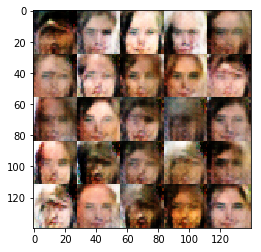

8801Epcho 1/1... Discriminator Loss: 1.2192... Generator Loss: 0.6924
8802Epcho 1/1... Discriminator Loss: 1.2071... Generator Loss: 1.0272
8803Epcho 1/1... Discriminator Loss: 1.3148... Generator Loss: 0.5574
8804Epcho 1/1... Discriminator Loss: 1.2853... Generator Loss: 1.0058
8805Epcho 1/1... Discriminator Loss: 1.2609... Generator Loss: 0.7603
8806Epcho 1/1... Discriminator Loss: 1.2136... Generator Loss: 0.6616
8807Epcho 1/1... Discriminator Loss: 1.1246... Generator Loss: 1.0922
8808Epcho 1/1... Discriminator Loss: 1.1827... Generator Loss: 0.5915
8809Epcho 1/1... Discriminator Loss: 1.1562... Generator Loss: 1.2735
8810Epcho 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.4269
8811Epcho 1/1... Discriminator Loss: 1.2747... Generator Loss: 1.1260
8812Epcho 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.5724
8813Epcho 1/1... Discriminator Loss: 1.1873... Generator Loss: 0.9848
8814Epcho 1/1... Discriminator Loss: 1.3347... Generator Loss: 0.5350
8815Epcho 1/1... Dis

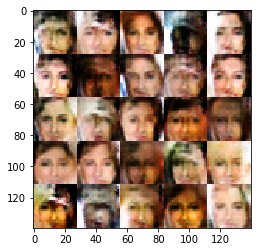

8901Epcho 1/1... Discriminator Loss: 1.2815... Generator Loss: 0.7646
8902Epcho 1/1... Discriminator Loss: 1.2418... Generator Loss: 0.6615
8903Epcho 1/1... Discriminator Loss: 1.2563... Generator Loss: 1.0661
8904Epcho 1/1... Discriminator Loss: 1.4838... Generator Loss: 0.3803
8905Epcho 1/1... Discriminator Loss: 1.4998... Generator Loss: 1.3212
8906Epcho 1/1... Discriminator Loss: 1.1405... Generator Loss: 0.6934
8907Epcho 1/1... Discriminator Loss: 1.2140... Generator Loss: 0.8929
8908Epcho 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.5955
8909Epcho 1/1... Discriminator Loss: 1.2672... Generator Loss: 1.1481
8910Epcho 1/1... Discriminator Loss: 1.4448... Generator Loss: 0.4270
8911Epcho 1/1... Discriminator Loss: 1.3768... Generator Loss: 1.3468
8912Epcho 1/1... Discriminator Loss: 1.5100... Generator Loss: 0.4568
8913Epcho 1/1... Discriminator Loss: 1.2179... Generator Loss: 1.1257
8914Epcho 1/1... Discriminator Loss: 1.3733... Generator Loss: 0.4659
8915Epcho 1/1... Dis

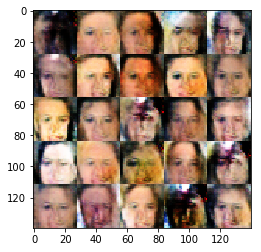

9001Epcho 1/1... Discriminator Loss: 1.2123... Generator Loss: 1.0411
9002Epcho 1/1... Discriminator Loss: 1.4423... Generator Loss: 0.4542
9003Epcho 1/1... Discriminator Loss: 1.3412... Generator Loss: 1.2521
9004Epcho 1/1... Discriminator Loss: 1.4619... Generator Loss: 0.4647
9005Epcho 1/1... Discriminator Loss: 1.3252... Generator Loss: 0.9306
9006Epcho 1/1... Discriminator Loss: 1.1942... Generator Loss: 0.7732
9007Epcho 1/1... Discriminator Loss: 1.2452... Generator Loss: 0.6580
9008Epcho 1/1... Discriminator Loss: 1.3383... Generator Loss: 0.7544
9009Epcho 1/1... Discriminator Loss: 1.2977... Generator Loss: 0.6615
9010Epcho 1/1... Discriminator Loss: 1.2450... Generator Loss: 0.8908
9011Epcho 1/1... Discriminator Loss: 1.2796... Generator Loss: 0.5972
9012Epcho 1/1... Discriminator Loss: 1.3125... Generator Loss: 0.9723
9013Epcho 1/1... Discriminator Loss: 1.1642... Generator Loss: 0.6855
9014Epcho 1/1... Discriminator Loss: 1.1872... Generator Loss: 0.7678
9015Epcho 1/1... Dis

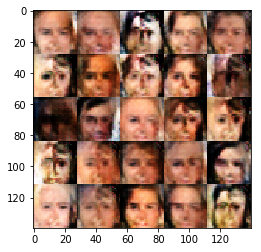

9101Epcho 1/1... Discriminator Loss: 1.4467... Generator Loss: 0.4892
9102Epcho 1/1... Discriminator Loss: 1.2429... Generator Loss: 0.8721
9103Epcho 1/1... Discriminator Loss: 1.3245... Generator Loss: 0.6066
9104Epcho 1/1... Discriminator Loss: 1.3319... Generator Loss: 0.8494
9105Epcho 1/1... Discriminator Loss: 1.2924... Generator Loss: 0.6537
9106Epcho 1/1... Discriminator Loss: 1.2851... Generator Loss: 0.7220
9107Epcho 1/1... Discriminator Loss: 1.1827... Generator Loss: 0.9242
9108Epcho 1/1... Discriminator Loss: 1.2086... Generator Loss: 0.6782
9109Epcho 1/1... Discriminator Loss: 1.2614... Generator Loss: 0.8637
9110Epcho 1/1... Discriminator Loss: 1.2163... Generator Loss: 0.6126
9111Epcho 1/1... Discriminator Loss: 1.1470... Generator Loss: 1.0303
9112Epcho 1/1... Discriminator Loss: 1.4295... Generator Loss: 0.4159
9113Epcho 1/1... Discriminator Loss: 1.4679... Generator Loss: 1.3962
9114Epcho 1/1... Discriminator Loss: 1.4075... Generator Loss: 0.4545
9115Epcho 1/1... Dis

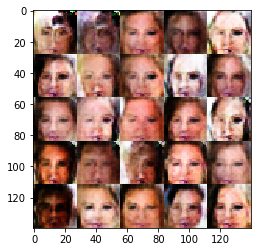

9201Epcho 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.6613
9202Epcho 1/1... Discriminator Loss: 1.3028... Generator Loss: 0.6574
9203Epcho 1/1... Discriminator Loss: 1.2160... Generator Loss: 1.0740
9204Epcho 1/1... Discriminator Loss: 1.4590... Generator Loss: 0.4514
9205Epcho 1/1... Discriminator Loss: 1.4229... Generator Loss: 1.1003
9206Epcho 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.5382
9207Epcho 1/1... Discriminator Loss: 1.1992... Generator Loss: 1.0124
9208Epcho 1/1... Discriminator Loss: 1.4264... Generator Loss: 0.4511
9209Epcho 1/1... Discriminator Loss: 1.4223... Generator Loss: 1.1602
9210Epcho 1/1... Discriminator Loss: 1.3594... Generator Loss: 0.4471
9211Epcho 1/1... Discriminator Loss: 1.3815... Generator Loss: 1.0973
9212Epcho 1/1... Discriminator Loss: 1.3483... Generator Loss: 0.5084
9213Epcho 1/1... Discriminator Loss: 1.6252... Generator Loss: 0.8306
9214Epcho 1/1... Discriminator Loss: 1.4737... Generator Loss: 0.4649
9215Epcho 1/1... Dis

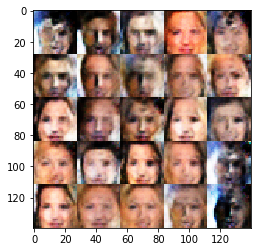

9301Epcho 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.6862
9302Epcho 1/1... Discriminator Loss: 1.2610... Generator Loss: 0.6726
9303Epcho 1/1... Discriminator Loss: 1.3267... Generator Loss: 0.9123
9304Epcho 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.5298
9305Epcho 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.9421
9306Epcho 1/1... Discriminator Loss: 1.1739... Generator Loss: 0.6866
9307Epcho 1/1... Discriminator Loss: 1.4528... Generator Loss: 0.6590
9308Epcho 1/1... Discriminator Loss: 1.1834... Generator Loss: 0.7860
9309Epcho 1/1... Discriminator Loss: 1.2481... Generator Loss: 0.8538
9310Epcho 1/1... Discriminator Loss: 1.3548... Generator Loss: 0.4968
9311Epcho 1/1... Discriminator Loss: 1.4625... Generator Loss: 1.0224
9312Epcho 1/1... Discriminator Loss: 1.4607... Generator Loss: 0.4236
9313Epcho 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.9669
9314Epcho 1/1... Discriminator Loss: 1.5409... Generator Loss: 0.3732
9315Epcho 1/1... Dis

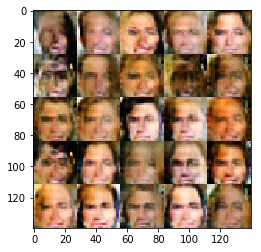

9401Epcho 1/1... Discriminator Loss: 1.3974... Generator Loss: 0.4444
9402Epcho 1/1... Discriminator Loss: 1.3759... Generator Loss: 1.1846
9403Epcho 1/1... Discriminator Loss: 1.5044... Generator Loss: 0.3927
9404Epcho 1/1... Discriminator Loss: 1.4177... Generator Loss: 1.0596
9405Epcho 1/1... Discriminator Loss: 1.3223... Generator Loss: 0.6355
9406Epcho 1/1... Discriminator Loss: 1.4260... Generator Loss: 0.5133
9407Epcho 1/1... Discriminator Loss: 1.2248... Generator Loss: 1.1027
9408Epcho 1/1... Discriminator Loss: 1.3631... Generator Loss: 0.5657
9409Epcho 1/1... Discriminator Loss: 1.2597... Generator Loss: 1.0348
9410Epcho 1/1... Discriminator Loss: 1.1298... Generator Loss: 0.7711
9411Epcho 1/1... Discriminator Loss: 1.2524... Generator Loss: 0.6770
9412Epcho 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.8038
9413Epcho 1/1... Discriminator Loss: 1.2133... Generator Loss: 0.6630
9414Epcho 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.8559
9415Epcho 1/1... Dis

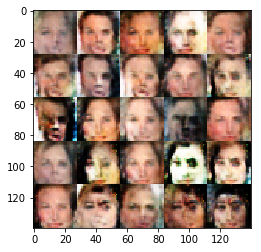

9501Epcho 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.8360
9502Epcho 1/1... Discriminator Loss: 1.1826... Generator Loss: 0.7050
9503Epcho 1/1... Discriminator Loss: 1.2682... Generator Loss: 0.6986
9504Epcho 1/1... Discriminator Loss: 1.4908... Generator Loss: 0.8440
9505Epcho 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.5162
9506Epcho 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.9199
9507Epcho 1/1... Discriminator Loss: 1.3253... Generator Loss: 0.5787
9508Epcho 1/1... Discriminator Loss: 1.3688... Generator Loss: 0.9299
9509Epcho 1/1... Discriminator Loss: 1.3617... Generator Loss: 0.4995
9510Epcho 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.9835
9511Epcho 1/1... Discriminator Loss: 1.3371... Generator Loss: 0.4928
9512Epcho 1/1... Discriminator Loss: 1.3710... Generator Loss: 1.0152
9513Epcho 1/1... Discriminator Loss: 1.2587... Generator Loss: 0.5918
9514Epcho 1/1... Discriminator Loss: 1.3289... Generator Loss: 0.7306
9515Epcho 1/1... Dis

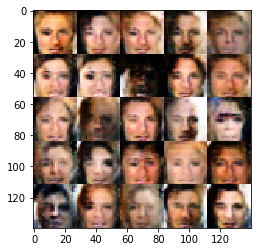

9601Epcho 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.4381
9602Epcho 1/1... Discriminator Loss: 1.3281... Generator Loss: 0.9353
9603Epcho 1/1... Discriminator Loss: 1.4424... Generator Loss: 0.4725
9604Epcho 1/1... Discriminator Loss: 1.3697... Generator Loss: 1.0291
9605Epcho 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.5450
9606Epcho 1/1... Discriminator Loss: 1.2613... Generator Loss: 0.9591
9607Epcho 1/1... Discriminator Loss: 1.3457... Generator Loss: 0.5397
9608Epcho 1/1... Discriminator Loss: 1.3202... Generator Loss: 0.8387
9609Epcho 1/1... Discriminator Loss: 1.3476... Generator Loss: 0.7152
9610Epcho 1/1... Discriminator Loss: 1.2113... Generator Loss: 0.7284
9611Epcho 1/1... Discriminator Loss: 1.2403... Generator Loss: 0.7695
9612Epcho 1/1... Discriminator Loss: 1.3431... Generator Loss: 0.6207
9613Epcho 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.7046
9614Epcho 1/1... Discriminator Loss: 1.4443... Generator Loss: 0.7030
9615Epcho 1/1... Dis

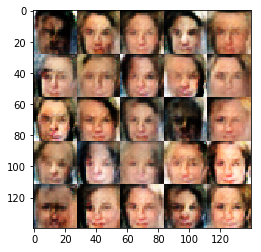

9701Epcho 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.6608
9702Epcho 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.8950
9703Epcho 1/1... Discriminator Loss: 1.3396... Generator Loss: 0.5118
9704Epcho 1/1... Discriminator Loss: 1.3583... Generator Loss: 0.9242
9705Epcho 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.6292
9706Epcho 1/1... Discriminator Loss: 1.1700... Generator Loss: 0.8144
9707Epcho 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.7404
9708Epcho 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.6921
9709Epcho 1/1... Discriminator Loss: 1.2623... Generator Loss: 0.7175
9710Epcho 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.7016
9711Epcho 1/1... Discriminator Loss: 1.1984... Generator Loss: 1.0712
9712Epcho 1/1... Discriminator Loss: 1.3149... Generator Loss: 0.5425
9713Epcho 1/1... Discriminator Loss: 1.3680... Generator Loss: 0.7594
9714Epcho 1/1... Discriminator Loss: 1.2774... Generator Loss: 0.7512
9715Epcho 1/1... Dis

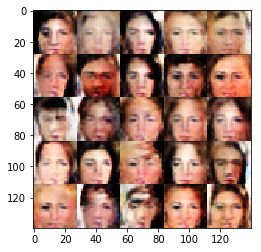

9801Epcho 1/1... Discriminator Loss: 1.2809... Generator Loss: 0.7758
9802Epcho 1/1... Discriminator Loss: 1.2583... Generator Loss: 0.6847
9803Epcho 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.7447
9804Epcho 1/1... Discriminator Loss: 1.2461... Generator Loss: 0.7273
9805Epcho 1/1... Discriminator Loss: 1.2581... Generator Loss: 0.8737
9806Epcho 1/1... Discriminator Loss: 1.1946... Generator Loss: 0.6545
9807Epcho 1/1... Discriminator Loss: 1.2629... Generator Loss: 0.8125
9808Epcho 1/1... Discriminator Loss: 1.2257... Generator Loss: 0.8126
9809Epcho 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.4697
9810Epcho 1/1... Discriminator Loss: 1.3529... Generator Loss: 1.1875
9811Epcho 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.4580
9812Epcho 1/1... Discriminator Loss: 1.3024... Generator Loss: 1.1046
9813Epcho 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.5200
9814Epcho 1/1... Discriminator Loss: 1.3680... Generator Loss: 1.0791
9815Epcho 1/1... Dis

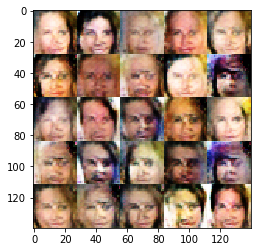

9901Epcho 1/1... Discriminator Loss: 1.3833... Generator Loss: 1.0264
9902Epcho 1/1... Discriminator Loss: 1.4266... Generator Loss: 0.6057
9903Epcho 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.7656
9904Epcho 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.6768
9905Epcho 1/1... Discriminator Loss: 1.3443... Generator Loss: 0.7682
9906Epcho 1/1... Discriminator Loss: 1.3686... Generator Loss: 0.5130
9907Epcho 1/1... Discriminator Loss: 1.3554... Generator Loss: 1.0864
9908Epcho 1/1... Discriminator Loss: 1.4343... Generator Loss: 0.4244
9909Epcho 1/1... Discriminator Loss: 1.3139... Generator Loss: 0.8466
9910Epcho 1/1... Discriminator Loss: 1.3178... Generator Loss: 0.5842
9911Epcho 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.8747
9912Epcho 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.6116
9913Epcho 1/1... Discriminator Loss: 1.3351... Generator Loss: 1.1017
9914Epcho 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.4366
9915Epcho 1/1... Dis

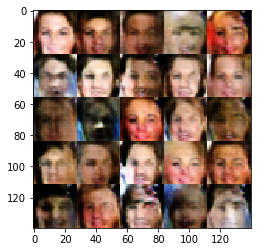

10001Epcho 1/1... Discriminator Loss: 1.2142... Generator Loss: 0.6893
10002Epcho 1/1... Discriminator Loss: 1.1887... Generator Loss: 1.1883
10003Epcho 1/1... Discriminator Loss: 1.5113... Generator Loss: 0.4067
10004Epcho 1/1... Discriminator Loss: 1.2248... Generator Loss: 1.5488
10005Epcho 1/1... Discriminator Loss: 1.5040... Generator Loss: 0.3708
10006Epcho 1/1... Discriminator Loss: 1.1748... Generator Loss: 1.4819
10007Epcho 1/1... Discriminator Loss: 1.4650... Generator Loss: 0.3607
10008Epcho 1/1... Discriminator Loss: 1.5087... Generator Loss: 1.1976
10009Epcho 1/1... Discriminator Loss: 1.4435... Generator Loss: 0.4030
10010Epcho 1/1... Discriminator Loss: 1.5196... Generator Loss: 1.1458
10011Epcho 1/1... Discriminator Loss: 1.3179... Generator Loss: 0.5341
10012Epcho 1/1... Discriminator Loss: 1.2753... Generator Loss: 0.8348
10013Epcho 1/1... Discriminator Loss: 1.2864... Generator Loss: 0.7262
10014Epcho 1/1... Discriminator Loss: 1.1566... Generator Loss: 0.7846
10015E

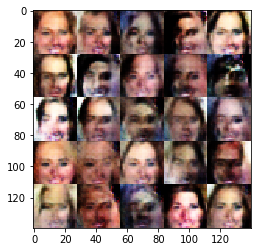

10101Epcho 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.9720
10102Epcho 1/1... Discriminator Loss: 1.3478... Generator Loss: 0.4988
10103Epcho 1/1... Discriminator Loss: 1.2204... Generator Loss: 1.1149
10104Epcho 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.4959
10105Epcho 1/1... Discriminator Loss: 1.2313... Generator Loss: 1.0213
10106Epcho 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.5629
10107Epcho 1/1... Discriminator Loss: 1.2979... Generator Loss: 1.0160
10108Epcho 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.5107
10109Epcho 1/1... Discriminator Loss: 1.1558... Generator Loss: 1.1104
10110Epcho 1/1... Discriminator Loss: 1.3437... Generator Loss: 0.4933
10111Epcho 1/1... Discriminator Loss: 1.2484... Generator Loss: 0.8521
10112Epcho 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.8030
10113Epcho 1/1... Discriminator Loss: 1.4711... Generator Loss: 0.4971
10114Epcho 1/1... Discriminator Loss: 1.2824... Generator Loss: 1.0258
10115E

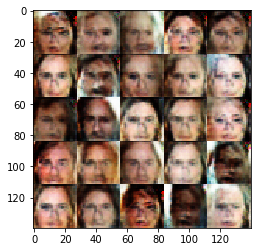

10201Epcho 1/1... Discriminator Loss: 1.2944... Generator Loss: 0.5818
10202Epcho 1/1... Discriminator Loss: 1.2296... Generator Loss: 0.8979
10203Epcho 1/1... Discriminator Loss: 1.2407... Generator Loss: 0.5937
10204Epcho 1/1... Discriminator Loss: 1.2319... Generator Loss: 1.0961
10205Epcho 1/1... Discriminator Loss: 1.2545... Generator Loss: 0.5466
10206Epcho 1/1... Discriminator Loss: 1.1293... Generator Loss: 0.9631
10207Epcho 1/1... Discriminator Loss: 1.0937... Generator Loss: 0.9373
10208Epcho 1/1... Discriminator Loss: 1.0434... Generator Loss: 0.8210
10209Epcho 1/1... Discriminator Loss: 1.0240... Generator Loss: 0.9892
10210Epcho 1/1... Discriminator Loss: 1.0120... Generator Loss: 0.8545
10211Epcho 1/1... Discriminator Loss: 1.1725... Generator Loss: 0.7479
10212Epcho 1/1... Discriminator Loss: 1.1326... Generator Loss: 1.2062
10213Epcho 1/1... Discriminator Loss: 1.2979... Generator Loss: 0.5521
10214Epcho 1/1... Discriminator Loss: 1.3052... Generator Loss: 1.4345
10215E

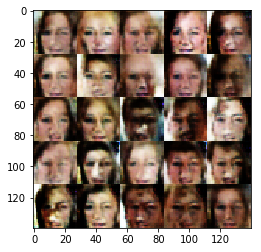

10301Epcho 1/1... Discriminator Loss: 0.9620... Generator Loss: 0.8442
10302Epcho 1/1... Discriminator Loss: 0.8789... Generator Loss: 1.4791
10303Epcho 1/1... Discriminator Loss: 1.2960... Generator Loss: 0.4555
10304Epcho 1/1... Discriminator Loss: 0.8788... Generator Loss: 1.2068
10305Epcho 1/1... Discriminator Loss: 0.9150... Generator Loss: 1.2693
10306Epcho 1/1... Discriminator Loss: 0.9584... Generator Loss: 0.8287
10307Epcho 1/1... Discriminator Loss: 0.8634... Generator Loss: 1.2232
10308Epcho 1/1... Discriminator Loss: 1.0990... Generator Loss: 0.8531
10309Epcho 1/1... Discriminator Loss: 0.9057... Generator Loss: 1.8838
10310Epcho 1/1... Discriminator Loss: 1.2313... Generator Loss: 0.4552
10311Epcho 1/1... Discriminator Loss: 1.3252... Generator Loss: 1.5845
10312Epcho 1/1... Discriminator Loss: 1.7856... Generator Loss: 0.2317
10313Epcho 1/1... Discriminator Loss: 1.6712... Generator Loss: 1.7590
10314Epcho 1/1... Discriminator Loss: 1.4847... Generator Loss: 0.4034
10315E

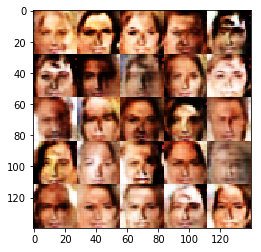

10401Epcho 1/1... Discriminator Loss: 0.9825... Generator Loss: 0.7469
10402Epcho 1/1... Discriminator Loss: 0.7976... Generator Loss: 1.6204
10403Epcho 1/1... Discriminator Loss: 0.7657... Generator Loss: 1.2245
10404Epcho 1/1... Discriminator Loss: 0.8225... Generator Loss: 1.2642
10405Epcho 1/1... Discriminator Loss: 1.0945... Generator Loss: 0.8805
10406Epcho 1/1... Discriminator Loss: 0.9113... Generator Loss: 1.1531
10407Epcho 1/1... Discriminator Loss: 1.0545... Generator Loss: 0.9450
10408Epcho 1/1... Discriminator Loss: 1.0568... Generator Loss: 0.8850
10409Epcho 1/1... Discriminator Loss: 0.9701... Generator Loss: 1.3065
10410Epcho 1/1... Discriminator Loss: 0.6238... Generator Loss: 2.1645
10411Epcho 1/1... Discriminator Loss: 0.9565... Generator Loss: 0.7069
10412Epcho 1/1... Discriminator Loss: 0.5895... Generator Loss: 2.2569
10413Epcho 1/1... Discriminator Loss: 0.8591... Generator Loss: 1.4542
10414Epcho 1/1... Discriminator Loss: 1.2460... Generator Loss: 1.3843
10415E

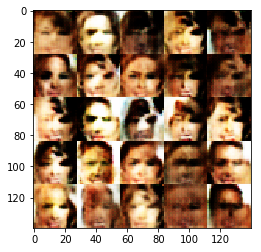

10501Epcho 1/1... Discriminator Loss: 1.3417... Generator Loss: 2.1625
10502Epcho 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.4046
10503Epcho 1/1... Discriminator Loss: 1.0550... Generator Loss: 1.9774
10504Epcho 1/1... Discriminator Loss: 1.6194... Generator Loss: 0.3129
10505Epcho 1/1... Discriminator Loss: 1.7511... Generator Loss: 2.4615
10506Epcho 1/1... Discriminator Loss: 1.8150... Generator Loss: 0.2555
10507Epcho 1/1... Discriminator Loss: 1.4664... Generator Loss: 1.8267
10508Epcho 1/1... Discriminator Loss: 1.3749... Generator Loss: 0.4149
10509Epcho 1/1... Discriminator Loss: 0.8260... Generator Loss: 2.6508
10510Epcho 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.5090
10511Epcho 1/1... Discriminator Loss: 0.7767... Generator Loss: 2.8571
10512Epcho 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.5664
10513Epcho 1/1... Discriminator Loss: 1.1728... Generator Loss: 2.1059
10514Epcho 1/1... Discriminator Loss: 0.7332... Generator Loss: 1.3785
10515E

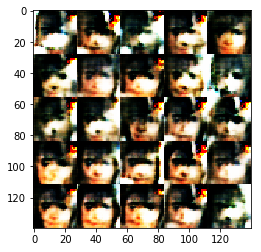

10601Epcho 1/1... Discriminator Loss: 0.3184... Generator Loss: 2.1788
10602Epcho 1/1... Discriminator Loss: 0.3909... Generator Loss: 2.7190
10603Epcho 1/1... Discriminator Loss: 0.1897... Generator Loss: 3.0617
10604Epcho 1/1... Discriminator Loss: 0.0657... Generator Loss: 5.1199
10605Epcho 1/1... Discriminator Loss: 0.0691... Generator Loss: 4.9673
10606Epcho 1/1... Discriminator Loss: 0.1912... Generator Loss: 3.1784
10607Epcho 1/1... Discriminator Loss: 0.1972... Generator Loss: 3.5981
10608Epcho 1/1... Discriminator Loss: 0.2395... Generator Loss: 2.7245
10609Epcho 1/1... Discriminator Loss: 0.1706... Generator Loss: 5.1063
10610Epcho 1/1... Discriminator Loss: 0.1546... Generator Loss: 3.0586
10611Epcho 1/1... Discriminator Loss: 0.1826... Generator Loss: 2.9290
10612Epcho 1/1... Discriminator Loss: 0.1618... Generator Loss: 2.8993
10613Epcho 1/1... Discriminator Loss: 0.1178... Generator Loss: 6.2094
10614Epcho 1/1... Discriminator Loss: 0.3737... Generator Loss: 2.4948
10615E

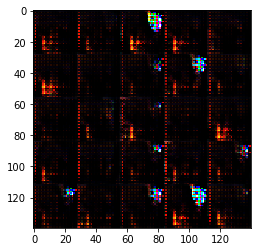

10701Epcho 1/1... Discriminator Loss: 0.0203... Generator Loss: 4.5072
10702Epcho 1/1... Discriminator Loss: 0.0152... Generator Loss: 4.5799
10703Epcho 1/1... Discriminator Loss: 0.0146... Generator Loss: 4.6874
10704Epcho 1/1... Discriminator Loss: 0.0166... Generator Loss: 4.9073
10705Epcho 1/1... Discriminator Loss: 0.0120... Generator Loss: 5.0278
10706Epcho 1/1... Discriminator Loss: 0.0118... Generator Loss: 5.0862
10707Epcho 1/1... Discriminator Loss: 0.0118... Generator Loss: 5.2806
10708Epcho 1/1... Discriminator Loss: 0.0118... Generator Loss: 5.1465
10709Epcho 1/1... Discriminator Loss: 0.0089... Generator Loss: 5.2562
10710Epcho 1/1... Discriminator Loss: 0.0138... Generator Loss: 5.1634
10711Epcho 1/1... Discriminator Loss: 0.0113... Generator Loss: 5.2915
10712Epcho 1/1... Discriminator Loss: 0.0106... Generator Loss: 5.2094
10713Epcho 1/1... Discriminator Loss: 0.0086... Generator Loss: 5.3693
10714Epcho 1/1... Discriminator Loss: 0.0129... Generator Loss: 5.1367
10715E

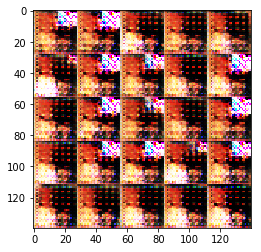

10801Epcho 1/1... Discriminator Loss: 0.4866... Generator Loss: 6.0413
10802Epcho 1/1... Discriminator Loss: 0.1983... Generator Loss: 6.9199
10803Epcho 1/1... Discriminator Loss: 0.0178... Generator Loss: 7.8056
10804Epcho 1/1... Discriminator Loss: 0.0288... Generator Loss: 5.7156
10805Epcho 1/1... Discriminator Loss: 0.0751... Generator Loss: 4.1956
10806Epcho 1/1... Discriminator Loss: 0.0518... Generator Loss: 5.0952
10807Epcho 1/1... Discriminator Loss: 0.0204... Generator Loss: 7.3951
10808Epcho 1/1... Discriminator Loss: 0.2520... Generator Loss: 2.6068
10809Epcho 1/1... Discriminator Loss: 0.1415... Generator Loss: 5.9898
10810Epcho 1/1... Discriminator Loss: 0.0509... Generator Loss: 4.9907
10811Epcho 1/1... Discriminator Loss: 0.0153... Generator Loss: 6.5363
10812Epcho 1/1... Discriminator Loss: 0.5096... Generator Loss: 1.3737
10813Epcho 1/1... Discriminator Loss: 2.7757... Generator Loss: 6.4950
10814Epcho 1/1... Discriminator Loss: 3.7201... Generator Loss: 0.0711
10815E

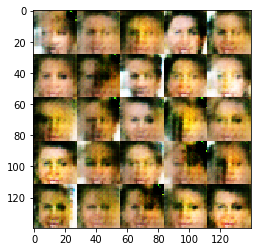

10901Epcho 1/1... Discriminator Loss: 1.9477... Generator Loss: 0.2175
10902Epcho 1/1... Discriminator Loss: 1.4577... Generator Loss: 2.6534
10903Epcho 1/1... Discriminator Loss: 1.2683... Generator Loss: 0.6077
10904Epcho 1/1... Discriminator Loss: 1.2368... Generator Loss: 1.6173
10905Epcho 1/1... Discriminator Loss: 1.1186... Generator Loss: 0.6676
10906Epcho 1/1... Discriminator Loss: 0.9618... Generator Loss: 1.6227
10907Epcho 1/1... Discriminator Loss: 0.9882... Generator Loss: 1.4907
10908Epcho 1/1... Discriminator Loss: 1.1775... Generator Loss: 0.6808
10909Epcho 1/1... Discriminator Loss: 1.0381... Generator Loss: 1.1948
10910Epcho 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.5793
10911Epcho 1/1... Discriminator Loss: 1.3253... Generator Loss: 1.9162
10912Epcho 1/1... Discriminator Loss: 1.4552... Generator Loss: 0.4509
10913Epcho 1/1... Discriminator Loss: 1.5369... Generator Loss: 0.8105
10914Epcho 1/1... Discriminator Loss: 1.2932... Generator Loss: 1.4736
10915E

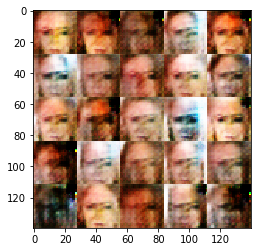

11001Epcho 1/1... Discriminator Loss: 0.9611... Generator Loss: 1.9523
11002Epcho 1/1... Discriminator Loss: 1.3180... Generator Loss: 0.5605
11003Epcho 1/1... Discriminator Loss: 1.0700... Generator Loss: 1.8790
11004Epcho 1/1... Discriminator Loss: 1.1152... Generator Loss: 0.6199
11005Epcho 1/1... Discriminator Loss: 0.7438... Generator Loss: 1.6589
11006Epcho 1/1... Discriminator Loss: 1.1922... Generator Loss: 0.5396
11007Epcho 1/1... Discriminator Loss: 1.1150... Generator Loss: 1.1087
11008Epcho 1/1... Discriminator Loss: 1.0022... Generator Loss: 0.9551
11009Epcho 1/1... Discriminator Loss: 0.9439... Generator Loss: 1.0355
11010Epcho 1/1... Discriminator Loss: 1.4536... Generator Loss: 0.7756
11011Epcho 1/1... Discriminator Loss: 1.0778... Generator Loss: 1.2599
11012Epcho 1/1... Discriminator Loss: 1.1737... Generator Loss: 0.6335
11013Epcho 1/1... Discriminator Loss: 1.2057... Generator Loss: 1.5905
11014Epcho 1/1... Discriminator Loss: 1.0195... Generator Loss: 0.8894
11015E

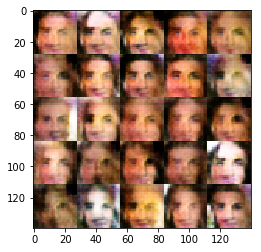

11101Epcho 1/1... Discriminator Loss: 1.1886... Generator Loss: 0.9064
11102Epcho 1/1... Discriminator Loss: 1.0273... Generator Loss: 0.9759
11103Epcho 1/1... Discriminator Loss: 0.7492... Generator Loss: 1.5585
11104Epcho 1/1... Discriminator Loss: 1.0527... Generator Loss: 0.8318
11105Epcho 1/1... Discriminator Loss: 1.0073... Generator Loss: 1.1006
11106Epcho 1/1... Discriminator Loss: 1.0497... Generator Loss: 1.0895
11107Epcho 1/1... Discriminator Loss: 0.9457... Generator Loss: 1.0755
11108Epcho 1/1... Discriminator Loss: 0.8004... Generator Loss: 1.5348
11109Epcho 1/1... Discriminator Loss: 1.8497... Generator Loss: 0.2501
11110Epcho 1/1... Discriminator Loss: 1.4291... Generator Loss: 2.7074
11111Epcho 1/1... Discriminator Loss: 1.5965... Generator Loss: 0.3088
11112Epcho 1/1... Discriminator Loss: 1.1684... Generator Loss: 1.7029
11113Epcho 1/1... Discriminator Loss: 1.3732... Generator Loss: 0.4353
11114Epcho 1/1... Discriminator Loss: 1.0132... Generator Loss: 1.6865
11115E

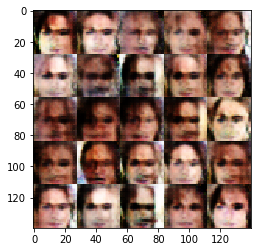

11201Epcho 1/1... Discriminator Loss: 1.0440... Generator Loss: 1.0985
11202Epcho 1/1... Discriminator Loss: 1.0952... Generator Loss: 0.6718
11203Epcho 1/1... Discriminator Loss: 1.1233... Generator Loss: 2.2235
11204Epcho 1/1... Discriminator Loss: 1.2540... Generator Loss: 0.5545
11205Epcho 1/1... Discriminator Loss: 1.0122... Generator Loss: 1.7937
11206Epcho 1/1... Discriminator Loss: 0.9798... Generator Loss: 0.8207
11207Epcho 1/1... Discriminator Loss: 0.8140... Generator Loss: 1.7609
11208Epcho 1/1... Discriminator Loss: 0.7952... Generator Loss: 0.9873
11209Epcho 1/1... Discriminator Loss: 0.7196... Generator Loss: 1.8230
11210Epcho 1/1... Discriminator Loss: 0.7060... Generator Loss: 1.0087
11211Epcho 1/1... Discriminator Loss: 0.5285... Generator Loss: 2.2067
11212Epcho 1/1... Discriminator Loss: 0.7007... Generator Loss: 0.9818
11213Epcho 1/1... Discriminator Loss: 0.7395... Generator Loss: 1.9576
11214Epcho 1/1... Discriminator Loss: 0.8864... Generator Loss: 0.9548
11215E

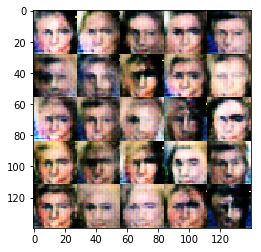

11301Epcho 1/1... Discriminator Loss: 1.0874... Generator Loss: 0.7291
11302Epcho 1/1... Discriminator Loss: 0.5737... Generator Loss: 3.0395
11303Epcho 1/1... Discriminator Loss: 0.4236... Generator Loss: 1.7169
11304Epcho 1/1... Discriminator Loss: 0.4484... Generator Loss: 2.0175
11305Epcho 1/1... Discriminator Loss: 1.6315... Generator Loss: 0.4678
11306Epcho 1/1... Discriminator Loss: 1.3289... Generator Loss: 4.8768
11307Epcho 1/1... Discriminator Loss: 0.9181... Generator Loss: 0.7793
11308Epcho 1/1... Discriminator Loss: 0.5753... Generator Loss: 2.8679
11309Epcho 1/1... Discriminator Loss: 1.3440... Generator Loss: 0.4114
11310Epcho 1/1... Discriminator Loss: 0.8299... Generator Loss: 2.4594
11311Epcho 1/1... Discriminator Loss: 0.7885... Generator Loss: 1.0779
11312Epcho 1/1... Discriminator Loss: 0.5226... Generator Loss: 2.2248
11313Epcho 1/1... Discriminator Loss: 0.7883... Generator Loss: 0.9492
11314Epcho 1/1... Discriminator Loss: 0.4997... Generator Loss: 3.9264
11315E

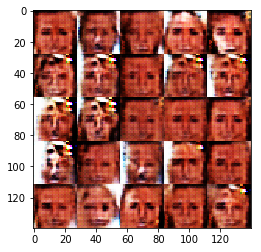

11401Epcho 1/1... Discriminator Loss: 0.1438... Generator Loss: 3.3552
11402Epcho 1/1... Discriminator Loss: 0.0596... Generator Loss: 4.8173
11403Epcho 1/1... Discriminator Loss: 0.1877... Generator Loss: 2.4574
11404Epcho 1/1... Discriminator Loss: 0.1400... Generator Loss: 3.1009
11405Epcho 1/1... Discriminator Loss: 0.0878... Generator Loss: 4.0913
11406Epcho 1/1... Discriminator Loss: 0.1785... Generator Loss: 2.4917
11407Epcho 1/1... Discriminator Loss: 0.0658... Generator Loss: 5.4603
11408Epcho 1/1... Discriminator Loss: 0.3074... Generator Loss: 1.8089
11409Epcho 1/1... Discriminator Loss: 0.0953... Generator Loss: 4.5006
11410Epcho 1/1... Discriminator Loss: 0.2195... Generator Loss: 2.2213
11411Epcho 1/1... Discriminator Loss: 0.1436... Generator Loss: 3.3779
11412Epcho 1/1... Discriminator Loss: 0.1129... Generator Loss: 4.5856
11413Epcho 1/1... Discriminator Loss: 0.2143... Generator Loss: 2.5543
11414Epcho 1/1... Discriminator Loss: 0.1295... Generator Loss: 3.7872
11415E

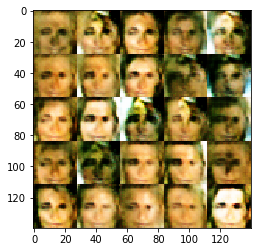

11501Epcho 1/1... Discriminator Loss: 0.8236... Generator Loss: 1.9478
11502Epcho 1/1... Discriminator Loss: 0.9308... Generator Loss: 0.7002
11503Epcho 1/1... Discriminator Loss: 1.0175... Generator Loss: 1.6862
11504Epcho 1/1... Discriminator Loss: 0.6022... Generator Loss: 2.3601
11505Epcho 1/1... Discriminator Loss: 1.0140... Generator Loss: 0.7700
11506Epcho 1/1... Discriminator Loss: 0.6945... Generator Loss: 4.8459
11507Epcho 1/1... Discriminator Loss: 0.2180... Generator Loss: 3.9998
11508Epcho 1/1... Discriminator Loss: 0.5453... Generator Loss: 1.4993
11509Epcho 1/1... Discriminator Loss: 0.3123... Generator Loss: 4.7073
11510Epcho 1/1... Discriminator Loss: 0.4564... Generator Loss: 1.7646
11511Epcho 1/1... Discriminator Loss: 0.2919... Generator Loss: 6.3523
11512Epcho 1/1... Discriminator Loss: 0.4356... Generator Loss: 1.9145
11513Epcho 1/1... Discriminator Loss: 0.2365... Generator Loss: 4.8759
11514Epcho 1/1... Discriminator Loss: 0.6138... Generator Loss: 1.1683
11515E

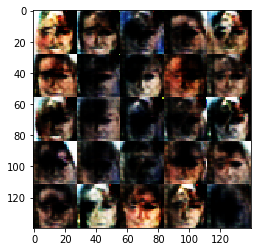

11601Epcho 1/1... Discriminator Loss: 0.1304... Generator Loss: 4.5323
11602Epcho 1/1... Discriminator Loss: 0.3251... Generator Loss: 1.6579
11603Epcho 1/1... Discriminator Loss: 0.2220... Generator Loss: 3.0075
11604Epcho 1/1... Discriminator Loss: 0.1826... Generator Loss: 3.2153
11605Epcho 1/1... Discriminator Loss: 0.4423... Generator Loss: 1.7820
11606Epcho 1/1... Discriminator Loss: 0.3361... Generator Loss: 2.5674
11607Epcho 1/1... Discriminator Loss: 0.2144... Generator Loss: 4.8773
11608Epcho 1/1... Discriminator Loss: 0.1849... Generator Loss: 4.0089
11609Epcho 1/1... Discriminator Loss: 0.1007... Generator Loss: 3.5142
11610Epcho 1/1... Discriminator Loss: 0.5756... Generator Loss: 1.2074
11611Epcho 1/1... Discriminator Loss: 1.4469... Generator Loss: 8.1108
11612Epcho 1/1... Discriminator Loss: 0.6773... Generator Loss: 2.4269
11613Epcho 1/1... Discriminator Loss: 0.9524... Generator Loss: 0.9893
11614Epcho 1/1... Discriminator Loss: 0.6888... Generator Loss: 2.3963
11615E

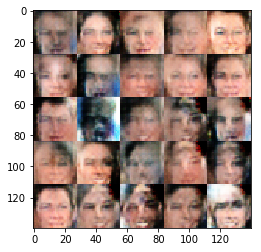

11701Epcho 1/1... Discriminator Loss: 1.6325... Generator Loss: 0.3316
11702Epcho 1/1... Discriminator Loss: 1.5083... Generator Loss: 1.6649
11703Epcho 1/1... Discriminator Loss: 1.4765... Generator Loss: 0.5418
11704Epcho 1/1... Discriminator Loss: 1.3224... Generator Loss: 1.3421
11705Epcho 1/1... Discriminator Loss: 1.0835... Generator Loss: 0.9278
11706Epcho 1/1... Discriminator Loss: 1.1602... Generator Loss: 0.9274
11707Epcho 1/1... Discriminator Loss: 1.0903... Generator Loss: 1.0279
11708Epcho 1/1... Discriminator Loss: 1.1142... Generator Loss: 0.8277
11709Epcho 1/1... Discriminator Loss: 1.1162... Generator Loss: 1.1671
11710Epcho 1/1... Discriminator Loss: 1.3096... Generator Loss: 0.8296
11711Epcho 1/1... Discriminator Loss: 1.2235... Generator Loss: 1.0446
11712Epcho 1/1... Discriminator Loss: 1.4968... Generator Loss: 0.5588
11713Epcho 1/1... Discriminator Loss: 1.4299... Generator Loss: 0.8332
11714Epcho 1/1... Discriminator Loss: 1.2181... Generator Loss: 0.6379
11715E

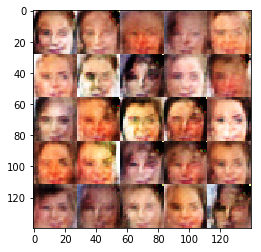

11801Epcho 1/1... Discriminator Loss: 1.4924... Generator Loss: 1.6690
11802Epcho 1/1... Discriminator Loss: 1.2213... Generator Loss: 0.5679
11803Epcho 1/1... Discriminator Loss: 1.0342... Generator Loss: 1.3776
11804Epcho 1/1... Discriminator Loss: 1.4573... Generator Loss: 0.4433
11805Epcho 1/1... Discriminator Loss: 1.2237... Generator Loss: 1.6332
11806Epcho 1/1... Discriminator Loss: 1.0184... Generator Loss: 0.6928
11807Epcho 1/1... Discriminator Loss: 0.9849... Generator Loss: 0.8906
11808Epcho 1/1... Discriminator Loss: 1.0774... Generator Loss: 1.2512
11809Epcho 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.5340
11810Epcho 1/1... Discriminator Loss: 1.0612... Generator Loss: 1.2122
11811Epcho 1/1... Discriminator Loss: 1.3734... Generator Loss: 0.9470
11812Epcho 1/1... Discriminator Loss: 1.1710... Generator Loss: 0.9001
11813Epcho 1/1... Discriminator Loss: 1.1013... Generator Loss: 0.7179
11814Epcho 1/1... Discriminator Loss: 1.4222... Generator Loss: 1.3303
11815E

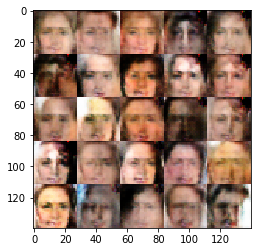

11901Epcho 1/1... Discriminator Loss: 1.1757... Generator Loss: 1.0052
11902Epcho 1/1... Discriminator Loss: 1.3167... Generator Loss: 0.4632
11903Epcho 1/1... Discriminator Loss: 1.2689... Generator Loss: 1.4968
11904Epcho 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.4454
11905Epcho 1/1... Discriminator Loss: 1.0774... Generator Loss: 1.2957
11906Epcho 1/1... Discriminator Loss: 1.1529... Generator Loss: 0.7696
11907Epcho 1/1... Discriminator Loss: 1.0678... Generator Loss: 0.9086
11908Epcho 1/1... Discriminator Loss: 1.3240... Generator Loss: 0.6281
11909Epcho 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.8120
11910Epcho 1/1... Discriminator Loss: 1.2643... Generator Loss: 0.8440
11911Epcho 1/1... Discriminator Loss: 1.0846... Generator Loss: 0.8177
11912Epcho 1/1... Discriminator Loss: 1.1014... Generator Loss: 0.7618
11913Epcho 1/1... Discriminator Loss: 1.0609... Generator Loss: 0.8834
11914Epcho 1/1... Discriminator Loss: 1.5452... Generator Loss: 0.4779
11915E

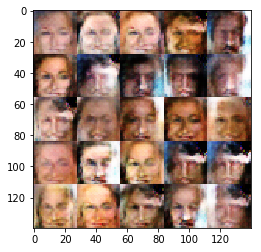

12001Epcho 1/1... Discriminator Loss: 1.5344... Generator Loss: 1.2609
12002Epcho 1/1... Discriminator Loss: 1.5816... Generator Loss: 0.3286
12003Epcho 1/1... Discriminator Loss: 1.5021... Generator Loss: 1.5459
12004Epcho 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.4747
12005Epcho 1/1... Discriminator Loss: 1.2391... Generator Loss: 1.1162
12006Epcho 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.5076
12007Epcho 1/1... Discriminator Loss: 1.1536... Generator Loss: 1.0131
12008Epcho 1/1... Discriminator Loss: 1.2481... Generator Loss: 0.6628
12009Epcho 1/1... Discriminator Loss: 1.1125... Generator Loss: 0.9933
12010Epcho 1/1... Discriminator Loss: 1.2104... Generator Loss: 0.5600
12011Epcho 1/1... Discriminator Loss: 1.2872... Generator Loss: 1.3478
12012Epcho 1/1... Discriminator Loss: 1.4951... Generator Loss: 0.3842
12013Epcho 1/1... Discriminator Loss: 1.2768... Generator Loss: 1.3808
12014Epcho 1/1... Discriminator Loss: 1.2058... Generator Loss: 0.5987
12015E

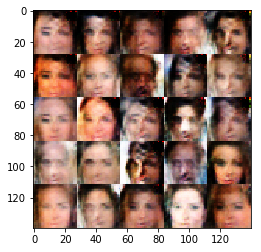

12101Epcho 1/1... Discriminator Loss: 1.3598... Generator Loss: 0.4202
12102Epcho 1/1... Discriminator Loss: 1.2745... Generator Loss: 0.9736
12103Epcho 1/1... Discriminator Loss: 1.2089... Generator Loss: 0.9003
12104Epcho 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.5561
12105Epcho 1/1... Discriminator Loss: 1.6449... Generator Loss: 1.5797
12106Epcho 1/1... Discriminator Loss: 1.6662... Generator Loss: 0.2735
12107Epcho 1/1... Discriminator Loss: 1.4132... Generator Loss: 1.6486
12108Epcho 1/1... Discriminator Loss: 1.3341... Generator Loss: 0.5165
12109Epcho 1/1... Discriminator Loss: 1.0007... Generator Loss: 1.0576
12110Epcho 1/1... Discriminator Loss: 1.0828... Generator Loss: 0.8431
12111Epcho 1/1... Discriminator Loss: 1.1401... Generator Loss: 0.7399
12112Epcho 1/1... Discriminator Loss: 1.2984... Generator Loss: 1.0380
12113Epcho 1/1... Discriminator Loss: 1.4240... Generator Loss: 0.4426
12114Epcho 1/1... Discriminator Loss: 1.3643... Generator Loss: 1.3281
12115E

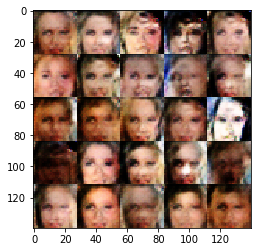

12201Epcho 1/1... Discriminator Loss: 1.6027... Generator Loss: 0.3489
12202Epcho 1/1... Discriminator Loss: 1.3669... Generator Loss: 1.3627
12203Epcho 1/1... Discriminator Loss: 1.3958... Generator Loss: 0.4426
12204Epcho 1/1... Discriminator Loss: 1.2197... Generator Loss: 1.2558
12205Epcho 1/1... Discriminator Loss: 1.2296... Generator Loss: 0.5499
12206Epcho 1/1... Discriminator Loss: 1.3035... Generator Loss: 1.0665
12207Epcho 1/1... Discriminator Loss: 1.3323... Generator Loss: 0.4887
12208Epcho 1/1... Discriminator Loss: 1.3183... Generator Loss: 1.3237
12209Epcho 1/1... Discriminator Loss: 1.3557... Generator Loss: 0.4721
12210Epcho 1/1... Discriminator Loss: 1.1850... Generator Loss: 1.0423
12211Epcho 1/1... Discriminator Loss: 1.3689... Generator Loss: 0.5228
12212Epcho 1/1... Discriminator Loss: 1.2829... Generator Loss: 1.1436
12213Epcho 1/1... Discriminator Loss: 1.4579... Generator Loss: 0.4433
12214Epcho 1/1... Discriminator Loss: 1.2193... Generator Loss: 1.0418
12215E

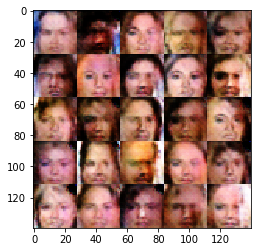

12301Epcho 1/1... Discriminator Loss: 1.0696... Generator Loss: 0.8958
12302Epcho 1/1... Discriminator Loss: 1.0188... Generator Loss: 0.7970
12303Epcho 1/1... Discriminator Loss: 1.4587... Generator Loss: 0.4747
12304Epcho 1/1... Discriminator Loss: 1.2898... Generator Loss: 1.1840
12305Epcho 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.4531
12306Epcho 1/1... Discriminator Loss: 1.3853... Generator Loss: 1.2973
12307Epcho 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.4969
12308Epcho 1/1... Discriminator Loss: 1.4311... Generator Loss: 1.2196
12309Epcho 1/1... Discriminator Loss: 1.4946... Generator Loss: 0.4568
12310Epcho 1/1... Discriminator Loss: 1.3393... Generator Loss: 0.8390
12311Epcho 1/1... Discriminator Loss: 1.2207... Generator Loss: 0.7833
12312Epcho 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.4923
12313Epcho 1/1... Discriminator Loss: 1.3145... Generator Loss: 1.1458
12314Epcho 1/1... Discriminator Loss: 1.2863... Generator Loss: 0.5997
12315E

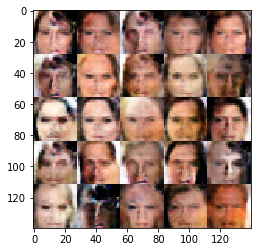

12401Epcho 1/1... Discriminator Loss: 1.2060... Generator Loss: 0.9796
12402Epcho 1/1... Discriminator Loss: 1.1924... Generator Loss: 0.5683
12403Epcho 1/1... Discriminator Loss: 1.2369... Generator Loss: 1.1862
12404Epcho 1/1... Discriminator Loss: 1.3349... Generator Loss: 0.5355
12405Epcho 1/1... Discriminator Loss: 1.2959... Generator Loss: 1.4648
12406Epcho 1/1... Discriminator Loss: 1.4886... Generator Loss: 0.3708
12407Epcho 1/1... Discriminator Loss: 1.2763... Generator Loss: 1.2762
12408Epcho 1/1... Discriminator Loss: 1.1635... Generator Loss: 0.6093
12409Epcho 1/1... Discriminator Loss: 1.1818... Generator Loss: 0.9981
12410Epcho 1/1... Discriminator Loss: 1.1850... Generator Loss: 0.6860
12411Epcho 1/1... Discriminator Loss: 1.2017... Generator Loss: 1.0945
12412Epcho 1/1... Discriminator Loss: 1.1902... Generator Loss: 0.5981
12413Epcho 1/1... Discriminator Loss: 1.1840... Generator Loss: 1.1828
12414Epcho 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.4478
12415E

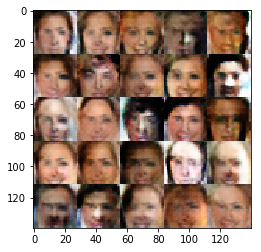

12501Epcho 1/1... Discriminator Loss: 1.2577... Generator Loss: 0.6338
12502Epcho 1/1... Discriminator Loss: 1.2623... Generator Loss: 0.8944
12503Epcho 1/1... Discriminator Loss: 1.1823... Generator Loss: 0.7261
12504Epcho 1/1... Discriminator Loss: 1.2821... Generator Loss: 0.6815
12505Epcho 1/1... Discriminator Loss: 1.1181... Generator Loss: 0.8336
12506Epcho 1/1... Discriminator Loss: 1.1551... Generator Loss: 0.8376
12507Epcho 1/1... Discriminator Loss: 1.0047... Generator Loss: 0.8561
12508Epcho 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.5655
12509Epcho 1/1... Discriminator Loss: 1.3132... Generator Loss: 0.9806
12510Epcho 1/1... Discriminator Loss: 1.3898... Generator Loss: 0.5332
12511Epcho 1/1... Discriminator Loss: 1.2463... Generator Loss: 1.0840
12512Epcho 1/1... Discriminator Loss: 1.2148... Generator Loss: 0.5660
12513Epcho 1/1... Discriminator Loss: 1.2119... Generator Loss: 1.1223
12514Epcho 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.4423
12515E

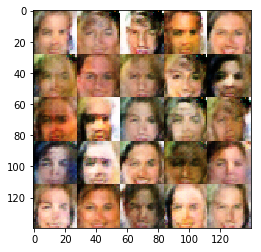

12601Epcho 1/1... Discriminator Loss: 1.2891... Generator Loss: 0.4522
12602Epcho 1/1... Discriminator Loss: 1.2916... Generator Loss: 1.1472
12603Epcho 1/1... Discriminator Loss: 1.4524... Generator Loss: 0.4188
12604Epcho 1/1... Discriminator Loss: 1.3577... Generator Loss: 1.4129
12605Epcho 1/1... Discriminator Loss: 1.4174... Generator Loss: 0.4160
12606Epcho 1/1... Discriminator Loss: 1.3950... Generator Loss: 1.3293
12607Epcho 1/1... Discriminator Loss: 1.2147... Generator Loss: 0.6760
12608Epcho 1/1... Discriminator Loss: 1.2360... Generator Loss: 0.9074
12609Epcho 1/1... Discriminator Loss: 1.2298... Generator Loss: 0.5380
12610Epcho 1/1... Discriminator Loss: 1.1529... Generator Loss: 1.0549
12611Epcho 1/1... Discriminator Loss: 1.2549... Generator Loss: 0.5814
12612Epcho 1/1... Discriminator Loss: 1.3104... Generator Loss: 1.0294
12613Epcho 1/1... Discriminator Loss: 1.2306... Generator Loss: 0.5673
12614Epcho 1/1... Discriminator Loss: 1.2821... Generator Loss: 1.0642
12615E

In [108]:
batch_size = 16
z_dim = 100
learning_rate = 0.01
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.